In [1]:
from google.colab import files
files.upload()  # this will prompt you to upload the kaggle.json


Saving kaggle_.json to kaggle_.json


{'kaggle_.json': b'{"username":"neelgandhi108","key":"2ee4e91ae57985b031abd3d66541de2d"}'}

In [2]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json  # set permission


kaggle.json


In [3]:

!kaggle datasets download -d borismarjanovic/price-volume-data-for-all-us-stocks-etfs

 98% 483M/492M [00:06<00:00, 110MB/s]
100% 492M/492M [00:06<00:00, 83.4MB/s]


In [4]:
!unzip /content/price-volume-data-for-all-us-stocks-etfs.zip -d /content/Stock_Data


Streaming output truncated to the last 5000 lines.
  inflating: /content/Stock_Data/Stocks/ergf.us.txt  
  inflating: /content/Stock_Data/Stocks/erh.us.txt  
  inflating: /content/Stock_Data/Stocks/eri.us.txt  
  inflating: /content/Stock_Data/Stocks/eric.us.txt  
  inflating: /content/Stock_Data/Stocks/erie.us.txt  
  inflating: /content/Stock_Data/Stocks/erii.us.txt  
  inflating: /content/Stock_Data/Stocks/erj.us.txt  
  inflating: /content/Stock_Data/Stocks/erm.us.txt  
  inflating: /content/Stock_Data/Stocks/ern.us.txt  
  inflating: /content/Stock_Data/Stocks/eros.us.txt  
  inflating: /content/Stock_Data/Stocks/eryp.us.txt  
  inflating: /content/Stock_Data/Stocks/es.us.txt  
  inflating: /content/Stock_Data/Stocks/esba.us.txt  
  inflating: /content/Stock_Data/Stocks/esbk.us.txt  
  inflating: /content/Stock_Data/Stocks/esca.us.txt  
  inflating: /content/Stock_Data/Stocks/esdi.us.txt  
  inflating: /content/Stock_Data/Stocks/esdiw.us.txt  
  inflating: /content/Stock_Data/Stoc

# Stock Market Visualization

In [5]:
# Import Modules

import numpy as np
import pandas as pd
import os
import random
import copy
import matplotlib.pyplot as plt
import pandas

## Read the data from Stock folder

### Check how much data is available? 

In [6]:
import os
import pandas as pd
import copy
import numpy as np
import matplotlib.pyplot as plt
os.chdir('/content/Stock_Data/Data/Stocks')
list = os.listdir()
number_files = len(list)
print(number_files)

7195


### Choose 8 random stock data for analysis

In [7]:
#filenames = [x for x in os.listdir("./Stocks/") if x.endswith('.txt') and os.path.getsize(x) > 0]
import random
filenames = random.sample([x for x in os.listdir() if x.endswith('.txt') 
                           and os.path.getsize(os.path.join('',x)) > 0], 8)
print(filenames)

['gtyh.us.txt', 'trow.us.txt', 'le.us.txt', 'momo.us.txt', 'ceco.us.txt', 'tdy.us.txt', 'nuw.us.txt', 'se.us.txt']


### Read data into dataframes

In [8]:
data = []
for filename in filenames:
    df = pd.read_csv(os.path.join('',filename), sep=',')
    label, _, _ = filename.split(sep='.')
    df['Label'] = label
    df['Date'] = pd.to_datetime(df['Date'])

    data.append(df)

In [9]:
data[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label
0,2016-11-18,10.15,10.15,9.80,10.15,600,0,gtyh
1,2016-12-16,10.15,10.15,10.15,10.15,8109,0,gtyh
2,2016-12-20,10.51,11.02,10.51,11.02,200,0,gtyh
3,2016-12-21,9.80,9.80,9.80,9.80,2000,0,gtyh
4,2016-12-22,10.00,10.00,10.00,10.00,200,0,gtyh


In [10]:
print(len(data))

8


## Add various Technical Indicators in the dataframe

There are many types of Technical Indicators. 
The Technical Indicators we are considering are:
- RSI, Volume (plain), Bollinger Bands, Aroon, Price Volume Trend, acceleration bands
- Stochastic, Chaikin Money Flow, Parabolic SAR, Rate of Change, Volume weighted average Price, momentum
- Commodity Channel Index, On Balance Volume, Keltner Channels, Triple Exponential Moving Average, Normalized Averager True Range ,directional movement indicators
- MACD, Money flowindex , Ichimoku, William %R, Volume MINMAX, adaptive moving average

In [11]:
TechIndicator = copy.deepcopy(data)

### Calculation of Relative Strength Index (RSI)

In [12]:
# Relative Strength Index
# Avg(PriceUp)/(Avg(PriceUP)+Avg(PriceDown)*100
# Where: PriceUp(t)=1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)>0};
#        PriceDown(t)=-1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)<0};

def rsi(values):
    up = values[values>0].mean()
    down = -1*values[values<0].mean()
    return 100 * up / (up + down)


In [13]:
# Add Momentum_1D column for all 15 stocks.
# Momentum_1D = P(t) - P(t-1)
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum_1D'] = (TechIndicator[stock]['Close']-TechIndicator[stock]['Close'].shift(1)).fillna(0)
    TechIndicator[stock]['RSI_14D'] = TechIndicator[stock]['Momentum_1D'].rolling(center=False, window=14).apply(rsi).fillna(0)
TechIndicator[0].tail(5)

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D
101,2017-11-01,9.9900,10.08,9.9500,10.02,10811,0,gtyh,0.03,60.264901
102,2017-11-02,9.9300,10.09,9.9300,10.09,271,0,gtyh,0.07,63.157895
103,2017-11-07,9.9897,10.08,9.9897,10.08,216,0,gtyh,-0.01,70.588235
104,2017-11-08,9.9900,10.10,9.9900,10.10,2873,0,gtyh,0.02,70.588235
105,2017-11-09,9.9400,10.09,9.9300,10.09,3659,0,gtyh,-0.01,77.419355


In [14]:
### Calculation of Volume (Plain)m

In [15]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Volume_plain'] = TechIndicator[stock]['Volume'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain
101,2017-11-01,9.9900,10.08,9.9500,10.02,10811,0,gtyh,0.03,60.264901,10811
102,2017-11-02,9.9300,10.09,9.9300,10.09,271,0,gtyh,0.07,63.157895,271
103,2017-11-07,9.9897,10.08,9.9897,10.08,216,0,gtyh,-0.01,70.588235,216
104,2017-11-08,9.9900,10.10,9.9900,10.10,2873,0,gtyh,0.02,70.588235,2873
105,2017-11-09,9.9400,10.09,9.9300,10.09,3659,0,gtyh,-0.01,77.419355,3659


### Calculation of Bollinger Bands

In [16]:
def bbands(price, length=30, numsd=2):
    """ returns average, upper band, and lower band"""
    #ave = pd.stats.moments.rolling_mean(price,length)
    ave = price.rolling(window = length, center = False).mean()
    #sd = pd.stats.moments.rolling_std(price,length)
    sd = price.rolling(window = length, center = False).std()
    upband = ave + (sd*numsd)
    dnband = ave - (sd*numsd)
    return np.round(ave,3), np.round(upband,3), np.round(dnband,3)

In [17]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['BB_Middle_Band'], TechIndicator[stock]['BB_Upper_Band'], TechIndicator[stock]['BB_Lower_Band'] = bbands(TechIndicator[stock]['Close'], length=20, numsd=1)
    TechIndicator[stock]['BB_Middle_Band'] = TechIndicator[stock]['BB_Middle_Band'].fillna(0)
    TechIndicator[stock]['BB_Upper_Band'] = TechIndicator[stock]['BB_Upper_Band'].fillna(0)
    TechIndicator[stock]['BB_Lower_Band'] = TechIndicator[stock]['BB_Lower_Band'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band
101,2017-11-01,9.9900,10.08,9.9500,10.02,10811,0,gtyh,0.03,60.264901,10811,9.989,10.019,9.960
102,2017-11-02,9.9300,10.09,9.9300,10.09,271,0,gtyh,0.07,63.157895,271,9.991,10.025,9.957
103,2017-11-07,9.9897,10.08,9.9897,10.08,216,0,gtyh,-0.01,70.588235,216,9.996,10.035,9.957
104,2017-11-08,9.9900,10.10,9.9900,10.10,2873,0,gtyh,0.02,70.588235,2873,10.002,10.047,9.957
105,2017-11-09,9.9400,10.09,9.9300,10.09,3659,0,gtyh,-0.01,77.419355,3659,10.006,10.056,9.957


### Calculation of Aroon Oscillator

In [18]:
def aroon(df, tf=25):
    aroonup = []
    aroondown = []
    x = tf
    while x< len(df['Date']):
        aroon_up = ((df['High'][x-tf:x].tolist().index(max(df['High'][x-tf:x])))/float(tf))*100
        aroon_down = ((df['Low'][x-tf:x].tolist().index(min(df['Low'][x-tf:x])))/float(tf))*100
        aroonup.append(aroon_up)
        aroondown.append(aroon_down)
        x+=1
    return aroonup, aroondown

In [19]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 25
    up, down = aroon(TechIndicator[stock])
    aroon_list = [x - y for x, y in zip(up,down)]
    if len(aroon_list)==0:
        aroon_list = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Aroon_Oscillator'] = aroon_list
    else:
        TechIndicator[stock]['Aroon_Oscillator'] = listofzeros+aroon_list


### Calculation of Price Volume Trend

PVT = [((CurrentClose - PreviousClose) / PreviousClose) x Volume] + PreviousPVT

In [20]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]["PVT"] = (TechIndicator[stock]['Momentum_1D']/ TechIndicator[stock]['Close'].shift(1))*TechIndicator[stock]['Volume']
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"]-TechIndicator[stock]["PVT"].shift(1)
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT
101,2017-11-01,9.9900,10.08,9.9500,10.02,10811,0,gtyh,0.03,60.264901,10811,9.989,10.019,9.960,-40.0,-170.959660
102,2017-11-02,9.9300,10.09,9.9300,10.09,271,0,gtyh,0.07,63.157895,271,9.991,10.025,9.957,-40.0,-30.572252
103,2017-11-07,9.9897,10.08,9.9897,10.08,216,0,gtyh,-0.01,70.588235,216,9.996,10.035,9.957,-40.0,-2.107287
104,2017-11-08,9.9900,10.10,9.9900,10.10,2873,0,gtyh,0.02,70.588235,2873,10.002,10.047,9.957,-40.0,5.914470
105,2017-11-09,9.9400,10.09,9.9300,10.09,3659,0,gtyh,-0.01,77.419355,3659,10.006,10.056,9.957,-40.0,-9.323169


### Calculation of Acceleration Bands

In [21]:
def abands(df):
    #df['AB_Middle_Band'] = pd.rolling_mean(df['Close'], 20)
    df['AB_Middle_Band'] = df['Close'].rolling(window = 20, center=False).mean()
    # High * ( 1 + 4 * (High - Low) / (High + Low))
    df['aupband'] = df['High'] * (1 + 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Upper_Band'] = df['aupband'].rolling(window=20, center=False).mean()
    # Low *(1 - 4 * (High - Low)/ (High + Low))
    df['adownband'] = df['Low'] * (1 - 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Lower_Band'] = df['adownband'].rolling(window=20, center=False).mean()

In [22]:
for stock in range(len(TechIndicator)):
    abands(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,aupband,AB_Upper_Band,adownband,AB_Lower_Band
101,2017-11-01,9.9900,10.08,9.9500,10.02,10811,0,gtyh,0.03,60.264901,...,9.989,10.019,9.960,-40.0,-170.959660,9.98942,10.341687,10.164021,9.691687,9.806921
102,2017-11-02,9.9300,10.09,9.9300,10.09,271,0,gtyh,0.07,63.157895,...,9.991,10.025,9.957,-40.0,-30.572252,9.99100,10.412557,10.173858,9.612557,9.796358
103,2017-11-07,9.9897,10.08,9.9897,10.08,216,0,gtyh,-0.01,70.588235,...,9.996,10.035,9.957,-40.0,-2.107287,9.99600,10.261413,10.187929,9.809913,9.787854
104,2017-11-08,9.9900,10.10,9.9900,10.10,2873,0,gtyh,0.02,70.588235,...,10.002,10.047,9.957,-40.0,5.914470,10.00200,10.321205,10.204989,9.771205,9.777414
105,2017-11-09,9.9400,10.09,9.9300,10.09,3659,0,gtyh,-0.01,77.419355,...,10.006,10.056,9.957,-40.0,-9.323169,10.00650,10.412557,10.222112,9.612557,9.762037


## Drop unwanted columns

In [23]:
columns2Drop = ['Momentum_1D', 'aupband', 'adownband']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band
0,2016-11-18,10.15,10.15,9.80,10.15,600,0,gtyh,0.0,600,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,2016-12-16,10.15,10.15,10.15,10.15,8109,0,gtyh,0.0,8109,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2,2016-12-20,10.51,11.02,10.51,11.02,200,0,gtyh,0.0,200,0.0,0.0,0.0,0.0,17.142857,0.0,0.0,0.0
3,2016-12-21,9.80,9.80,9.80,9.80,2000,0,gtyh,0.0,2000,0.0,0.0,0.0,0.0,-238.558465,0.0,0.0,0.0
4,2016-12-22,10.00,10.00,10.00,10.00,200,0,gtyh,0.0,200,0.0,0.0,0.0,0.0,225.497241,0.0,0.0,0.0


### Calculation of Stochastic Oscillator (%K and %D)

In [24]:
def STOK(df, n):
    df['STOK'] = ((df['Close'] - df['Low'].rolling(window=n, center=False).mean()) / (df['High'].rolling(window=n, center=False).max() - df['Low'].rolling(window=n, center=False).min())) * 100
    df['STOD'] = df['STOK'].rolling(window = 3, center=False).mean()

In [25]:
for stock in range(len(TechIndicator)):
    STOK(TechIndicator[stock], 4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD
101,2017-11-01,9.9900,10.08,9.9500,10.02,10811,0,gtyh,60.264901,10811,9.989,10.019,9.960,-40.0,-170.959660,9.98942,10.164021,9.806921,38.636364,37.143494
102,2017-11-02,9.9300,10.09,9.9300,10.09,271,0,gtyh,63.157895,271,9.991,10.025,9.957,-40.0,-30.572252,9.99100,10.173858,9.796358,89.705882,56.996435
103,2017-11-07,9.9897,10.08,9.9897,10.08,216,0,gtyh,70.588235,216,9.996,10.035,9.957,-40.0,-2.107287,9.99600,10.187929,9.787854,78.171875,68.838040
104,2017-11-08,9.9900,10.10,9.9900,10.10,2873,0,gtyh,70.588235,2873,10.002,10.047,9.957,-40.0,5.914470,10.00200,10.204989,9.777414,79.455882,82.444547
105,2017-11-09,9.9400,10.09,9.9300,10.09,3659,0,gtyh,77.419355,3659,10.006,10.056,9.957,-40.0,-9.323169,10.00650,10.222112,9.762037,76.514706,78.047488


### Calculation of Chaikin Money Flow

In [26]:
def CMFlow(df, tf):
    CHMF = []
    MFMs = []
    MFVs = []
    x = tf
    
    while x < len(df['Date']):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        
        MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])
        MFV = MFM*PeriodVolume
        
        MFMs.append(MFM)
        MFVs.append(MFV)
        x+=1
    
    y = tf
    while y < len(MFVs):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        consider = MFVs[y-tf:y]
        tfsMFV = 0
        
        for eachMFV in consider:
            tfsMFV += eachMFV
        
        tfsCMF = tfsMFV/PeriodVolume
        CHMF.append(tfsCMF)
        y+=1
    return CHMF

In [27]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 40
    CHMF = CMFlow(TechIndicator[stock], 20)
    if len(CHMF)==0:
        CHMF = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Chaikin_MF'] = CHMF
    else:
        TechIndicator[stock]['Chaikin_MF'] = listofzeros+CHMF
TechIndicator[0].tail()

<ipython-input-26-9d42af651c40>:13: RuntimeWarning: invalid value encountered in double_scalars
  MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])
<ipython-input-26-9d42af651c40>:13: RuntimeWarning: invalid value encountered in double_scalars
  MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])
<ipython-input-26-9d42af651c40>:13: RuntimeWarning: invalid value encountered in double_scalars
  MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF
101,2017-11-01,9.9900,10.08,9.9500,10.02,10811,0,gtyh,60.264901,10811,...,10.019,9.960,-40.0,-170.959660,9.98942,10.164021,9.806921,38.636364,37.143494,NaN
102,2017-11-02,9.9300,10.09,9.9300,10.09,271,0,gtyh,63.157895,271,...,10.025,9.957,-40.0,-30.572252,9.99100,10.173858,9.796358,89.705882,56.996435,NaN
103,2017-11-07,9.9897,10.08,9.9897,10.08,216,0,gtyh,70.588235,216,...,10.035,9.957,-40.0,-2.107287,9.99600,10.187929,9.787854,78.171875,68.838040,NaN
104,2017-11-08,9.9900,10.10,9.9900,10.10,2873,0,gtyh,70.588235,2873,...,10.047,9.957,-40.0,5.914470,10.00200,10.204989,9.777414,79.455882,82.444547,NaN
105,2017-11-09,9.9400,10.09,9.9300,10.09,3659,0,gtyh,77.419355,3659,...,10.056,9.957,-40.0,-9.323169,10.00650,10.222112,9.762037,76.514706,78.047488,NaN


### Calculation of Parabolic SAR

In [28]:
def psar(df, iaf = 0.02, maxaf = 0.2):
    length = len(df)
    dates = (df['Date'])
    high = (df['High'])
    low = (df['Low'])
    close = (df['Close'])
    psar = df['Close'][0:len(df['Close'])]
    psarbull = [None] * length
    psarbear = [None] * length
    bull = True
    af = iaf
    ep = df['Low'][0]
    hp = df['High'][0]
    lp = df['Low'][0]
    for i in range(2,length):
        if bull:
            psar[i] = psar[i - 1] + af * (hp - psar[i - 1])
        else:
            psar[i] = psar[i - 1] + af * (lp - psar[i - 1])
        reverse = False
        if bull:
            if df['Low'][i] < psar[i]:
                bull = False
                reverse = True
                psar[i] = hp
                lp = df['Low'][i]
                af = iaf
        else:
            if df['High'][i] > psar[i]:
                bull = True
                reverse = True
                psar[i] = lp
                hp = df['High'][i]
                af = iaf
        if not reverse:
            if bull:
                if df['High'][i] > hp:
                    hp = df['High'][i]
                    af = min(af + iaf, maxaf)
                if df['Low'][i - 1] < psar[i]:
                    psar[i] = df['Low'][i - 1]
                if df['Low'][i - 2] < psar[i]:
                    psar[i] = df['Low'][i - 2]
            else:
                if df['Low'][i] < lp:
                    lp = df['Low'][i]
                    af = min(af + iaf, maxaf)
                if df['High'][i - 1] > psar[i]:
                    psar[i] = df['High'][i - 1]
                if df['High'][i - 2] > psar[i]:
                    psar[i] = df['High'][i - 2]
        if bull:
            psarbull[i] = psar[i]
        else:
            psarbear[i] = psar[i]
    #return {"dates":dates, "high":high, "low":low, "close":close, "psar":psar, "psarbear":psarbear, "psarbull":psarbull}
    #return psar, psarbear, psarbull
    df['psar'] = psar
    #df['psarbear'] = psarbear
    #df['psarbull'] = psarbull

In [29]:
for stock in range(len(TechIndicator)):
    psar(TechIndicator[stock])

TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar
101,2017-11-01,9.9900,10.08,9.9500,9.750000,10811,0,gtyh,60.264901,10811,...,9.960,-40.0,-170.959660,9.98942,10.164021,9.806921,38.636364,37.143494,NaN,9.750000
102,2017-11-02,9.9300,10.09,9.9300,9.756600,271,0,gtyh,63.157895,271,...,9.957,-40.0,-30.572252,9.99100,10.173858,9.796358,89.705882,56.996435,NaN,9.756600
103,2017-11-07,9.9897,10.08,9.9897,9.769936,216,0,gtyh,70.588235,216,...,9.957,-40.0,-2.107287,9.99600,10.187929,9.787854,78.171875,68.838040,NaN,9.769936
104,2017-11-08,9.9900,10.10,9.9900,9.782739,2873,0,gtyh,70.588235,2873,...,9.957,-40.0,5.914470,10.00200,10.204989,9.777414,79.455882,82.444547,NaN,9.782739
105,2017-11-09,9.9400,10.09,9.9300,9.801774,3659,0,gtyh,77.419355,3659,...,9.957,-40.0,-9.323169,10.00650,10.222112,9.762037,76.514706,78.047488,NaN,9.801774


### Calculation of Price Rate of Change

In [30]:
# ROC = [(Close - Close n periods ago) / (Close n periods ago)] * 100
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['ROC'] = ((TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(12))/(TechIndicator[stock]['Close'].shift(12)))*100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC
101,2017-11-01,9.9900,10.08,9.9500,9.750000,10811,0,gtyh,60.264901,10811,...,-40.0,-170.959660,9.98942,10.164021,9.806921,38.636364,37.143494,0.0,9.750000,-1.254898
102,2017-11-02,9.9300,10.09,9.9300,9.756600,271,0,gtyh,63.157895,271,...,-40.0,-30.572252,9.99100,10.173858,9.796358,89.705882,56.996435,0.0,9.756600,-1.233286
103,2017-11-07,9.9897,10.08,9.9897,9.769936,216,0,gtyh,70.588235,216,...,-40.0,-2.107287,9.99600,10.187929,9.787854,78.171875,68.838040,0.0,9.769936,-1.142632
104,2017-11-08,9.9900,10.10,9.9900,9.782739,2873,0,gtyh,70.588235,2873,...,-40.0,5.914470,10.00200,10.204989,9.777414,79.455882,82.444547,0.0,9.782739,-1.056567
105,2017-11-09,9.9400,10.09,9.9300,9.801774,3659,0,gtyh,77.419355,3659,...,-40.0,-9.323169,10.00650,10.222112,9.762037,76.514706,78.047488,0.0,9.801774,-0.906693


### Calculation of Volume Weighted Average Price

In [31]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['VWAP'] = np.cumsum(TechIndicator[stock]['Volume'] * (TechIndicator[stock]['High'] + TechIndicator[stock]['Low'])/2) / np.cumsum(TechIndicator[stock]['Volume'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP
101,2017-11-01,9.9900,10.08,9.9500,9.750000,10811,0,gtyh,60.264901,10811,...,-170.959660,9.98942,10.164021,9.806921,38.636364,37.143494,0.0,9.750000,-1.254898,9.919477
102,2017-11-02,9.9300,10.09,9.9300,9.756600,271,0,gtyh,63.157895,271,...,-30.572252,9.99100,10.173858,9.796358,89.705882,56.996435,0.0,9.756600,-1.233286,9.919483
103,2017-11-07,9.9897,10.08,9.9897,9.769936,216,0,gtyh,70.588235,216,...,-2.107287,9.99600,10.187929,9.787854,78.171875,68.838040,0.0,9.769936,-1.142632,9.919490
104,2017-11-08,9.9900,10.10,9.9900,9.782739,2873,0,gtyh,70.588235,2873,...,5.914470,10.00200,10.204989,9.777414,79.455882,82.444547,0.0,9.782739,-1.056567,9.919586
105,2017-11-09,9.9400,10.09,9.9300,9.801774,3659,0,gtyh,77.419355,3659,...,-9.323169,10.00650,10.222112,9.762037,76.514706,78.047488,0.0,9.801774,-0.906693,9.919674


### Calculation of Momentum 

In [32]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum'] = TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum
101,2017-11-01,9.9900,10.08,9.9500,9.750000,10811,0,gtyh,60.264901,10811,...,9.98942,10.164021,9.806921,38.636364,37.143494,0.0,9.750000,-1.254898,9.919477,-0.350000
102,2017-11-02,9.9300,10.09,9.9300,9.756600,271,0,gtyh,63.157895,271,...,9.99100,10.173858,9.796358,89.705882,56.996435,0.0,9.756600,-1.233286,9.919483,-0.336600
103,2017-11-07,9.9897,10.08,9.9897,9.769936,216,0,gtyh,70.588235,216,...,9.99600,10.187929,9.787854,78.171875,68.838040,0.0,9.769936,-1.142632,9.919490,-0.320064
104,2017-11-08,9.9900,10.10,9.9900,9.782739,2873,0,gtyh,70.588235,2873,...,10.00200,10.204989,9.777414,79.455882,82.444547,0.0,9.782739,-1.056567,9.919586,-0.293661
105,2017-11-09,9.9400,10.09,9.9300,9.801774,3659,0,gtyh,77.419355,3659,...,10.00650,10.222112,9.762037,76.514706,78.047488,0.0,9.801774,-0.906693,9.919674,0.051774


### Calculation of Commodity Channel Index

In [33]:
def CCI(df, n, constant):
    TP = (df['High'] + df['Low'] + df['Close']) / 3
    CCI = pd.Series((TP - TP.rolling(window=n, center=False).mean()) / (constant * TP.rolling(window=n, center=False).std())) #, name = 'CCI_' + str(n))
    return CCI

In [34]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['CCI'] = CCI(TechIndicator[stock], 20, 0.015)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI
101,2017-11-01,9.9900,10.08,9.9500,9.750000,10811,0,gtyh,60.264901,10811,...,10.164021,9.806921,38.636364,37.143494,0.0,9.750000,-1.254898,9.919477,-0.350000,-96.362903
102,2017-11-02,9.9300,10.09,9.9300,9.756600,271,0,gtyh,63.157895,271,...,10.173858,9.796358,89.705882,56.996435,0.0,9.756600,-1.233286,9.919483,-0.336600,-89.842118
103,2017-11-07,9.9897,10.08,9.9897,9.769936,216,0,gtyh,70.588235,216,...,10.187929,9.787854,78.171875,68.838040,0.0,9.769936,-1.142632,9.919490,-0.320064,-33.711497
104,2017-11-08,9.9900,10.10,9.9900,9.782739,2873,0,gtyh,70.588235,2873,...,10.204989,9.777414,79.455882,82.444547,0.0,9.782739,-1.056567,9.919586,-0.293661,-5.572237
105,2017-11-09,9.9400,10.09,9.9300,9.801774,3659,0,gtyh,77.419355,3659,...,10.222112,9.762037,76.514706,78.047488,0.0,9.801774,-0.906693,9.919674,0.051774,-53.125223


### Calculation of On Balance Volume

If the closing price is above the prior close price then: 
Current OBV = Previous OBV + Current Volume

If the closing price is below the prior close price then: 
Current OBV = Previous OBV  -  Current Volume

If the closing prices equals the prior close price then:
Current OBV = Previous OBV (no change)

In [35]:
for stock in range(len(TechIndicator)):
    new = (TechIndicator[stock]['Volume'] * (~TechIndicator[stock]['Close'].diff().le(0) * 2 -1)).cumsum()
    TechIndicator[stock]['OBV'] = new
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV
3196,2017-11-06,181.45,183.600,180.88,166.68000,184665,0,tdy,96.338640,184665,...,160.291274,59.736998,72.381318,5.067724,166.68000,0.717172,61.674144,2.470576,178.073454,19980836
3197,2017-11-07,182.27,184.634,182.20,170.06400,210861,0,tdy,96.212008,210861,...,161.091120,41.592403,58.550129,5.699735,170.06400,5.557694,61.713652,5.007495,163.106647,20191697
3198,2017-11-08,183.47,185.660,181.98,172.97800,450313,0,tdy,96.330674,450313,...,161.900519,59.016888,53.448763,5.649907,172.97800,7.305786,61.798219,6.970536,146.749996,20642010
3199,2017-11-09,183.95,185.100,179.46,175.51440,146844,0,tdy,60.070985,146844,...,162.470276,-12.903226,29.235355,7.413193,175.51440,8.740562,61.825423,8.834400,123.674063,20788854
3200,2017-11-10,180.50,181.980,180.11,177.54352,67999,0,tdy,59.556621,67999,...,163.464589,-4.959677,13.717995,5.734404,177.54352,9.741381,61.837887,10.863520,106.957332,20856853


### Calcualtion of Keltner Channels

In [36]:
#Keltner Channel  
def KELCH(df, n):  
    KelChM = pd.Series(((df['High'] + df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChM_' + str(n))  
    KelChU = pd.Series(((4 * df['High'] - 2 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChU_' + str(n))  
    KelChD = pd.Series(((-2 * df['High'] + 4 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChD_' + str(n))    
    return KelChM, KelChD, KelChU

In [37]:
for stock in range(len(TechIndicator)):
    KelchM, KelchD, KelchU = KELCH(TechIndicator[stock], 14)
    TechIndicator[stock]['Kelch_Upper'] = KelchU
    TechIndicator[stock]['Kelch_Middle'] = KelchM
    TechIndicator[stock]['Kelch_Down'] = KelchD
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down
3196,2017-11-06,181.45,183.600,180.88,166.68000,184665,0,tdy,96.338640,184665,...,5.067724,166.68000,0.717172,61.674144,2.470576,178.073454,19980836,170.462645,167.312074,164.161503
3197,2017-11-07,182.27,184.634,182.20,170.06400,210861,0,tdy,96.212008,210861,...,5.699735,170.06400,5.557694,61.713652,5.007495,163.106647,20191697,171.600127,168.416770,165.233413
3198,2017-11-08,183.47,185.660,181.98,172.97800,450313,0,tdy,96.330674,450313,...,5.649907,172.97800,7.305786,61.798219,6.970536,146.749996,20642010,172.876386,169.580243,166.284100
3199,2017-11-09,183.95,185.100,179.46,175.51440,146844,0,tdy,60.070985,146844,...,7.413193,175.51440,8.740562,61.825423,8.834400,123.674063,20788854,174.245300,170.798800,167.352300
3200,2017-11-10,180.50,181.980,180.11,177.54352,67999,0,tdy,59.556621,67999,...,5.734404,177.54352,9.741381,61.837887,10.863520,106.957332,20856853,175.365360,171.939575,168.513789


### Calculation of Triple Exponential Moving Average

Triple Exponential MA Formula:

T-EMA = (3*EMA – 3*EMA(EMA)) + EMA(EMA(EMA))

Where:

EMA = EMA(1) + α * (Close – EMA(1))

α = 2 / (N + 1)

N = The smoothing period.

In [38]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['EMA'] = TechIndicator[stock]['Close'].ewm(span=3,min_periods=0,adjust=True,ignore_na=False).mean()
    
    TechIndicator[stock] = TechIndicator[stock].fillna(0)

for stock in range(len(TechIndicator)):
    TechIndicator[stock]['TEMA'] = (3 * TechIndicator[stock]['EMA'] - 3 * TechIndicator[stock]['EMA'] * TechIndicator[stock]['EMA']) + (TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA'])
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,EMA,TEMA
3196,2017-11-06,181.45,183.600,180.88,166.68000,184665,0,tdy,96.338640,184665,...,0.717172,61.674144,2.470576,178.073454,19980836,170.462645,167.312074,164.161503,166.303428,4.516954e+06
3197,2017-11-07,182.27,184.634,182.20,170.06400,210861,0,tdy,96.212008,210861,...,5.557694,61.713652,5.007495,163.106647,20191697,171.600127,168.416770,165.233413,168.183714,4.672852e+06
3198,2017-11-08,183.47,185.660,181.98,172.97800,450313,0,tdy,96.330674,450313,...,7.305786,61.798219,6.970536,146.749996,20642010,172.876386,169.580243,166.284100,170.580857,4.876751e+06
3199,2017-11-09,183.95,185.100,179.46,175.51440,146844,0,tdy,60.070985,146844,...,8.740562,61.825423,8.834400,123.674063,20788854,174.245300,170.798800,167.352300,173.047628,5.092677e+06
3200,2017-11-10,180.50,181.980,180.11,177.54352,67999,0,tdy,59.556621,67999,...,9.741381,61.837887,10.863520,106.957332,20856853,175.365360,171.939575,168.513789,175.295574,5.294917e+06


### Calculation of Normalized Average True Range

True Range = Highest of (HIgh - low, abs(High - previous close), abs(low - previous close))

Average True Range = 14 day MA of True Range

Normalized Average True Range = ATR / Close * 100

In [39]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['HL'] = TechIndicator[stock]['High'] - TechIndicator[stock]['Low']
    TechIndicator[stock]['absHC'] = abs(TechIndicator[stock]['High'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['absLC'] = abs(TechIndicator[stock]['Low'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['TR'] = TechIndicator[stock][['HL','absHC','absLC']].max(axis=1)
    TechIndicator[stock]['ATR'] = TechIndicator[stock]['TR'].rolling(window=14).mean()
    TechIndicator[stock]['NATR'] = (TechIndicator[stock]['ATR'] / TechIndicator[stock]['Close']) *100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Kelch_Middle,Kelch_Down,EMA,TEMA,HL,absHC,absLC,TR,ATR,NATR
3196,2017-11-06,181.45,183.600,180.88,166.68000,184665,0,tdy,96.338640,184665,...,167.312074,164.161503,166.303428,4.516954e+06,2.720,16.9200,14.2000,16.9200,7.897967,4.738401
3197,2017-11-07,182.27,184.634,182.20,170.06400,210861,0,tdy,96.212008,210861,...,168.416770,165.233413,168.183714,4.672852e+06,2.434,17.9540,15.5200,17.9540,8.863181,5.211674
3198,2017-11-08,183.47,185.660,181.98,172.97800,450313,0,tdy,96.330674,450313,...,169.580243,166.284100,170.580857,4.876751e+06,3.680,15.5960,11.9160,15.5960,9.720270,5.619368
3199,2017-11-09,183.95,185.100,179.46,175.51440,146844,0,tdy,60.070985,146844,...,170.798800,167.352300,173.047628,5.092677e+06,5.640,12.1220,6.4820,12.1220,10.333627,5.887624
3200,2017-11-10,180.50,181.980,180.11,177.54352,67999,0,tdy,59.556621,67999,...,171.939575,168.513789,175.295574,5.294917e+06,1.870,6.4656,4.5956,6.4656,10.421884,5.870045


### Calculation of Average Directional Movement Index (ADX)

Calculating the DMI can actually be broken down into two parts. 
First, calculating the +DI and -DI, and second, calculating the ADX.

To calculate the +DI and -DI you need to find the +DM and -DM (Directional Movement). 
+DM and -DM are calculated using the High, Low and Close for each period. 
You can then calculate the following:

Current High - Previous High = UpMove
Previous Low - Current Low = DownMove

If UpMove > DownMove and UpMove > 0, then +DM = UpMove, else +DM = 0
If DownMove > Upmove and Downmove > 0, then -DM = DownMove, else -DM = 0

Once you have the current +DM and -DM calculated, the +DM and -DM lines can be 
calculated and plotted based on the number of user defined periods.

+DI = 100 times Exponential Moving Average of (+DM / Average True Range)
-DI = 100 times Exponential Moving Average of (-DM / Average True Range)

Now that -+DX and -DX have been calculated, the last step is calculating the ADX.

ADX = 100 times the Exponential Moving Average of the Absolute Value of (+DI - -DI) / (+DI + -DI)

In [40]:
def DMI(df, period):
    df['UpMove'] = df['High'] - df['High'].shift(1)
    df['DownMove'] = df['Low'].shift(1) - df['Low']
    df['Zero'] = 0

    df['PlusDM'] = np.where((df['UpMove'] > df['DownMove']) & (df['UpMove'] > df['Zero']), df['UpMove'], 0)
    df['MinusDM'] = np.where((df['UpMove'] < df['DownMove']) & (df['DownMove'] > df['Zero']), df['DownMove'], 0)

    df['plusDI'] = 100 * (df['PlusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()
    df['minusDI'] = 100 * (df['MinusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()

    df['ADX'] = 100 * (abs((df['plusDI'] - df['minusDI'])/(df['plusDI'] + df['minusDI']))).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()


In [41]:
for stock in range(len(TechIndicator)):
    DMI(TechIndicator[stock], 14)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ATR,NATR,UpMove,DownMove,Zero,PlusDM,MinusDM,plusDI,minusDI,ADX
3196,2017-11-06,181.45,183.600,180.88,166.68000,184665,0,tdy,96.338640,184665,...,7.897967,4.738401,0.720,-3.51,0,0.720,0.00,30.235819,0.993066,72.734243
3197,2017-11-07,182.27,184.634,182.20,170.06400,210861,0,tdy,96.212008,210861,...,8.863181,5.211674,1.034,-1.32,0,1.034,0.00,27.759875,0.860657,75.567776
3198,2017-11-08,183.47,185.660,181.98,172.97800,450313,0,tdy,96.330674,450313,...,9.720270,5.619368,1.026,0.22,0,1.026,0.00,25.465927,0.745903,78.066559
3199,2017-11-09,183.95,185.100,179.46,175.51440,146844,0,tdy,60.070985,146844,...,10.333627,5.887624,-0.560,2.52,0,0.000,2.52,22.070470,3.897970,76.988242
3200,2017-11-10,180.50,181.980,180.11,177.54352,67999,0,tdy,59.556621,67999,...,10.421884,5.870045,-3.120,-0.65,0,0.000,0.00,19.127740,3.378240,76.053700


## Drop Unwanted Columns

In [42]:
columns2Drop = ['UpMove', 'DownMove', 'ATR', 'PlusDM', 'MinusDM', 'Zero', 'EMA', 'HL', 'absHC', 'absLC', 'TR']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX
0,2014-03-25,30.01,30.99,30.00,30.8500,69673,0,le,0.0,69673,...,0.0,69673,0.0,0.0,0.0,26598.021625,0.0,0.0,0.0,0.0
1,2014-03-26,31.00,31.00,30.11,30.4000,140500,0,le,0.0,140500,...,0.0,-70827,0.0,0.0,0.0,25804.133875,0.0,0.0,0.0,0.0
2,2014-03-27,30.03,30.40,30.00,30.9900,4056,0,le,0.0,4056,...,0.0,-66771,0.0,0.0,0.0,26468.398068,0.0,0.0,0.0,0.0
3,2014-03-28,30.50,30.50,28.63,31.0000,119829,0,le,0.0,119829,...,0.0,53058,0.0,0.0,0.0,26751.572044,0.0,0.0,0.0,0.0
4,2014-03-31,30.00,30.26,29.99,30.9052,8814,0,le,0.0,8814,...,0.0,44244,0.0,0.0,0.0,26748.617587,0.0,0.0,0.0,0.0


### Calculation of MACD

MACD: (12-day EMA - 26-day EMA)

In [43]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['26_ema'] = TechIndicator[stock]['Close'].ewm(span=26,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['12_ema'] = TechIndicator[stock]['Close'].ewm(span=12,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['MACD'] = TechIndicator[stock]['12_ema'] - TechIndicator[stock]['26_ema']
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,26_ema,12_ema,MACD
913,2017-11-06,11.15,11.4000,10.95,12.846090,105106,0,le,39.635535,105106,...,12.289549,11.698477,1699.458739,12.544724,9.389191,12.698475,30.744701,12.857078,12.902107,0.045029
914,2017-11-07,10.95,11.1500,10.80,12.754246,160988,0,le,37.278107,160988,...,12.208475,11.631690,1661.947985,13.056703,8.137299,12.206342,29.312281,12.849461,12.879359,0.029898
915,2017-11-08,10.80,12.4000,10.75,12.666076,588052,0,le,48.514851,588052,...,12.153473,11.480259,1625.059779,13.652261,16.690662,10.578830,28.392338,12.835877,12.846546,0.010669
916,2017-11-09,12.20,12.2000,11.30,12.581433,223921,0,le,47.244094,223921,...,12.087707,11.403778,1589.474509,13.993866,14.465240,9.168319,27.595054,12.817029,12.805759,-0.011269
917,2017-11-10,11.60,13.1564,11.55,10.550000,381866,0,le,54.912517,381866,...,11.998293,11.231765,1195.038672,17.340267,19.507140,7.945876,29.530768,12.649101,12.458720,-0.190381


### Calculation of Money Flow Index

Typical Price = (High + Low + Close)/3

Raw Money Flow = Typical Price x Volume

The money flow is divided into positive and negative money flow.

- Positive money flow is calculated by adding the money flow of all the days where the typical price is higher than the previous day's typical price.
- Negative money flow is calculated by adding the money flow of all the days where the typical price is lower than the previous day's typical price.
- If typical price is unchanged then that day is discarded.

Money Flow Ratio = (14-period Positive Money Flow)/(14-period Negative Money Flow)

Money Flow Index = 100 - 100/(1 + Money Flow Ratio)

In [44]:
def MFI(df):
    # typical price
    df['tp'] = (df['High']+df['Low']+df['Close'])/3
    #raw money flow
    df['rmf'] = df['tp'] * df['Volume']
    
    # positive and negative money flow
    df['pmf'] = np.where(df['tp'] > df['tp'].shift(1), df['tp'], 0)
    df['nmf'] = np.where(df['tp'] < df['tp'].shift(1), df['tp'], 0)

    # money flow ratio
    df['mfr'] = df['pmf'].rolling(window=14,center=False).sum()/df['nmf'].rolling(window=14,center=False).sum()
    df['Money_Flow_Index'] = 100 - 100 / (1 + df['mfr'])

In [45]:
for stock in range(len(TechIndicator)):
    MFI(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ADX,26_ema,12_ema,MACD,tp,rmf,pmf,nmf,mfr,Money_Flow_Index
913,2017-11-06,11.15,11.4000,10.95,12.846090,105106,0,le,39.635535,105106,...,30.744701,12.857078,12.902107,0.045029,11.732030,1.233107e+06,0.000000,11.732030,1.037479,50.919740
914,2017-11-07,10.95,11.1500,10.80,12.754246,160988,0,le,37.278107,160988,...,29.312281,12.849461,12.879359,0.029898,11.568082,1.862322e+06,0.000000,11.568082,0.780171,43.825630
915,2017-11-08,10.80,12.4000,10.75,12.666076,588052,0,le,48.514851,588052,...,28.392338,12.835877,12.846546,0.010669,11.938692,7.020572e+06,11.938692,0.000000,0.772151,43.571406
916,2017-11-09,12.20,12.2000,11.30,12.581433,223921,0,le,47.244094,223921,...,27.595054,12.817029,12.805759,-0.011269,12.027144,2.693130e+06,12.027144,0.000000,0.762561,43.264391
917,2017-11-10,11.60,13.1564,11.55,10.550000,381866,0,le,54.912517,381866,...,29.530768,12.649101,12.458720,-0.190381,11.752133,4.487740e+06,0.000000,11.752133,0.558732,35.845275


### Calculations of Ichimoku Cloud

Turning Line = ( Highest High + Lowest Low
 ) / 2, for the past 9 days

Standard Line = ( Highest High + Lowest Low
 ) / 2, for the past 26 days

Leading Span 1 = ( Standard Line + Turning
 Line ) / 2, plotted 26 days ahead of today

Leading Span 2 = ( Highest High + Lowest
 Low ) / 2, for the past 52 days, plotted 26 days ahead of today

Cloud = Shaded Area between Span 1 and Span
 2

In [46]:
def ichimoku(df):
    # Turning Line
    period9_high = df['High'].rolling(window=9,center=False).max()
    period9_low = df['Low'].rolling(window=9,center=False).min()
    df['turning_line'] = (period9_high + period9_low) / 2
    
    # Standard Line
    period26_high = df['High'].rolling(window=26,center=False).max()
    period26_low = df['Low'].rolling(window=26,center=False).min()
    df['standard_line'] = (period26_high + period26_low) / 2
    
    # Leading Span 1
    df['ichimoku_span1'] = ((df['turning_line'] + df['standard_line']) / 2).shift(26)
    
    # Leading Span 2
    period52_high = df['High'].rolling(window=52,center=False).max()
    period52_low = df['Low'].rolling(window=52,center=False).min()
    df['ichimoku_span2'] = ((period52_high + period52_low) / 2).shift(26)
    
    # The most current closing price plotted 22 time periods behind (optional)
    df['chikou_span'] = df['Close'].shift(-22) # 22 according to investopedia

In [47]:
for stock in range(len(TechIndicator)):
    ichimoku(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span
913,2017-11-06,11.15,11.4000,10.95,12.846090,105106,0,le,39.635535,105106,...,1.233107e+06,0.000000,11.732030,1.037479,50.919740,11.8250,11.975,12.649750,13.075,0.0
914,2017-11-07,10.95,11.1500,10.80,12.754246,160988,0,le,37.278107,160988,...,1.862322e+06,0.000000,11.568082,0.780171,43.825630,11.8250,11.975,12.649750,13.075,0.0
915,2017-11-08,10.80,12.4000,10.75,12.666076,588052,0,le,48.514851,588052,...,7.020572e+06,11.938692,0.000000,0.772151,43.571406,11.5750,11.975,12.649750,13.075,0.0
916,2017-11-09,12.20,12.2000,11.30,12.581433,223921,0,le,47.244094,223921,...,2.693130e+06,12.027144,0.000000,0.762561,43.264391,11.4750,11.975,12.693025,13.075,0.0
917,2017-11-10,11.60,13.1564,11.55,10.550000,381866,0,le,54.912517,381866,...,4.487740e+06,0.000000,11.752133,0.558732,35.845275,11.8782,11.975,12.693025,13.075,0.0


### Calculation of William %R

%R = -100 * ( ( Highest High - Close) / (
 Highest High - Lowest Low ) )

In [48]:
def WillR(df):
    highest_high = df['High'].rolling(window=14,center=False).max()
    lowest_low = df['Low'].rolling(window=14,center=False).min()
    df['WillR'] = (-100) * ((highest_high - df['Close']) / (highest_high - lowest_low))


In [49]:
for stock in range(len(TechIndicator)):
    WillR(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR
913,2017-11-06,11.15,11.4000,10.95,12.846090,105106,0,le,39.635535,105106,...,0.000000,11.732030,1.037479,50.919740,11.8250,11.975,12.649750,13.075,0.0,-19.435456
914,2017-11-07,10.95,11.1500,10.80,12.754246,160988,0,le,37.278107,160988,...,0.000000,11.568082,0.780171,43.825630,11.8250,11.975,12.649750,13.075,0.0,-22.658037
915,2017-11-08,10.80,12.4000,10.75,12.666076,588052,0,le,48.514851,588052,...,11.938692,0.000000,0.772151,43.571406,11.5750,11.975,12.649750,13.075,0.0,-25.751716
916,2017-11-09,12.20,12.2000,11.30,12.581433,223921,0,le,47.244094,223921,...,12.027144,0.000000,0.762561,43.264391,11.4750,11.975,12.693025,13.075,0.0,-28.721647
917,2017-11-10,11.60,13.1564,11.55,10.550000,381866,0,le,54.912517,381866,...,0.000000,11.752133,0.558732,35.845275,11.8782,11.975,12.693025,13.075,0.0,-100.000000


### Calculation of MINMAX

In [50]:
def MINMAX(df):
    df['MIN_Volume'] = df['Volume'].rolling(window=14,center=False).min()
    df['MAX_Volume'] = df['Volume'].rolling(window=14,center=False).max()

In [51]:
for stock in range(len(TechIndicator)):
    MINMAX(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume
913,2017-11-06,11.15,11.4000,10.95,12.846090,105106,0,le,39.635535,105106,...,1.037479,50.919740,11.8250,11.975,12.649750,13.075,0.0,-19.435456,105106.0,418761.0
914,2017-11-07,10.95,11.1500,10.80,12.754246,160988,0,le,37.278107,160988,...,0.780171,43.825630,11.8250,11.975,12.649750,13.075,0.0,-22.658037,105106.0,418761.0
915,2017-11-08,10.80,12.4000,10.75,12.666076,588052,0,le,48.514851,588052,...,0.772151,43.571406,11.5750,11.975,12.649750,13.075,0.0,-25.751716,105106.0,588052.0
916,2017-11-09,12.20,12.2000,11.30,12.581433,223921,0,le,47.244094,223921,...,0.762561,43.264391,11.4750,11.975,12.693025,13.075,0.0,-28.721647,105106.0,588052.0
917,2017-11-10,11.60,13.1564,11.55,10.550000,381866,0,le,54.912517,381866,...,0.558732,35.845275,11.8782,11.975,12.693025,13.075,0.0,-100.000000,105106.0,588052.0


### Calculation of Adaptive Moving Average

In [52]:
def KAMA(price, n=10, pow1=2, pow2=30):
    ''' kama indicator '''    
    ''' accepts pandas dataframe of prices '''

    absDiffx = abs(price - price.shift(1) )  

    ER_num = abs( price - price.shift(n) )
    ER_den = absDiffx.rolling(window=n,center=False).sum()
    ER = ER_num / ER_den

    sc = ( ER*(2.0/(pow1+1)-2.0/(pow2+1.0))+2/(pow2+1.0) ) ** 2.0


    answer = np.zeros(sc.size)
    N = len(answer)
    first_value = True

    for i in range(N):
        if sc[i] != sc[i]:
            answer[i] = np.nan
        else:
            if first_value:
                answer[i] = price[i]
                first_value = False
            else:
                answer[i] = answer[i-1] + sc[i] * (price[i] - answer[i-1])
    return answer

In [53]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['KAMA'] = KAMA(TechIndicator[stock]['Close'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[4].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
4941,2017-11-06,11.89,12.11,11.8800,10.439800,245904,0,ceco,80.203959,245904,...,71.684001,11.395,11.260,9.7750,9.3250,0.0,-98.000000,77377.0,673088.0,10.871094
4942,2017-11-07,12.06,12.37,11.9845,10.478804,365272,0,ceco,81.303116,365272,...,71.862358,11.395,11.260,9.8875,9.4375,0.0,-96.040000,77377.0,673088.0,10.866864
4943,2017-11-08,12.27,12.39,12.0600,10.517028,225047,0,ceco,78.372474,225047,...,72.045353,11.395,11.260,9.9050,9.4550,0.0,-94.119200,77377.0,673088.0,10.851014
4944,2017-11-09,12.03,12.16,11.7800,10.554487,259931,0,ceco,73.326520,259931,...,64.716354,11.395,11.260,10.0700,9.4550,0.0,-92.236816,77377.0,673088.0,10.839845
4945,2017-11-10,11.85,12.46,11.4100,10.591198,270716,0,ceco,72.575906,270716,...,64.387754,11.430,11.295,10.0925,9.4550,0.0,-90.718562,77377.0,673088.0,10.832122


## Drop Unwanted Columns

In [54]:
columns2Drop = ['26_ema', '12_ema','tp','rmf','pmf','nmf','mfr']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2014-03-25,30.01,30.99,30.00,30.8500,69673,0,le,0.0,69673,...,0.0,0.0,0.0,0.0,0.0,29.038312,0.0,0.0,0.0,0.0
1,2014-03-26,31.00,31.00,30.11,30.4000,140500,0,le,0.0,140500,...,0.0,0.0,0.0,0.0,0.0,28.743247,0.0,0.0,0.0,0.0
2,2014-03-27,30.03,30.40,30.00,30.9900,4056,0,le,0.0,4056,...,0.0,0.0,0.0,0.0,0.0,28.471788,0.0,0.0,0.0,0.0
3,2014-03-28,30.50,30.50,28.63,31.0000,119829,0,le,0.0,119829,...,0.0,0.0,0.0,0.0,0.0,25.350000,0.0,0.0,0.0,0.0
4,2014-03-31,30.00,30.26,29.99,30.9052,8814,0,le,0.0,8814,...,0.0,0.0,0.0,0.0,0.0,25.408000,0.0,0.0,0.0,0.0


# Visualization of technical indicators

In [55]:
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2016-11-18,10.15,10.15,9.80,10.15,600,0,gtyh,0.0,600,...,0.0,0.0,0.0,0.0,0.0,11.683742,0.0,0.0,0.0,0.0
1,2016-12-16,10.15,10.15,10.15,10.15,8109,0,gtyh,0.0,8109,...,0.0,0.0,0.0,0.0,0.0,11.608392,0.0,0.0,0.0,0.0
2,2016-12-20,10.51,11.02,10.51,9.80,200,0,gtyh,0.0,200,...,0.0,0.0,0.0,0.0,0.0,11.536057,0.0,0.0,0.0,0.0
3,2016-12-21,9.80,9.80,9.80,11.02,2000,0,gtyh,0.0,2000,...,0.0,0.0,0.0,0.0,0.0,11.466614,0.0,0.0,0.0,0.0
4,2016-12-22,10.00,10.00,10.00,11.02,200,0,gtyh,0.0,200,...,0.0,0.0,0.0,0.0,0.0,11.399950,0.0,0.0,0.0,0.0


In [56]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock].index = TechIndicator[stock]['Date']
    TechIndicator[stock] = TechIndicator[stock].drop(labels = ['Date'], axis = 1)


In [57]:
TechIndicator[0].head()

,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
Date,,,,,,,,,,,,,,,,,,,,,
2016-11-18,10.15,10.15,9.80,10.15,600,0,gtyh,0.0,600,0.0,...,0.0,0.0,0.0,0.0,0.0,11.683742,0.0,0.0,0.0,0.0
2016-12-16,10.15,10.15,10.15,10.15,8109,0,gtyh,0.0,8109,0.0,...,0.0,0.0,0.0,0.0,0.0,11.608392,0.0,0.0,0.0,0.0
2016-12-20,10.51,11.02,10.51,9.80,200,0,gtyh,0.0,200,0.0,...,0.0,0.0,0.0,0.0,0.0,11.536057,0.0,0.0,0.0,0.0
2016-12-21,9.80,9.80,9.80,11.02,2000,0,gtyh,0.0,2000,0.0,...,0.0,0.0,0.0,0.0,0.0,11.466614,0.0,0.0,0.0,0.0
2016-12-22,10.00,10.00,10.00,11.02,200,0,gtyh,0.0,200,0.0,...,0.0,0.0,0.0,0.0,0.0,11.399950,0.0,0.0,0.0,0.0


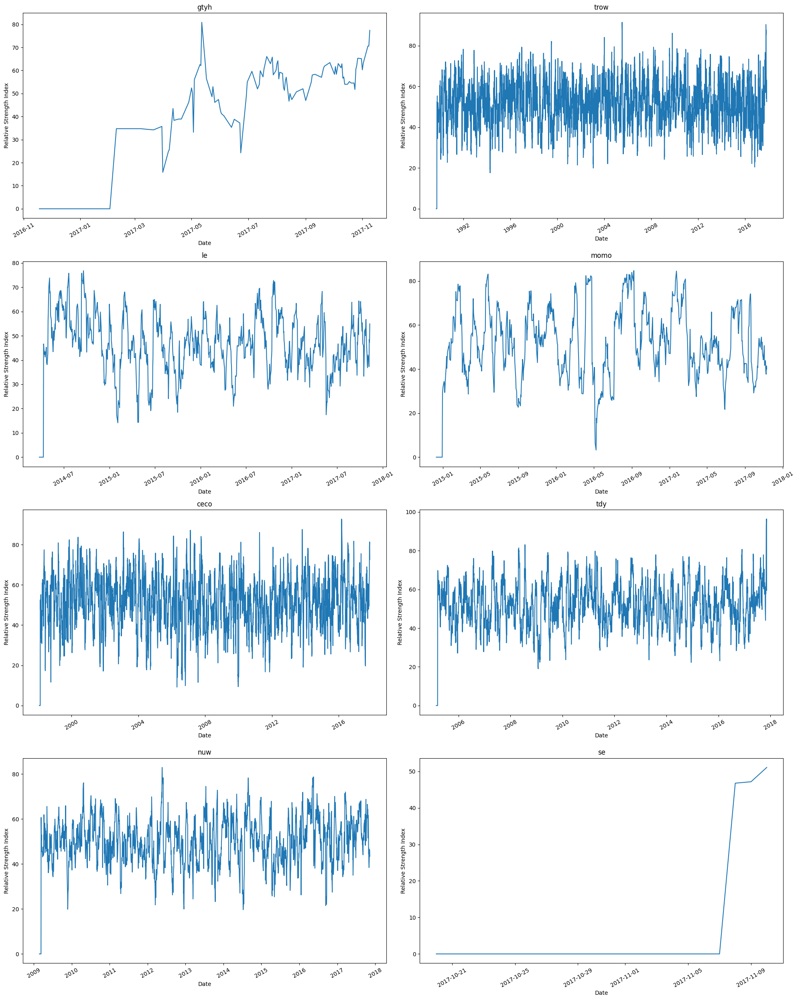

In [58]:
%matplotlib inline

# RSI Plot

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['RSI_14D'])
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Relative Strength Index")
    plt.xticks(rotation=30)
fig.tight_layout()


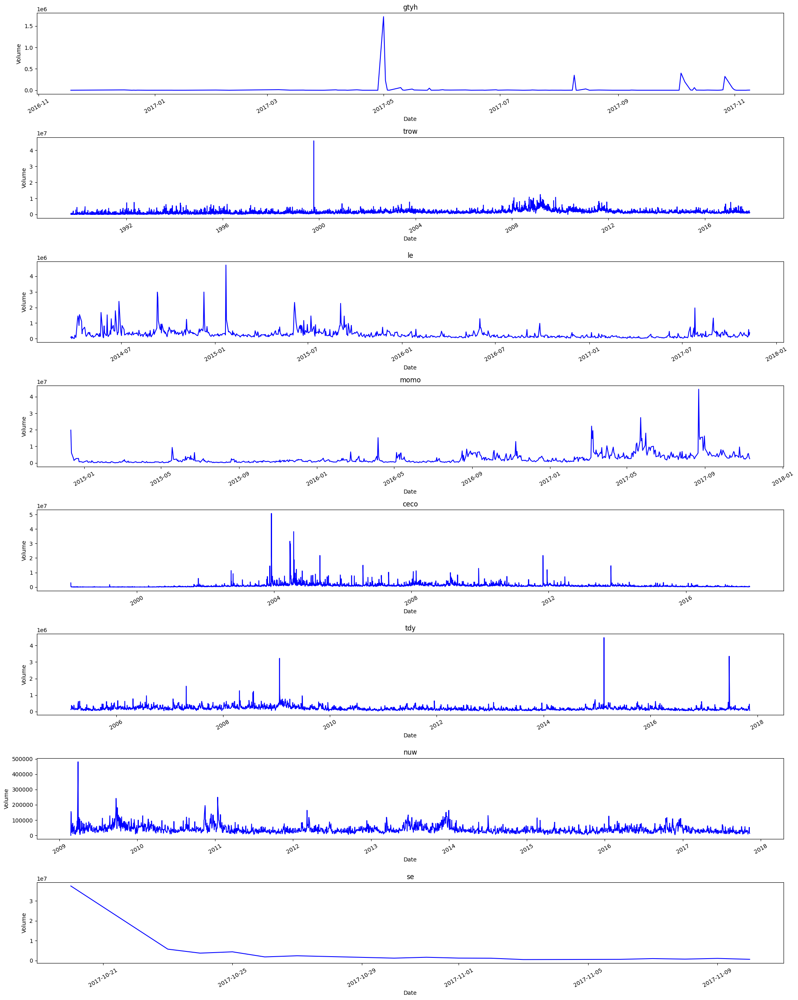

In [59]:
# Volume Plain plot
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume_plain'], 'b')
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Volume")
    plt.xticks(rotation=30)
fig.tight_layout()

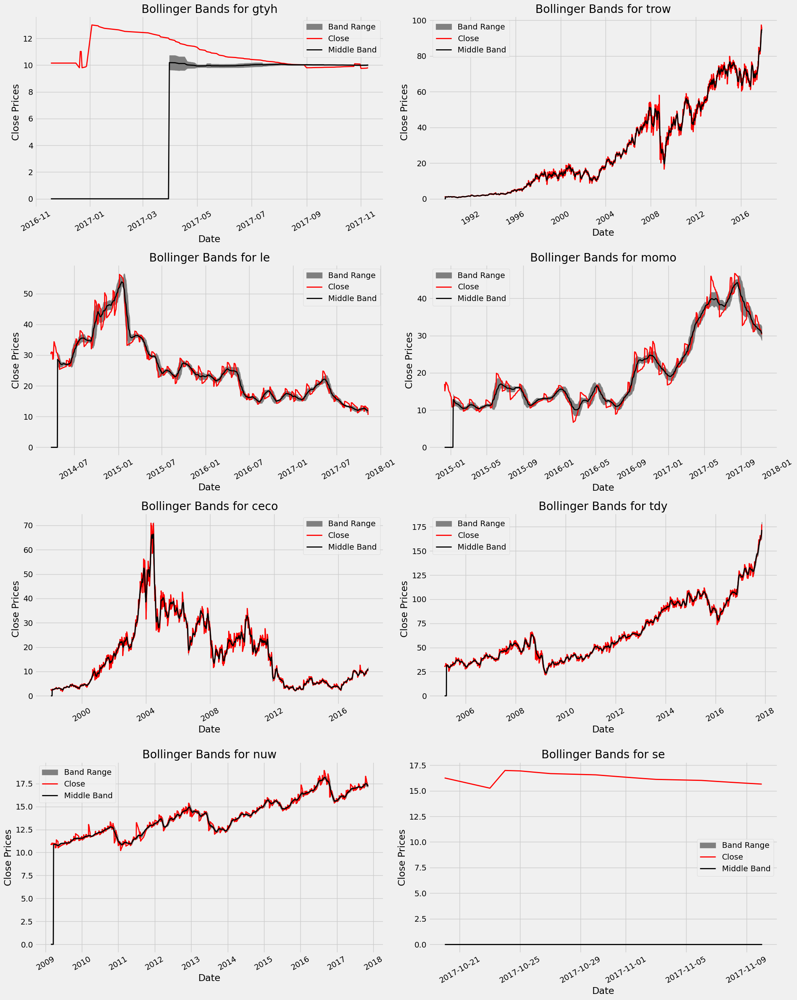

In [60]:
plt.style.use('fivethirtyeight')

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['BB_Upper_Band'], TechIndicator[i]['BB_Lower_Band'], color='grey', label="Band Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label="Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['BB_Middle_Band'], color='black', lw=2, label="Middle Band")
    ax.set_title("Bollinger Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()
#.dt.to_pydatetime()

<ipython-input-61-c5533e31b38a>:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


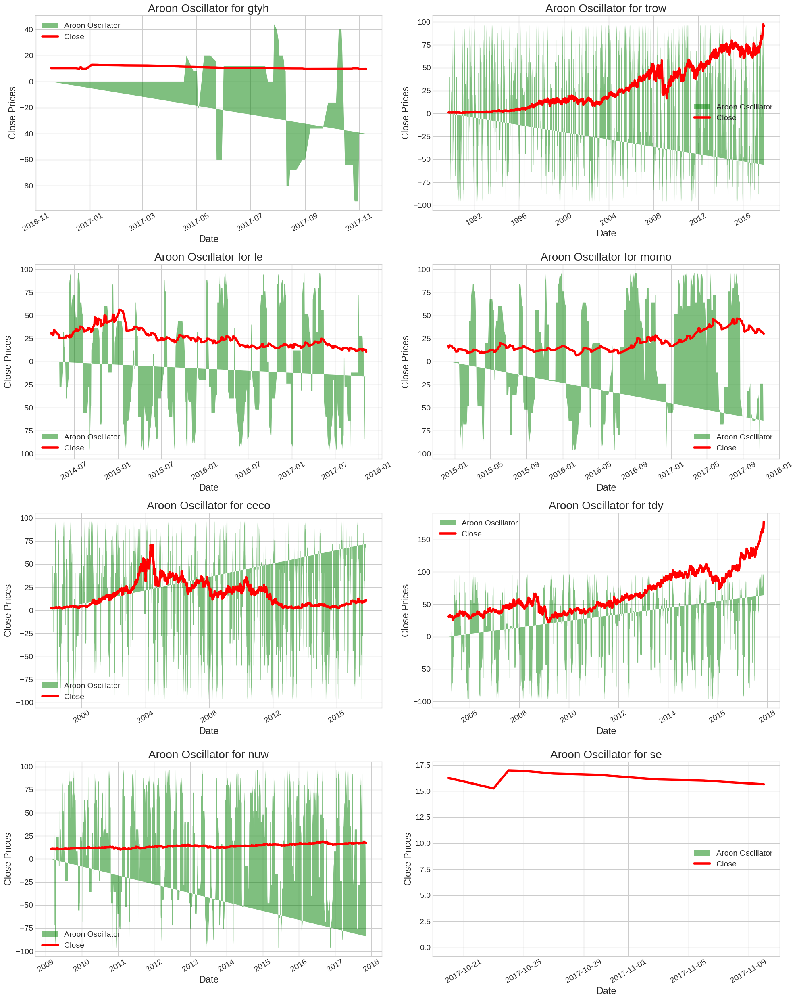

In [61]:
# Aroon Oscillator Plot
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill(TechIndicator[i].index, TechIndicator[i]['Aroon_Oscillator'],'g', alpha = 0.5, label = "Aroon Oscillator")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
    ax.set_title("Aroon Oscillator for " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

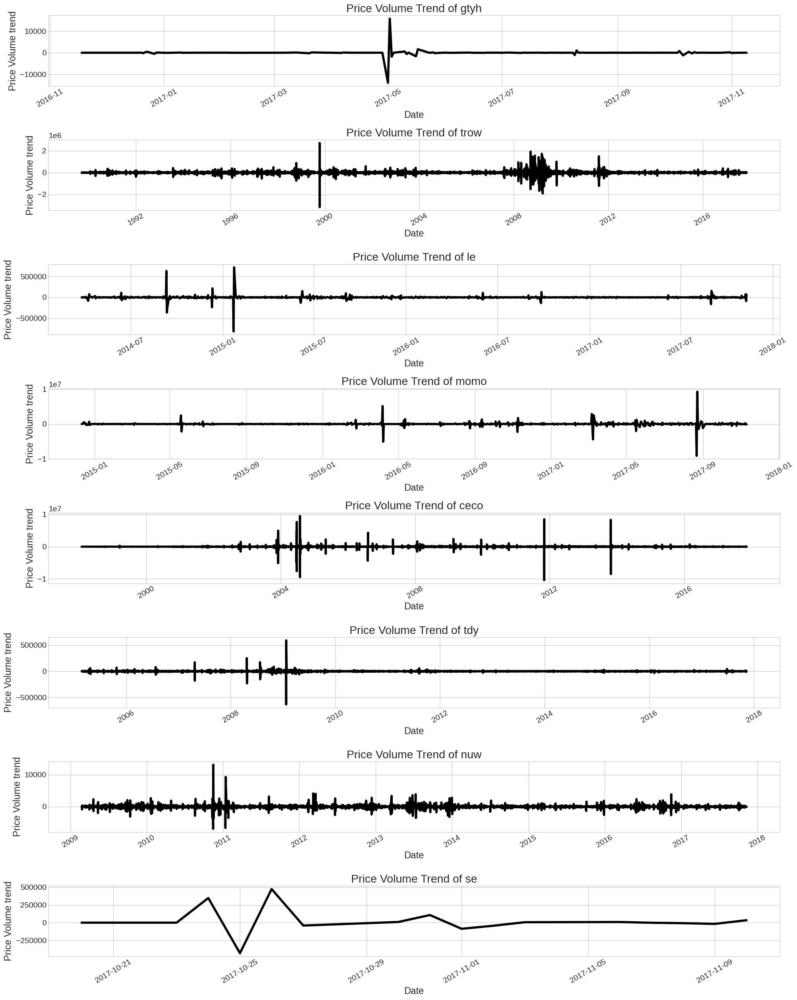

In [62]:
# PRice Volume Trend Plot
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['PVT'], 'black')
    ax.set_title("Price Volume Trend of " +str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Price Volume trend")
    plt.xticks(rotation=30)
fig.tight_layout()

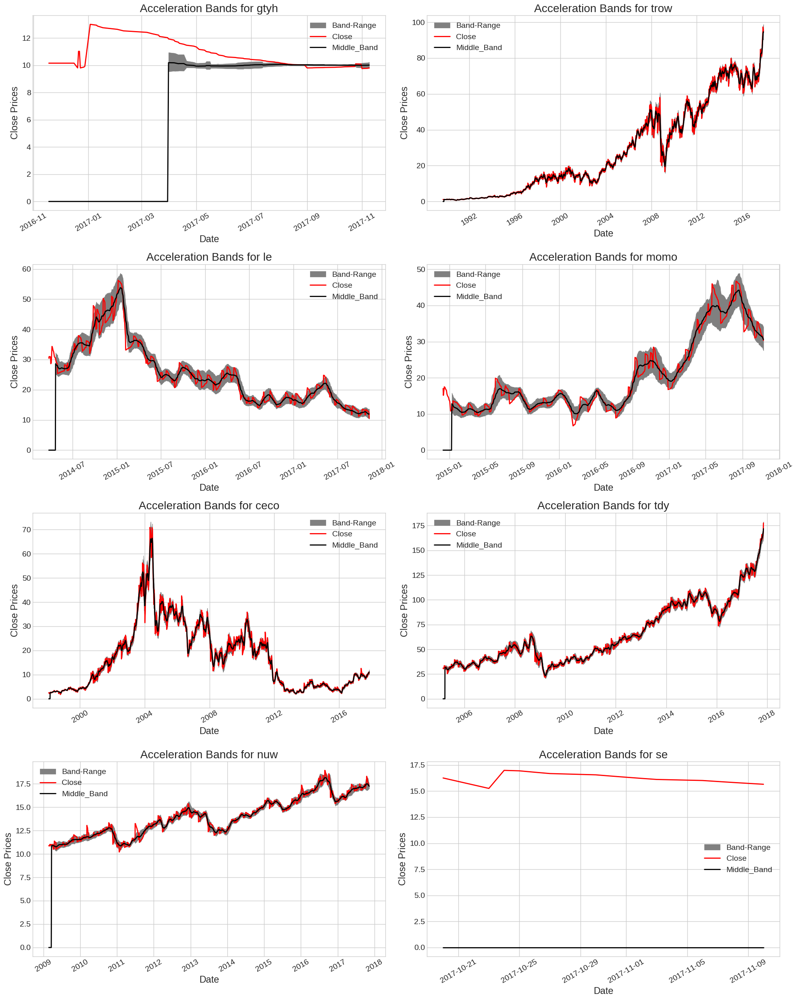

In [63]:
# Acceleration band Plot

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['AB_Upper_Band'], TechIndicator[i]['AB_Lower_Band'], color='grey', label = "Band-Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label = "Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['AB_Middle_Band'], color='black', lw=2, label="Middle_Band")
    ax.set_title("Acceleration Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

<ipython-input-64-dda288915a4e>:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


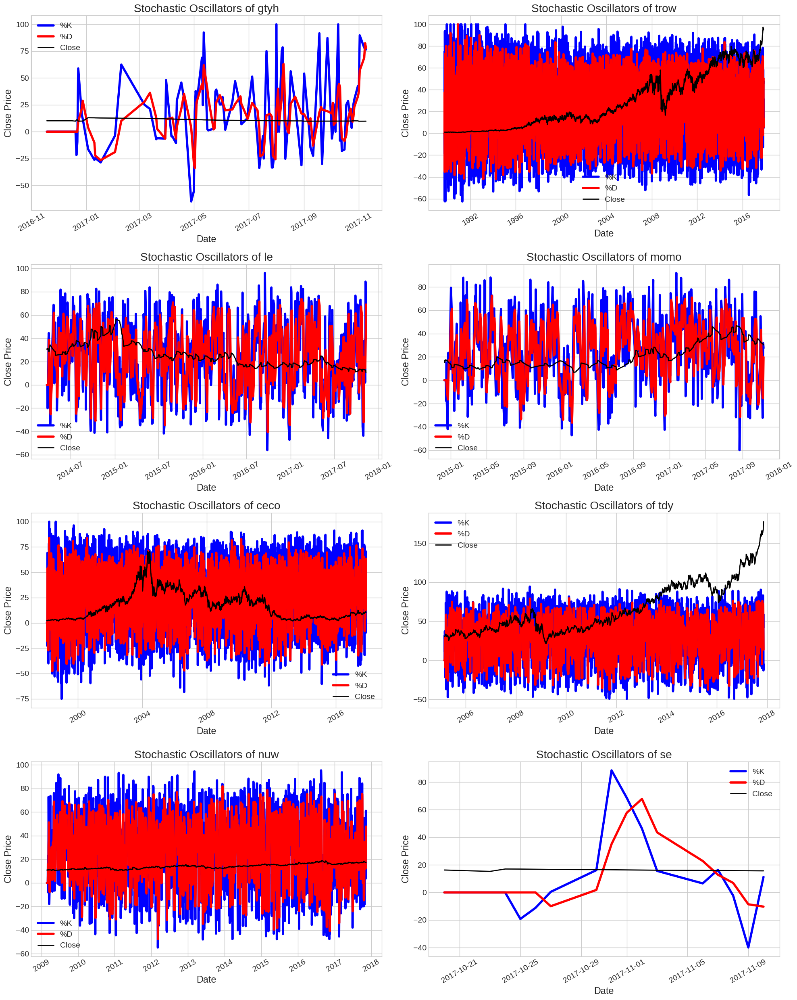

In [64]:
# Stochastic Oscillator plots
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOK'], 'blue', label="%K")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOD'], 'red', label="%D")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='black', lw=2, label = "Close")
    ax.set_title("Stochastic Oscillators of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

<ipython-input-65-53f45356a588>:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


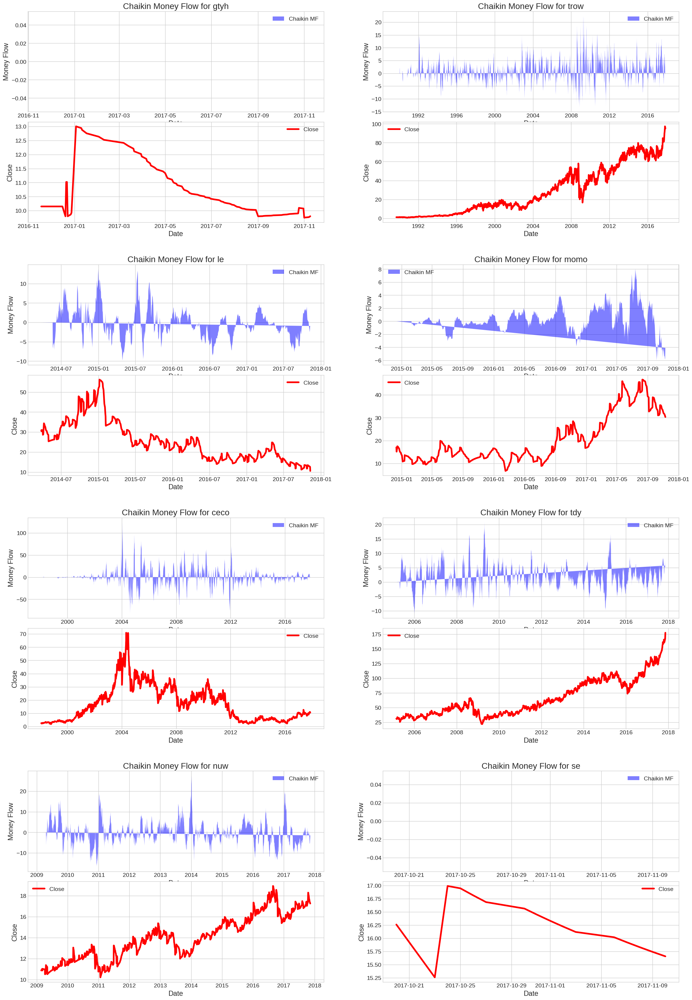

In [65]:
# Chaikin Money Flow Plots
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(25,40))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                    subplot_spec=outer[i], wspace=0.1, hspace=0.1)

    for j in range(2):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.fill(TechIndicator[i].index, TechIndicator[i]['Chaikin_MF'],'b', alpha = 0.5, label = "Chaikin MF")
            ax.set_title("Chaikin Money Flow for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Money Flow")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
            t = ax.set_ylabel("Close")
        ax.legend()
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

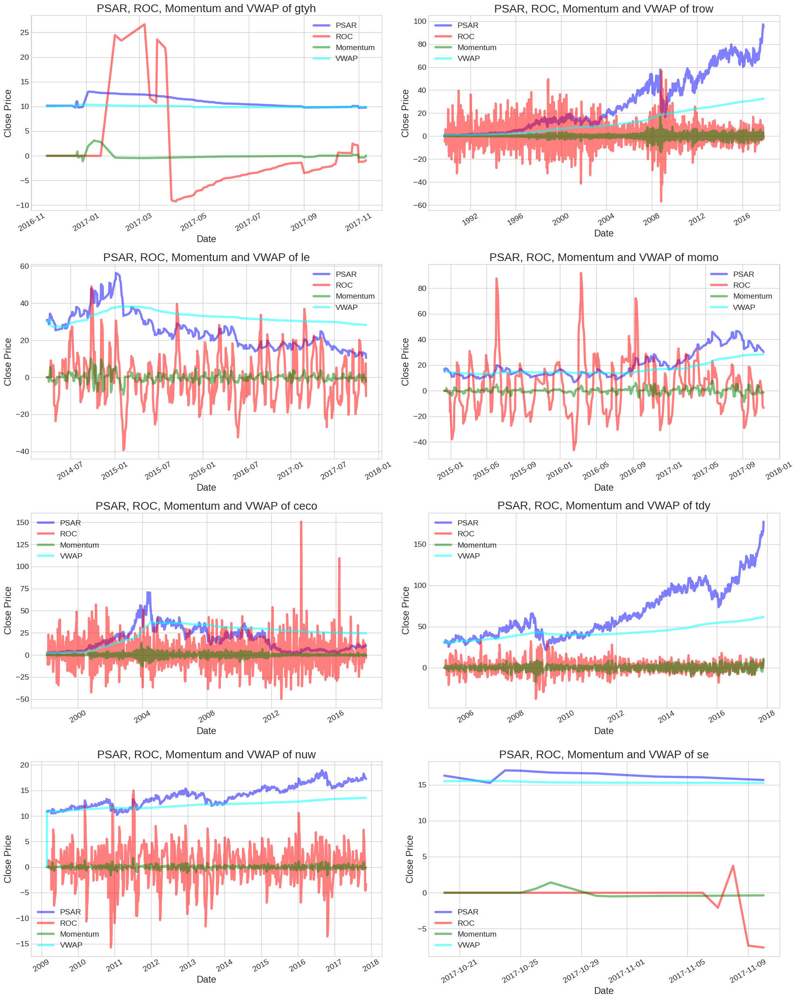

In [66]:
# Parabolic SAR, Rate of Change, Momentum and VWAP Plots
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['psar'], 'blue', label="PSAR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ROC'], 'red', label="ROC", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Momentum'], 'green', label="Momentum", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['VWAP'], 'cyan', label="VWAP", alpha = 0.5)
    ax.set_title("PSAR, ROC, Momentum and VWAP of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

<ipython-input-67-13ba31de2d26>:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


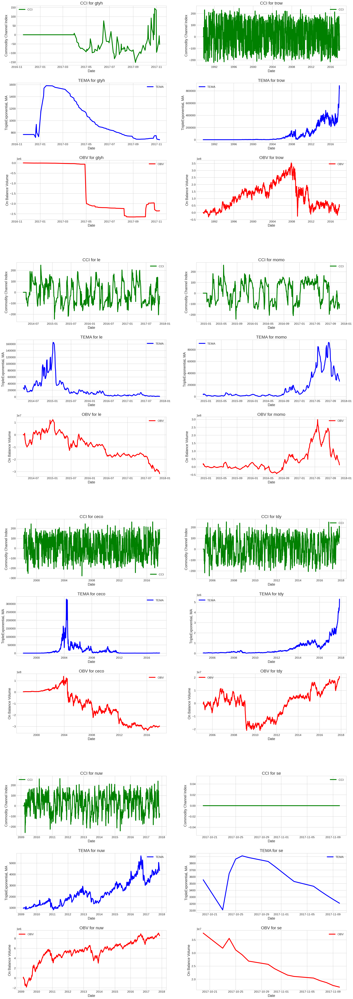

In [67]:
# Commodity Channel Index, Triple Exponential Moving Average On Banalance Volume Plots

fig = plt.figure(figsize=(25,80))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.3, hspace=0.3)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['CCI'], 'green', label="CCI")
            t = ax.set_title("CCI for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Commodity Channel Index")
        elif j == 1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['TEMA'], 'blue', label="TEMA")
            t = ax.set_title("TEMA for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("TripleExponentiaL MA")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['OBV'], 'red', label="OBV")
            t = ax.set_title("OBV for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("On Balance Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

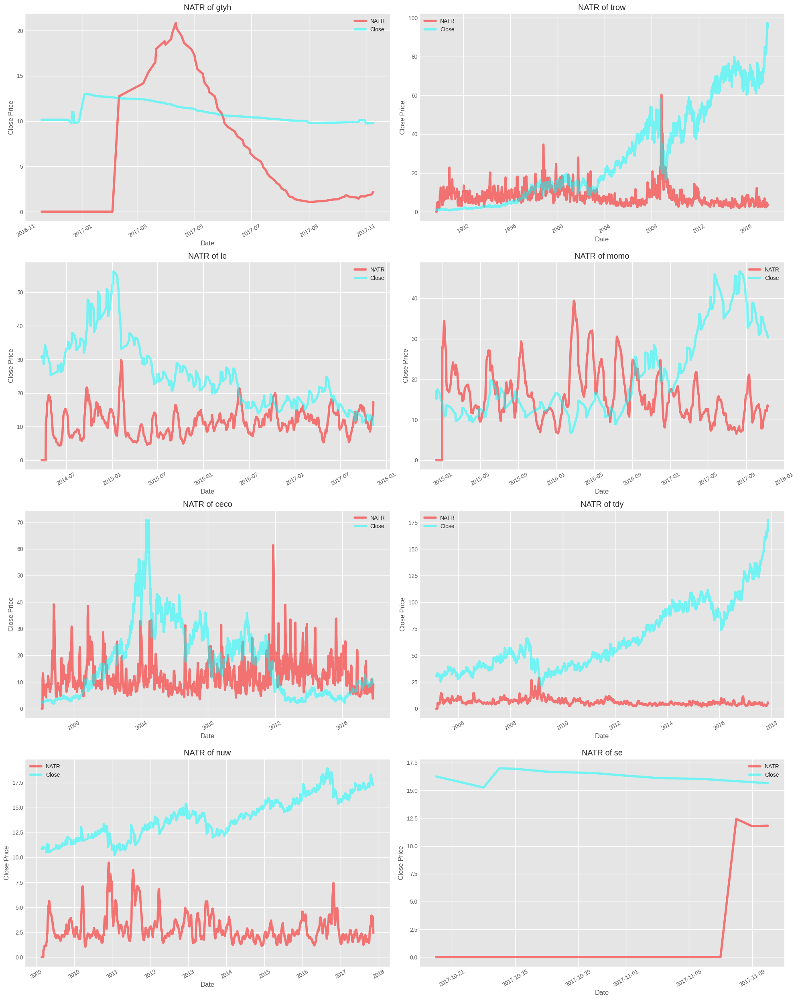

In [68]:
# Normalized Average True range Plots
plt.style.use('ggplot')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['NATR'], 'red', label="NATR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'cyan', label="Close", alpha = 0.5)
    ax.set_title("NATR of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

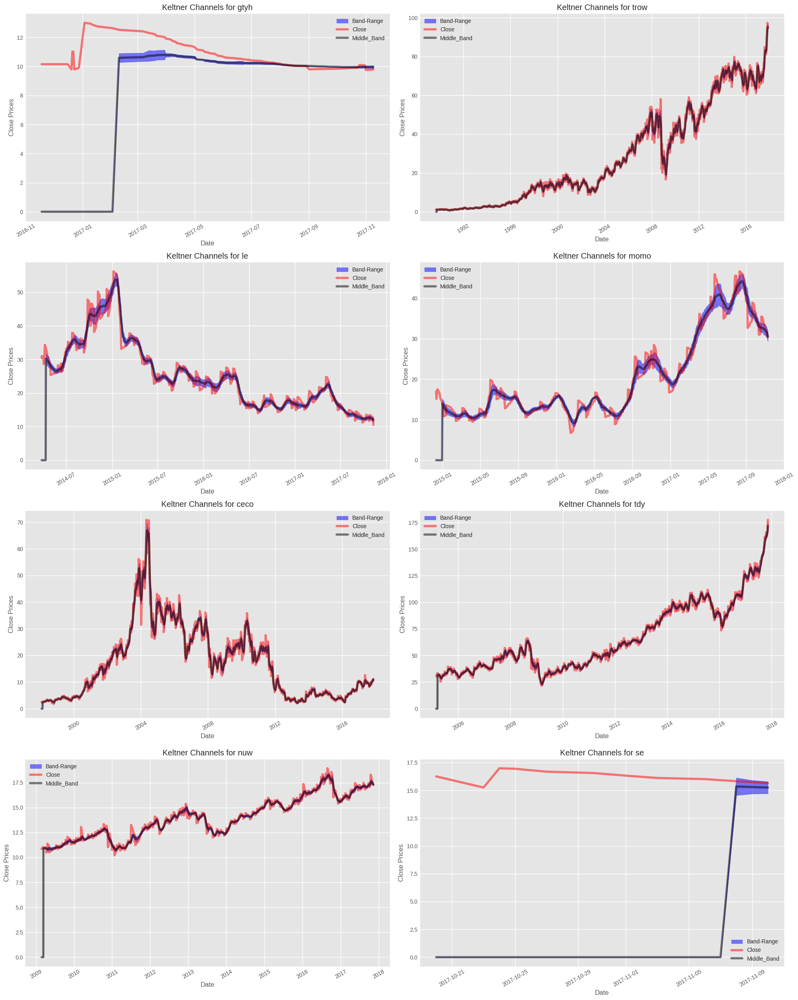

In [69]:
# Keltner Channels Plots

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['Kelch_Upper'], TechIndicator[i]['Kelch_Down'], 
                    color='blue', label = "Band-Range", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', label = "Close", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Kelch_Middle'], color='black', label="Middle_Band", alpha = 0.5)
    ax.set_title("Keltner Channels for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

<ipython-input-70-bc6aaf5c0e93>:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


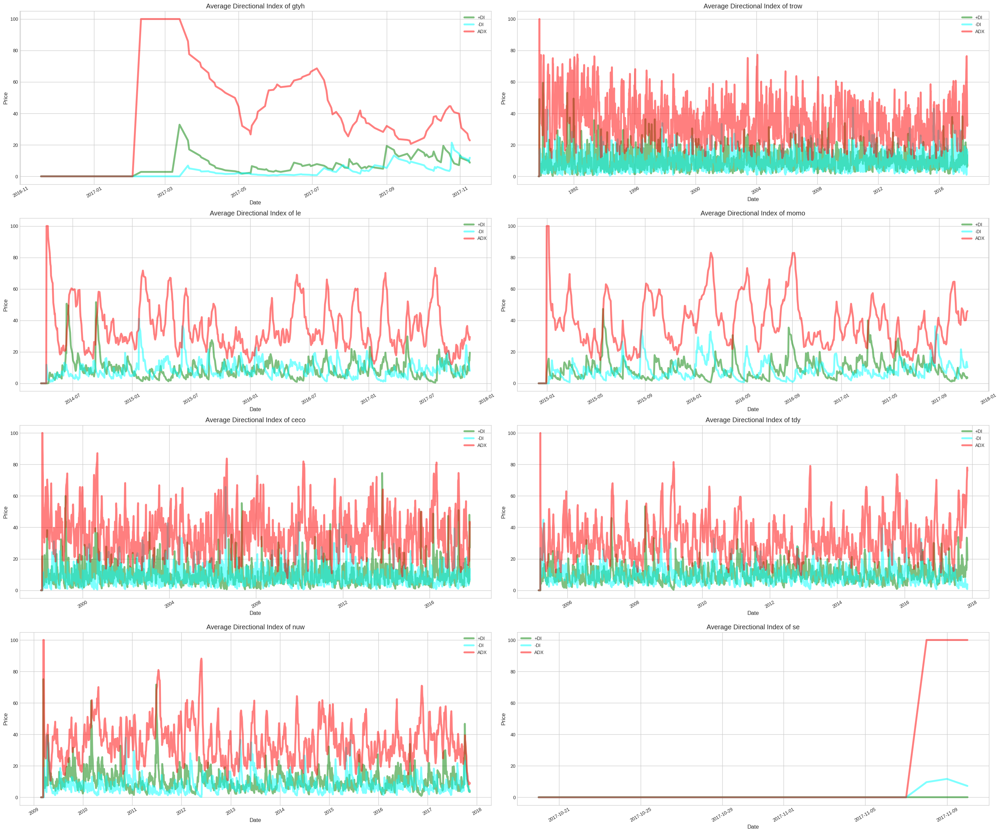

In [70]:
# Average Directional Index

plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(30,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['plusDI'], 'green', label="+DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['minusDI'], 'cyan', label="-DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ADX'], 'red', label="ADX", alpha = 0.5)
    ax.set_title("Average Directional Index of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

<ipython-input-71-db263c11a2bf>:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


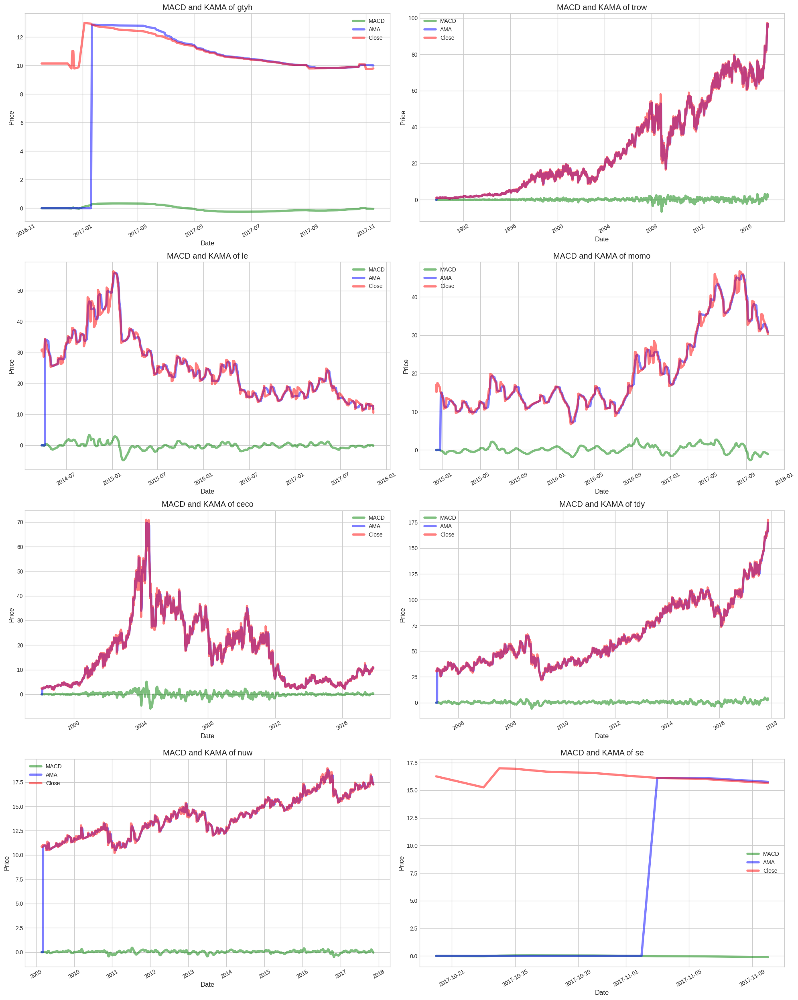

In [71]:
# Moving Average Convergence Divergence, Adaptive Moving Avergae Plots
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['MACD'], 'green', label="MACD", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['KAMA'], 'blue', label="AMA", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'red', label="Close", alpha = 0.5)
    ax.set_title("MACD and KAMA of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

<ipython-input-72-7683a48bb72f>:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


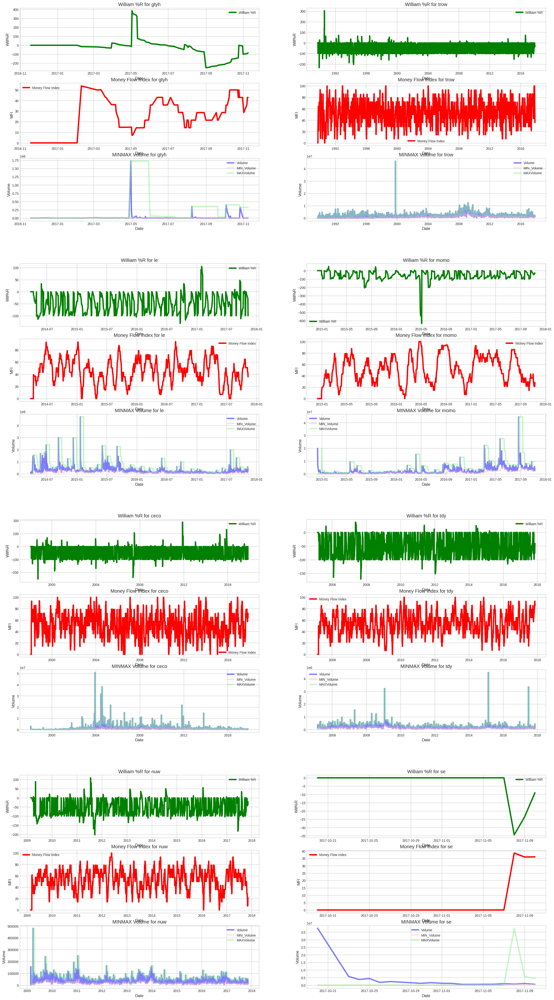

In [72]:
# William %R, Money Flow
fig = plt.figure(figsize=(25,50))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.2, hspace=0.2)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['WillR'], 'green', label="William %R")
            t = ax.set_title("William %R for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Will%R")
        elif j ==1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Money_Flow_Index'], 'red', label="Money Flow Index")
            
            t = ax.set_title("Money Flow Index for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("MFI")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume'], 'blue', label="Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MIN_Volume'], 'pink', label="MIN_Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MAX_Volume'], 'lightgreen', label="MAXVolume",  alpha = 0.5)
            t = ax.set_title("MINMAX Volume for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

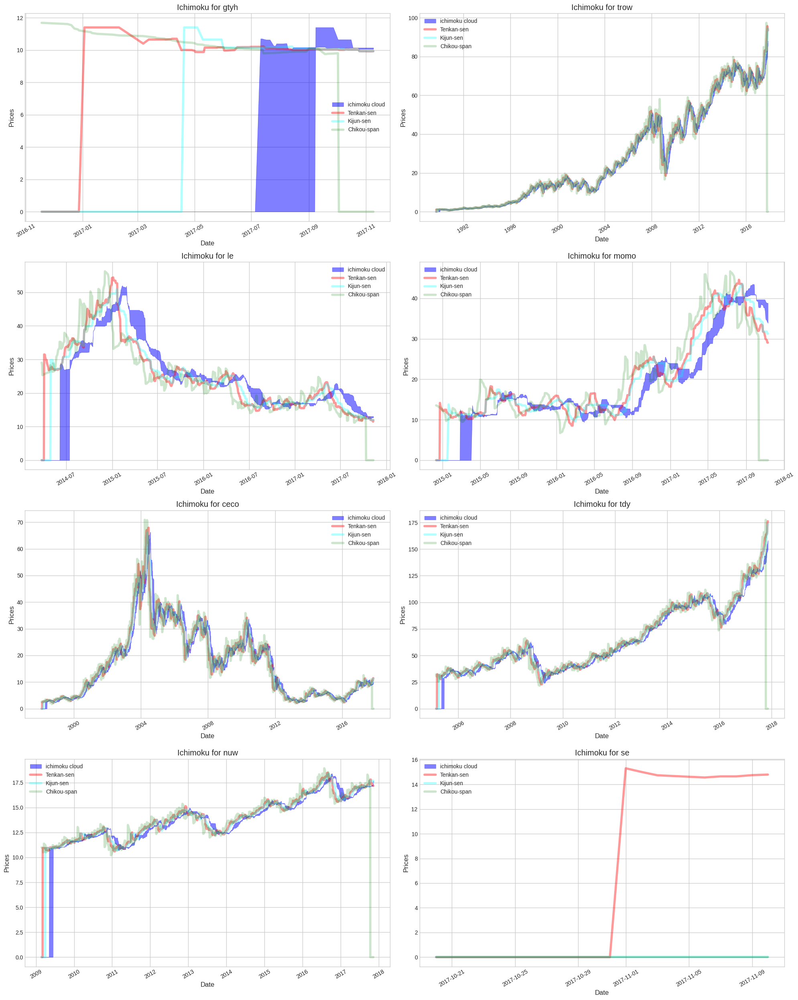

In [73]:
# ichimoku Plots turning_line	standard_line	ichimoku_span1	ichimoku_span2	chikou_span

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['ichimoku_span1'], TechIndicator[i]['ichimoku_span2'], 
                    color='blue', label = "ichimoku cloud", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['turning_line'], color='red', label = "Tenkan-sen", alpha = 0.4)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['standard_line'], color='cyan', label="Kijun-sen", alpha = 0.3)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['chikou_span'], color='green', label="Chikou-span", alpha = 0.2)
    ax.set_title("Ichimoku for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

# Stock Market Analysis

### This notebook uses LSTM and GRU based models to predict whether stock prices go up or down (Classification Problem)
### For this, Technical Indicators are also calculated on stock data.
Some part of this notebook is taken from my other kernel https://www.kaggle.com/kratisaxena/stock-market-technical-indicators-visualization
Please refer the above kernel for visualization part.

In [74]:
# Import Modules

import numpy as np
import pandas as pd
import os
import random
import copy
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.cbook as cbook

## Read the data from Stock folder

### Choose 15 random stock data for analysis

In [75]:
import os
os.chdir('/content/Stock_Data/Data/Stocks')
list = os.listdir()
number_files = len(list)
print(number_files)

7195


In [76]:
#filenames = [x for x in os.listdir("./Stocks/") if x.endswith('.txt') and os.path.getsize(x) > 0]
filenames = random.sample([x for x in os.listdir() if x.endswith('.txt') and os.path.getsize(os.path.join('',x)) > 0], 20)
print(filenames)

['ccrc.us.txt', 'kem.us.txt', 'dit.us.txt', 'slca.us.txt', 'ffg.us.txt', 'fpp.us.txt', 'cbshp.us.txt', 'lm.us.txt', 'abbv.us.txt', 'qts.us.txt', 'vii.us.txt', 'tax.us.txt', 'mime.us.txt', 'gars.us.txt', 'nr.us.txt', 'egp.us.txt', 'edow.us.txt', 'nxtdw.us.txt', 'lts_a.us.txt', 'bvxvw.us.txt']


### Read data into dataframes

In [77]:
df = []
for filename in filenames:
    dff = pd.read_csv(os.path.join('',filename), sep=',')
    label, _, _ = filename.split(sep='.')
    dff['Label'] = label
    dff['Date'] = pd.to_datetime(dff['Date'])
    df.append(dff)

In [78]:
df[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label
0,2015-12-21,4.39,10.700,4.39,10.15,204300,0,ccrc
1,2015-12-22,10.80,11.990,9.25,11.45,225767,0,ccrc
2,2015-12-23,11.86,11.860,10.00,10.05,36700,0,ccrc
3,2015-12-24,9.81,11.410,9.30,11.09,186892,0,ccrc
4,2015-12-28,10.99,11.189,9.60,9.97,80633,0,ccrc


In [79]:
# We will consider the data with maximum entries among those 15 random datasets
len_of_data = []
for i in range(len(df)):
    len_of_data.append(len(df[i]))
print(max(len_of_data))

index = len_of_data.index(max(len_of_data))
print(index)

3201
1


## Add various Technical Indicators in the dataframe

There are four types of Technical Indicators. Lets us take 4 sets of indicators and test which performs better in prediction of stock markets.
These 4 sets of Technical Indicators are:
- RSI, Volume (plain), Bollinger Bands, Aroon, Price Volume Trend, acceleration bands
- Stochastic, Chaikin Money Flow, Parabolic SAR, Rate of Change, Volume weighted average Price, momentum
- Commodity Channel Index, On Balance Volume, Keltner Channels, Triple Exponential Moving Average, Normalized Averager True Range ,directional movement indicators
- MACD, Money flowindex , Ichimoku, William %R, Volume MINMAX, adaptive moving average

In [80]:

# Create 4 copies of data to add columns of different sets of Technical Indicators
data = df[index]
techindi1 = copy.deepcopy(data)
techindi2 = copy.deepcopy(data)
techindi3 = copy.deepcopy(data)
techindi4 = copy.deepcopy(data)

# techindi1 dataframe

### Calculation of Relative Strength Index (RSI)

In [81]:
# Relative Strength Index
# Avg(PriceUp)/(Avg(PriceUP)+Avg(PriceDown)*100
# Where: PriceUp(t)=1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)>0};
#        PriceDown(t)=-1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)<0};

def rsi(values):
    up = values[values>0].mean()
    down = -1*values[values<0].mean()
    return 100 * up / (up + down)


In [82]:
# Add Momentum_1D column for all 15 stocks.
# Momentum_1D = P(t) - P(t-1)

techindi1['Momentum_1D'] = (techindi1['Close']-techindi1['Close'].shift(1)).fillna(0)
techindi1['RSI_14D'] = techindi1['Momentum_1D'].rolling(center=False, window=14).apply(rsi).fillna(0)
techindi1.tail(5)

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,-0.62,25.734549
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,0.26,25.178632
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,-0.12,26.056338
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,0.22,22.171946
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,-0.84,26.212938


### Calculation of Volume (Plain)

In [83]:

techindi1['Volume_plain'] = techindi1['Volume'].fillna(0)
techindi1.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,-0.62,25.734549,7261543
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,0.26,25.178632,4035364
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,-0.12,26.056338,3618892
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,0.22,22.171946,2788254
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,-0.84,26.212938,2701922


### Calculation of Bollinger Bands

In [84]:
def bbands(price, length=30, numsd=2):
    """ returns average, upper band, and lower band"""
    #ave = pd.stats.moments.rolling_mean(price,length)
    ave = price.rolling(window = length, center = False).mean()
    #sd = pd.stats.moments.rolling_std(price,length)
    sd = price.rolling(window = length, center = False).std()
    upband = ave + (sd*numsd)
    dnband = ave - (sd*numsd)
    return np.round(ave,3), np.round(upband,3), np.round(dnband,3)

In [85]:
techindi1['BB_Middle_Band'], techindi1['BB_Upper_Band'], techindi1['BB_Lower_Band'] = bbands(techindi1['Close'], length=20, numsd=1)
techindi1['BB_Middle_Band'] = techindi1['BB_Middle_Band'].fillna(0)
techindi1['BB_Upper_Band'] = techindi1['BB_Upper_Band'].fillna(0)
techindi1['BB_Lower_Band'] = techindi1['BB_Lower_Band'].fillna(0)
techindi1.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,-0.62,25.734549,7261543,24.244,27.834,20.655
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,0.26,25.178632,4035364,23.788,27.792,19.784
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,-0.12,26.056338,3618892,23.326,27.665,18.987
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,0.22,22.171946,2788254,22.874,27.458,18.289
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,-0.84,26.212938,2701922,22.330,27.125,17.535


### Calculation of Aroon Oscillator

In [86]:
def aroon(df, tf=25):
    aroonup = []
    aroondown = []
    x = tf
    while x< len(df['Date']):
        aroon_up = ((df['High'][x-tf:x].tolist().index(max(df['High'][x-tf:x])))/float(tf))*100
        aroon_down = ((df['Low'][x-tf:x].tolist().index(min(df['Low'][x-tf:x])))/float(tf))*100
        aroonup.append(aroon_up)
        aroondown.append(aroon_down)
        x+=1
    return aroonup, aroondown

In [87]:
listofzeros = [0] * 25
up, down = aroon(techindi1)
aroon_list = [x - y for x, y in zip(up,down)]
if len(aroon_list)==0:
    aroon_list = [0] * techindi1.shape[0]
    techindi1['Aroon_Oscillator'] = aroon_list
else:
    techindi1['Aroon_Oscillator'] = listofzeros+aroon_list


### Calculation of Price Volume Trend

PVT = [((CurrentClose - PreviousClose) / PreviousClose) x Volume] + PreviousPVT

In [88]:
techindi1["PVT"] = (techindi1['Momentum_1D']/ techindi1['Close'].shift(1))*techindi1['Volume']
techindi1["PVT"] = techindi1["PVT"]-techindi1["PVT"].shift(1)
techindi1["PVT"] = techindi1["PVT"].fillna(0)
techindi1.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,-0.62,25.734549,7261543,24.244,27.834,20.655,-44.0,-504152.453134
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,0.26,25.178632,4035364,23.788,27.792,19.784,-52.0,338102.291129
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,-0.12,26.056338,3618892,23.326,27.665,18.987,-52.0,-92743.928822
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,0.22,22.171946,2788254,22.874,27.458,18.289,-52.0,65035.003166
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,-0.84,26.212938,2701922,22.330,27.125,17.535,-52.0,-177606.469119


### Calculation of Acceleration Bands

In [89]:
def abands(df):
    #df['AB_Middle_Band'] = pd.rolling_mean(df['Close'], 20)
    df['AB_Middle_Band'] = df['Close'].rolling(window = 20, center=False).mean()
    # High * ( 1 + 4 * (High - Low) / (High + Low))
    df['aupband'] = df['High'] * (1 + 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Upper_Band'] = df['aupband'].rolling(window=20, center=False).mean()
    # Low *(1 - 4 * (High - Low)/ (High + Low))
    df['adownband'] = df['Low'] * (1 - 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Lower_Band'] = df['adownband'].rolling(window=20, center=False).mean()

In [90]:
abands(techindi1)
techindi1 = techindi1.fillna(0)
techindi1.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,aupband,AB_Upper_Band,adownband,AB_Lower_Band
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,-0.62,25.734549,...,24.244,27.834,20.655,-44.0,-504152.453134,24.2445,21.459492,28.148872,10.309492,20.679622
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,0.26,25.178632,...,23.788,27.792,19.784,-52.0,338102.291129,23.7880,18.784341,27.691039,13.684341,20.274289
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,-0.12,26.056338,...,23.326,27.665,18.987,-52.0,-92743.928822,23.3260,18.474218,27.265160,13.424218,19.780910
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,0.22,22.171946,...,22.874,27.458,18.289,-52.0,65035.003166,22.8735,18.569449,26.857058,13.319449,19.245308
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,-0.84,26.212938,...,22.330,27.125,17.535,-52.0,-177606.469119,22.3300,18.927627,26.321563,13.027627,18.769813


## Drop unwanted columns

In [91]:
columns2Drop = ['Momentum_1D', 'aupband', 'adownband']
techindi1 = techindi1.drop(labels = columns2Drop, axis=1)
techindi1.head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band
0,2005-02-25,24.00,24.96,24.00,24.96,133200,0,kem,0.0,133200,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,2005-02-28,24.78,25.20,24.30,24.51,182767,0,kem,0.0,182767,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2,2005-03-01,24.75,25.92,24.75,25.86,216733,0,kem,0.0,216733,0.0,0.0,0.0,0.0,15232.636265,0.0,0.0,0.0
3,2005-03-02,25.74,25.95,25.20,25.32,130133,0,kem,0.0,130133,0.0,0.0,0.0,0.0,-14654.952571,0.0,0.0,0.0
4,2005-03-03,25.35,25.77,24.90,25.05,235167,0,kem,0.0,235167,0.0,0.0,0.0,0.0,209.689455,0.0,0.0,0.0


# techindi2 dataframe

### Calculation of Stochastic Oscillator (%K and %D)

In [92]:
def STOK(df, n):
    df['STOK'] = ((df['Close'] - df['Low'].rolling(window=n, center=False).mean()) / (df['High'].rolling(window=n, center=False).max() - df['Low'].rolling(window=n, center=False).min())) * 100
    df['STOD'] = df['STOK'].rolling(window = 3, center=False).mean()

In [93]:
STOK(techindi2, 4)
techindi2 = techindi2.fillna(0)
techindi2.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,STOK,STOD
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,-15.207276,-35.702329
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,9.702797,-13.374524
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,16.310624,3.602048
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,47.982063,24.665161
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,1.268116,21.853601


### Calculation of Chaikin Money Flow

In [94]:
def CMFlow(df, tf):
    CHMF = []
    MFMs = []
    MFVs = []
    x = tf
    
    while x < len(df['Date']):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        
        MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])
        MFV = MFM*PeriodVolume
        
        MFMs.append(MFM)
        MFVs.append(MFV)
        x+=1
    
    y = tf
    while y < len(MFVs):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        consider = MFVs[y-tf:y]
        tfsMFV = 0
        
        for eachMFV in consider:
            tfsMFV += eachMFV
        
        tfsCMF = tfsMFV/PeriodVolume
        CHMF.append(tfsCMF)
        y+=1
    return CHMF

In [95]:
listofzeros = [0] * 40
CHMF = CMFlow(techindi2, 20)
if len(CHMF)==0:
    CHMF = [0] * techindi2.shape[0]
    techindi2['Chaikin_MF'] = CHMF
else:
    techindi2['Chaikin_MF'] = listofzeros+CHMF
techindi2.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,STOK,STOD,Chaikin_MF
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,-15.207276,-35.702329,0.350512
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,9.702797,-13.374524,0.726752
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,16.310624,3.602048,0.049907
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,47.982063,24.665161,-0.034188
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,1.268116,21.853601,0.837801


### Calculation of Parabolic SAR

In [96]:
def psar(df, iaf = 0.02, maxaf = 0.2):
    length = len(df)
    dates = (df['Date'])
    high = (df['High'])
    low = (df['Low'])
    close = (df['Close'])
    psar = df['Close'][0:len(df['Close'])]
    psarbull = [None] * length
    psarbear = [None] * length
    bull = True
    af = iaf
    ep = df['Low'][0]
    hp = df['High'][0]
    lp = df['Low'][0]
    for i in range(2,length):
        if bull:
            psar[i] = psar[i - 1] + af * (hp - psar[i - 1])
        else:
            psar[i] = psar[i - 1] + af * (lp - psar[i - 1])
        reverse = False
        if bull:
            if df['Low'][i] < psar[i]:
                bull = False
                reverse = True
                psar[i] = hp
                lp = df['Low'][i]
                af = iaf
        else:
            if df['High'][i] > psar[i]:
                bull = True
                reverse = True
                psar[i] = lp
                hp = df['High'][i]
                af = iaf
        if not reverse:
            if bull:
                if df['High'][i] > hp:
                    hp = df['High'][i]
                    af = min(af + iaf, maxaf)
                if df['Low'][i - 1] < psar[i]:
                    psar[i] = df['Low'][i - 1]
                if df['Low'][i - 2] < psar[i]:
                    psar[i] = df['Low'][i - 2]
            else:
                if df['Low'][i] < lp:
                    lp = df['Low'][i]
                    af = min(af + iaf, maxaf)
                if df['High'][i - 1] > psar[i]:
                    psar[i] = df['High'][i - 1]
                if df['High'][i - 2] > psar[i]:
                    psar[i] = df['High'][i - 2]
        if bull:
            psarbull[i] = psar[i]
        else:
            psarbear[i] = psar[i]
    #return {"dates":dates, "high":high, "low":low, "close":close, "psar":psar, "psarbear":psarbear, "psarbull":psarbull}
    #return psar, psarbear, psarbull
    df['psar'] = psar
    #df['psarbear'] = psarbear
    #df['psarbull'] = psarbull

In [97]:
psar(techindi2)

techindi2.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,STOK,STOD,Chaikin_MF,psar
3196,2017-11-06,16.56,16.68,14.45,26.062600,7261543,0,kem,-15.207276,-35.702329,0.350512,26.062600
3197,2017-11-07,15.93,16.68,15.66,25.598096,4035364,0,kem,9.702797,-13.374524,0.726752,25.598096
3198,2017-11-08,16.16,16.39,15.38,25.152172,3618892,0,kem,16.310624,3.602048,0.049907,25.152172
3199,2017-11-09,15.66,16.40,15.35,24.724085,2788254,0,kem,47.982063,24.665161,-0.034188,24.724085
3200,2017-11-10,16.14,16.48,15.30,24.313122,2701922,0,kem,1.268116,21.853601,0.837801,24.313122


### Calculation of Price Rate of Change

In [98]:
# ROC = [(Close - Close n periods ago) / (Close n periods ago)] * 100

techindi2['ROC'] = ((techindi2['Close'] - techindi2['Close'].shift(12))/(techindi2['Close'].shift(12)))*100
techindi2 = techindi2.fillna(0)
techindi2.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,STOK,STOD,Chaikin_MF,psar,ROC
3196,2017-11-06,16.56,16.68,14.45,26.062600,7261543,0,kem,-15.207276,-35.702329,0.350512,26.062600,-4.707130
3197,2017-11-07,15.93,16.68,15.66,25.598096,4035364,0,kem,9.702797,-13.374524,0.726752,25.598096,-6.405499
3198,2017-11-08,16.16,16.39,15.38,25.152172,3618892,0,kem,16.310624,3.602048,0.049907,25.152172,-7.883023
3199,2017-11-09,15.66,16.40,15.35,24.724085,2788254,0,kem,47.982063,24.665161,-0.034188,24.724085,-9.303055
3200,2017-11-10,16.14,16.48,15.30,24.313122,2701922,0,kem,1.268116,21.853601,0.837801,24.313122,-10.667732


### Calculation of Volume Weighted Average Price

In [99]:
techindi2['VWAP'] = np.cumsum(techindi2['Volume'] * (techindi2['High'] + techindi2['Low'])/2) / np.cumsum(techindi2['Volume'])
techindi2 = techindi2.fillna(0)
techindi2.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,STOK,STOD,Chaikin_MF,psar,ROC,VWAP
3196,2017-11-06,16.56,16.68,14.45,26.062600,7261543,0,kem,-15.207276,-35.702329,0.350512,26.062600,-4.707130,12.789265
3197,2017-11-07,15.93,16.68,15.66,25.598096,4035364,0,kem,9.702797,-13.374524,0.726752,25.598096,-6.405499,12.801177
3198,2017-11-08,16.16,16.39,15.38,25.152172,3618892,0,kem,16.310624,3.602048,0.049907,25.152172,-7.883023,12.810891
3199,2017-11-09,15.66,16.40,15.35,24.724085,2788254,0,kem,47.982063,24.665161,-0.034188,24.724085,-9.303055,12.818309
3200,2017-11-10,16.14,16.48,15.30,24.313122,2701922,0,kem,1.268116,21.853601,0.837801,24.313122,-10.667732,12.825498


### Calculation of Momentum 

In [100]:
techindi2['Momentum'] = techindi2['Close'] - techindi2['Close'].shift(4)
techindi2 = techindi2.fillna(0)
techindi2.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum
3196,2017-11-06,16.56,16.68,14.45,26.062600,7261543,0,kem,-15.207276,-35.702329,0.350512,26.062600,-4.707130,12.789265,-0.298893
3197,2017-11-07,15.93,16.68,15.66,25.598096,4035364,0,kem,9.702797,-13.374524,0.726752,25.598096,-6.405499,12.801177,2.148096
3198,2017-11-08,16.16,16.39,15.38,25.152172,3618892,0,kem,16.310624,3.602048,0.049907,25.152172,-7.883023,12.810891,-1.117828
3199,2017-11-09,15.66,16.40,15.35,24.724085,2788254,0,kem,47.982063,24.665161,-0.034188,24.724085,-9.303055,12.818309,-1.545915
3200,2017-11-10,16.14,16.48,15.30,24.313122,2701922,0,kem,1.268116,21.853601,0.837801,24.313122,-10.667732,12.825498,-1.749478


# techindi3 dataframe

### Calculation of Commodity Channel Index

In [101]:
def CCI(df, n, constant):
    TP = (df['High'] + df['Low'] + df['Close']) / 3
    CCI = pd.Series((TP - TP.rolling(window=n, center=False).mean()) / (constant * TP.rolling(window=n, center=False).std())) #, name = 'CCI_' + str(n))
    return CCI

In [102]:
techindi3['CCI'] = CCI(techindi3, 20, 0.015)
techindi3 = techindi3.fillna(0)
techindi3.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,CCI
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,-169.377009
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,-133.388678
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,-117.998614
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,-102.699588
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,-94.665746


### Calculation of On Balance Volume

            
If the closing price is above the prior close price then: 
Current OBV = Previous OBV + Current Volume

If the closing price is below the prior close price then: 
Current OBV = Previous OBV  -  Current Volume

If the closing prices equals the prior close price then:
Current OBV = Previous OBV (no change)

In [103]:
new = (techindi3['Volume'] * (~techindi3['Close'].diff().le(0) * 2 -1)).cumsum()
techindi3['OBV'] = new
techindi3.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,CCI,OBV
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,-169.377009,-21480605
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,-133.388678,-17445241
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,-117.998614,-21064133
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,-102.699588,-18275879
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,-94.665746,-20977801


### Calcualtion of Keltner Channels

In [104]:
#Keltner Channel  
def KELCH(df, n):  
    KelChM = pd.Series(((df['High'] + df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChM_' + str(n))  
    KelChU = pd.Series(((4 * df['High'] - 2 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChU_' + str(n))  
    KelChD = pd.Series(((-2 * df['High'] + 4 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChD_' + str(n))    
    return KelChM, KelChD, KelChU

In [105]:
KelchM, KelchD, KelchU = KELCH(techindi3, 14)
techindi3['Kelch_Upper'] = KelchU
techindi3['Kelch_Middle'] = KelchM
techindi3['Kelch_Down'] = KelchD
techindi3 = techindi3.fillna(0)
techindi3.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,-169.377009,-21480605,25.351905,23.613548,21.875190
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,-133.388678,-17445241,24.584810,22.843524,21.102238
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,-117.998614,-21064133,23.830048,22.124476,20.418905
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,-102.699588,-18275879,23.080524,21.379952,19.679381
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,-94.665746,-20977801,22.341238,20.637095,18.932952


### Calculation of Triple Exponential Moving Average

Triple Exponential MA Formula:

T-EMA = (3*EMA – 3*EMA(EMA)) + EMA(EMA(EMA))

Where:

EMA = EMA(1) + α * (Close – EMA(1))

α = 2 / (N + 1)

N = The smoothing period.

In [106]:
techindi3['EMA'] = techindi3['Close'].ewm(span=3,min_periods=0,adjust=True,ignore_na=False).mean()
techindi3 = techindi3.fillna(0)


techindi3['TEMA'] = (3 * techindi3['EMA'] - 3 * techindi3['EMA'] * techindi3['EMA']) + (techindi3['EMA']*techindi3['EMA']*techindi3['EMA'])
techindi3.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,EMA,TEMA
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,-169.377009,-21480605,25.351905,23.613548,21.875190,17.210065,4260.457642
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,-133.388678,-17445241,24.584810,22.843524,21.102238,16.695033,3867.221005
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,-117.998614,-21064133,23.830048,22.124476,20.418905,16.377516,3637.290682
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,-102.699588,-18275879,23.080524,21.379952,19.679381,16.328758,3602.810991
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,-94.665746,-20977801,22.341238,20.637095,18.932952,15.884379,3298.555909


### Calculation of Normalized Average True Range

True Range = Highest of (HIgh - low, abs(High - previous close), abs(low - previous close))

Average True Range = 14 day MA of True Range

Normalized Average True Range = ATR / Close * 100

In [107]:
techindi3['HL'] = techindi3['High'] - techindi3['Low']
techindi3['absHC'] = abs(techindi3['High'] - techindi3['Close'].shift(1))
techindi3['absLC'] = abs(techindi3['Low'] - techindi3['Close'].shift(1))
techindi3['TR'] = techindi3[['HL','absHC','absLC']].max(axis=1)
techindi3['ATR'] = techindi3['TR'].rolling(window=14).mean()
techindi3['NATR'] = (techindi3['ATR'] / techindi3['Close']) *100
techindi3 = techindi3.fillna(0)
techindi3.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,CCI,OBV,...,Kelch_Middle,Kelch_Down,EMA,TEMA,HL,absHC,absLC,TR,ATR,NATR
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,-169.377009,-21480605,...,23.613548,21.875190,17.210065,4260.457642,2.23,0.14,2.09,2.23,2.159786,13.566493
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,-133.388678,-17445241,...,22.843524,21.102238,16.695033,3867.221005,1.02,0.76,0.26,1.02,2.162714,13.366590
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,-117.998614,-21064133,...,22.124476,20.418905,16.377516,3637.290682,1.01,0.21,0.80,1.01,2.087714,12.999466
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,-102.699588,-18275879,...,21.379952,19.679381,16.328758,3602.810991,1.05,0.34,0.71,1.05,2.082714,12.793085
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,-94.665746,-20977801,...,20.637095,18.932952,15.884379,3298.555909,1.18,0.20,0.98,1.18,2.086286,13.512213


### Calculation of Average Directional Movement Index (ADX)

Calculating the DMI can actually be broken down into two parts. 
First, calculating the +DI and -DI, and second, calculating the ADX.

To calculate the +DI and -DI you need to find the +DM and -DM (Directional Movement). 
+DM and -DM are calculated using the High, Low and Close for each period. 
You can then calculate the following:

Current High - Previous High = UpMove
Previous Low - Current Low = DownMove

If UpMove > DownMove and UpMove > 0, then +DM = UpMove, else +DM = 0
If DownMove > Upmove and Downmove > 0, then -DM = DownMove, else -DM = 0

Once you have the current +DM and -DM calculated, the +DM and -DM lines can be 
calculated and plotted based on the number of user defined periods.

+DI = 100 times Exponential Moving Average of (+DM / Average True Range)
-DI = 100 times Exponential Moving Average of (-DM / Average True Range)

Now that -+DX and -DX have been calculated, the last step is calculating the ADX.

ADX = 100 times the Exponential Moving Average of the Absolute Value of (+DI - -DI) / (+DI + -DI)

In [108]:
def DMI(df, period):
    df['UpMove'] = df['High'] - df['High'].shift(1)
    df['DownMove'] = df['Low'].shift(1) - df['Low']
    df['Zero'] = 0

    df['PlusDM'] = np.where((df['UpMove'] > df['DownMove']) & (df['UpMove'] > df['Zero']), df['UpMove'], 0)
    df['MinusDM'] = np.where((df['UpMove'] < df['DownMove']) & (df['DownMove'] > df['Zero']), df['DownMove'], 0)

    df['plusDI'] = 100 * (df['PlusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()
    df['minusDI'] = 100 * (df['MinusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()

    df['ADX'] = 100 * (abs((df['plusDI'] - df['minusDI'])/(df['plusDI'] + df['minusDI']))).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()

In [109]:
DMI(techindi3, 14)
techindi3 = techindi3.fillna(0)
techindi3.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,CCI,OBV,...,ATR,NATR,UpMove,DownMove,Zero,PlusDM,MinusDM,plusDI,minusDI,ADX
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,-169.377009,-21480605,...,2.159786,13.566493,-1.234,2.04,0,0.00,2.04,14.444893,68.348464,40.487205
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,-133.388678,-17445241,...,2.162714,13.366590,0.000,-1.21,0,0.00,0.00,12.518907,59.235335,43.769731
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,-117.998614,-21064133,...,2.087714,12.999466,-0.290,0.28,0,0.00,0.28,10.849720,53.125530,46.744635
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,-102.699588,-18275879,...,2.082714,12.793085,0.010,0.03,0,0.00,0.03,9.403090,46.234183,49.338496
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,-94.665746,-20977801,...,2.086286,13.512213,0.080,0.05,0,0.08,0.00,8.660620,40.069626,51.354010


## Drop Unwanted Columns

In [110]:
columns2Drop = ['UpMove', 'DownMove', 'ATR', 'PlusDM', 'MinusDM', 'Zero', 'EMA', 'HL', 'absHC', 'absLC', 'TR']

techindi3 = techindi3.drop(labels = columns2Drop, axis=1)
techindi3.head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX
0,2005-02-25,24.00,24.96,24.00,24.96,133200,0,kem,0.0,133200,0.0,0.0,0.0,13755.995136,0.0,0.0,0.0,0.0
1,2005-02-28,24.78,25.20,24.30,24.51,182767,0,kem,0.0,-49567,0.0,0.0,0.0,13245.763896,0.0,0.0,0.0,0.0
2,2005-03-01,24.75,25.92,24.75,25.86,216733,0,kem,0.0,167166,0.0,0.0,0.0,14431.040927,0.0,0.0,0.0,0.0
3,2005-03-02,25.74,25.95,25.20,25.32,130133,0,kem,0.0,37033,0.0,0.0,0.0,14406.668722,0.0,0.0,0.0,0.0
4,2005-03-03,25.35,25.77,24.90,25.05,235167,0,kem,0.0,-198134,0.0,0.0,0.0,14149.697892,0.0,0.0,0.0,0.0


# techindi4 dataframe

### Calculation of MACD

MACD: (12-day EMA - 26-day EMA)

In [111]:
techindi4['26_ema'] = techindi4['Close'].ewm(span=26,min_periods=0,adjust=True,ignore_na=False).mean()
techindi4['12_ema'] = techindi4['Close'].ewm(span=12,min_periods=0,adjust=True,ignore_na=False).mean()
techindi4['MACD'] = techindi4['12_ema'] - techindi4['26_ema']
techindi4 = techindi4.fillna(0)
techindi4.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,26_ema,12_ema,MACD
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,22.744903,21.596977,-1.147926
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,22.258614,20.763596,-1.495018
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,21.799457,20.039965,-1.759492
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,21.390609,19.461509,-1.929099
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,20.949823,18.842815,-2.107007


### Calculation of Money Flow Index

Typical Price = (High + Low + Close)/3

Raw Money Flow = Typical Price x Volume

The money flow is divided into positive and negative money flow.

- Positive money flow is calculated by adding the money flow of all the days where the typical price is higher than the previous day's typical price.
- Negative money flow is calculated by adding the money flow of all the days where the typical price is lower than the previous day's typical price.
- If typical price is unchanged then that day is discarded.

Money Flow Ratio = (14-period Positive Money Flow)/(14-period Negative Money Flow)

Money Flow Index = 100 - 100/(1 + Money Flow Ratio)

In [112]:
def MFI(df):
    # typical price
    df['tp'] = (df['High']+df['Low']+df['Close'])/3
    #raw money flow
    df['rmf'] = df['tp'] * df['Volume']
    
    # positive and negative money flow
    df['pmf'] = np.where(df['tp'] > df['tp'].shift(1), df['tp'], 0)
    df['nmf'] = np.where(df['tp'] < df['tp'].shift(1), df['tp'], 0)

    # money flow ratio
    df['mfr'] = df['pmf'].rolling(window=14,center=False).sum()/df['nmf'].rolling(window=14,center=False).sum()
    df['Money_Flow_Index'] = 100 - 100 / (1 + df['mfr'])

In [113]:
MFI(techindi4)
techindi4 = techindi4.fillna(0)
techindi4.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,26_ema,12_ema,MACD,tp,rmf,pmf,nmf,mfr,Money_Flow_Index
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,22.744903,21.596977,-1.147926,15.683333,1.138852e+08,0.000000,15.683333,0.643188,39.142683
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,22.258614,20.763596,-1.495018,16.173333,6.526529e+07,16.173333,0.000000,0.589604,37.091267
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,21.799457,20.039965,-1.759492,15.943333,5.769720e+07,0.000000,15.943333,0.620660,38.296737
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,21.390609,19.461509,-1.929099,16.010000,4.463995e+07,16.010000,0.000000,0.566122,36.148016
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,20.949823,18.842815,-2.107007,15.740000,4.252825e+07,0.000000,15.740000,0.598701,37.449207


### Calculations of Ichimoku Cloud

Turning Line = ( Highest High + Lowest Low
 ) / 2, for the past 9 days

Standard Line = ( Highest High + Lowest Low
 ) / 2, for the past 26 days

Leading Span 1 = ( Standard Line + Turning
 Line ) / 2, plotted 26 days ahead of today

Leading Span 2 = ( Highest High + Lowest
 Low ) / 2, for the past 52 days, plotted 26 days ahead of today

Cloud = Shaded Area between Span 1 and Span
 2

In [114]:
def ichimoku(df):
    # Turning Line
    period9_high = df['High'].rolling(window=9,center=False).max()
    period9_low = df['Low'].rolling(window=9,center=False).min()
    df['turning_line'] = (period9_high + period9_low) / 2
    
    # Standard Line
    period26_high = df['High'].rolling(window=26,center=False).max()
    period26_low = df['Low'].rolling(window=26,center=False).min()
    df['standard_line'] = (period26_high + period26_low) / 2
    
    # Leading Span 1
    df['ichimoku_span1'] = ((df['turning_line'] + df['standard_line']) / 2).shift(26)
    
    # Leading Span 2
    period52_high = df['High'].rolling(window=52,center=False).max()
    period52_low = df['Low'].rolling(window=52,center=False).min()
    df['ichimoku_span2'] = ((period52_high + period52_low) / 2).shift(26)
    
    # The most current closing price plotted 22 time periods behind (optional)
    df['chikou_span'] = df['Close'].shift(-22) # 22 according to investopedia

In [115]:
ichimoku(techindi4)
techindi4 = techindi4.fillna(0)
techindi4.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,26_ema,12_ema,...,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,22.744903,21.596977,...,1.138852e+08,0.000000,15.683333,0.643188,39.142683,20.46,20.9,21.3050,19.945,0.0
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,22.258614,20.763596,...,6.526529e+07,16.173333,0.000000,0.589604,37.091267,20.36,20.9,21.3575,19.945,0.0
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,21.799457,20.039965,...,5.769720e+07,0.000000,15.943333,0.620660,38.296737,20.36,20.9,21.6250,19.945,0.0
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,21.390609,19.461509,...,4.463995e+07,16.010000,0.000000,0.566122,36.148016,20.36,20.9,21.6250,19.945,0.0
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,20.949823,18.842815,...,4.252825e+07,0.000000,15.740000,0.598701,37.449207,20.36,20.9,21.7525,19.945,0.0


### Calculation of William %R

%R = -100 * ( ( Highest High - Close) / (
 Highest High - Lowest Low ) )

In [116]:
def WillR(df):
    highest_high = df['High'].rolling(window=14,center=False).max()
    lowest_low = df['Low'].rolling(window=14,center=False).min()
    df['WillR'] = (-100) * ((highest_high - df['Close']) / (highest_high - lowest_low))


In [117]:
WillR(techindi4)
techindi4 = techindi4.fillna(0)
techindi4.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,26_ema,12_ema,...,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,22.744903,21.596977,...,0.000000,15.683333,0.643188,39.142683,20.46,20.9,21.3050,19.945,0.0,-88.604651
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,22.258614,20.763596,...,16.173333,0.000000,0.589604,37.091267,20.36,20.9,21.3575,19.945,0.0,-86.377953
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,21.799457,20.039965,...,0.000000,15.943333,0.620660,38.296737,20.36,20.9,21.6250,19.945,0.0,-87.322835
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,21.390609,19.461509,...,16.010000,0.000000,0.566122,36.148016,20.36,20.9,21.6250,19.945,0.0,-85.061224
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,20.949823,18.842815,...,0.000000,15.740000,0.598701,37.449207,20.36,20.9,21.7525,19.945,0.0,-91.871921


### Calculation of MINMAX

In [118]:
def MINMAX(df):
    df['MIN_Volume'] = df['Volume'].rolling(window=14,center=False).min()
    df['MAX_Volume'] = df['Volume'].rolling(window=14,center=False).max()

In [119]:
MINMAX(techindi4)
techindi4 = techindi4.fillna(0)
techindi4.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,26_ema,12_ema,...,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,22.744903,21.596977,...,0.643188,39.142683,20.46,20.9,21.3050,19.945,0.0,-88.604651,1298167.0,12265351.0
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,22.258614,20.763596,...,0.589604,37.091267,20.36,20.9,21.3575,19.945,0.0,-86.377953,1298167.0,12265351.0
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,21.799457,20.039965,...,0.620660,38.296737,20.36,20.9,21.6250,19.945,0.0,-87.322835,1298167.0,12265351.0
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,21.390609,19.461509,...,0.566122,36.148016,20.36,20.9,21.6250,19.945,0.0,-85.061224,1298167.0,12265351.0
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,20.949823,18.842815,...,0.598701,37.449207,20.36,20.9,21.7525,19.945,0.0,-91.871921,1298167.0,12265351.0


### Calculation of Adaptive Moving Average

In [120]:
def KAMA(price, n=10, pow1=2, pow2=30):
    ''' kama indicator '''    
    ''' accepts pandas dataframe of prices '''

    absDiffx = abs(price - price.shift(1) )  

    ER_num = abs( price - price.shift(n) )
    ER_den = absDiffx.rolling(window=n,center=False).sum()
    ER = ER_num / ER_den

    sc = ( ER*(2.0/(pow1+1)-2.0/(pow2+1.0))+2/(pow2+1.0) ) ** 2.0


    answer = np.zeros(sc.size)
    N = len(answer)
    first_value = True

    for i in range(N):
        if sc[i] != sc[i]:
            answer[i] = np.nan
        else:
            if first_value:
                answer[i] = price[i]
                first_value = False
            else:
                answer[i] = answer[i-1] + sc[i] * (price[i] - answer[i-1])
    return answer

In [121]:
techindi4['KAMA'] = KAMA(techindi4['Close'])
techindi4 = techindi4.fillna(0)
techindi4.tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,26_ema,12_ema,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
3196,2017-11-06,16.56,16.68,14.45,15.92,7261543,0,kem,22.744903,21.596977,...,39.142683,20.46,20.9,21.3050,19.945,0.0,-88.604651,1298167.0,12265351.0,21.451574
3197,2017-11-07,15.93,16.68,15.66,16.18,4035364,0,kem,22.258614,20.763596,...,37.091267,20.36,20.9,21.3575,19.945,0.0,-86.377953,1298167.0,12265351.0,20.483015
3198,2017-11-08,16.16,16.39,15.38,16.06,3618892,0,kem,21.799457,20.039965,...,38.296737,20.36,20.9,21.6250,19.945,0.0,-87.322835,1298167.0,12265351.0,19.718888
3199,2017-11-09,15.66,16.40,15.35,16.28,2788254,0,kem,21.390609,19.461509,...,36.148016,20.36,20.9,21.6250,19.945,0.0,-85.061224,1298167.0,12265351.0,19.226801
3200,2017-11-10,16.14,16.48,15.30,15.44,2701922,0,kem,20.949823,18.842815,...,37.449207,20.36,20.9,21.7525,19.945,0.0,-91.871921,1298167.0,12265351.0,18.484763


## Drop Unwanted Columns

In [122]:
columns2Drop = ['26_ema', '12_ema','tp','rmf','pmf','nmf','mfr']

techindi4 = techindi4.drop(labels = columns2Drop, axis=1)
techindi4.head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,MACD,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2005-02-25,24.00,24.96,24.00,24.96,133200,0,kem,0.000000,0.0,0.0,0.0,0.0,0.0,23.46,0.0,0.0,0.0,0.0
1,2005-02-28,24.78,25.20,24.30,24.51,182767,0,kem,-0.010096,0.0,0.0,0.0,0.0,0.0,23.25,0.0,0.0,0.0,0.0
2,2005-03-01,24.75,25.92,24.75,25.86,216733,0,kem,0.028999,0.0,0.0,0.0,0.0,0.0,23.10,0.0,0.0,0.0,0.0
3,2005-03-02,25.74,25.95,25.20,25.32,130133,0,kem,0.026573,0.0,0.0,0.0,0.0,0.0,22.92,0.0,0.0,0.0,0.0
4,2005-03-03,25.35,25.77,24.90,25.05,235167,0,kem,0.013951,0.0,0.0,0.0,0.0,0.0,23.13,0.0,0.0,0.0,0.0


In [123]:
techindi1.index = techindi1['Date']
techindi1 = techindi1.drop(labels = ['Date'], axis = 1)

techindi2.index = techindi2['Date']
techindi2 = techindi2.drop(labels = ['Date'], axis = 1)

techindi3.index = techindi3['Date']
techindi3 = techindi3.drop(labels = ['Date'], axis = 1)

techindi4.index = techindi4['Date']
techindi4 = techindi4.drop(labels = ['Date'], axis = 1)

# LSTM Model for Prediction of movement of stocks

Add a label column to all dataframes, that represent 1 if Close Price is constant or increasing and 0 if Close Price is decreasing

In [124]:
def normalized_df(df):
    normalized_df=(df-df.mean())/df.std()
    return normalized_df

In [125]:
normalized_df1 = copy.deepcopy(techindi1)
normalized_df2 = copy.deepcopy(techindi2)
normalized_df3 = copy.deepcopy(techindi3)
normalized_df4 = copy.deepcopy(techindi4)

In [126]:
ti_List1 = []
ti_List2 = []
ti_List3 = []
ti_List4 = []

x = normalized_df1['Label'][0]
ti_List1.append(x)
normalized_df1 = normalized_df1.drop('Label', 1)

x = normalized_df2['Label'][0]
ti_List2.append(x)
normalized_df2 = normalized_df2.drop('Label', 1)

x = normalized_df3['Label'][0]
ti_List3.append(x)
normalized_df3 = normalized_df3.drop('Label', 1)

x = normalized_df4['Label'][0]
ti_List4.append(x)
normalized_df4 = normalized_df4.drop('Label', 1)

<ipython-input-126-7b10825ec964>:8: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  normalized_df1 = normalized_df1.drop('Label', 1)
<ipython-input-126-7b10825ec964>:12: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  normalized_df2 = normalized_df2.drop('Label', 1)
<ipython-input-126-7b10825ec964>:16: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  normalized_df3 = normalized_df3.drop('Label', 1)
<ipython-input-126-7b10825ec964>:20: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  normalized_df4 = normalized_df4.drop('Label', 1)


In [127]:
normalized_df1.head()

,Open,High,Low,Close,Volume,OpenInt,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band
Date,,,,,,,,,,,,,,,,
2005-02-25,24.00,24.96,24.00,24.96,133200,0,0.0,133200,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2005-02-28,24.78,25.20,24.30,24.51,182767,0,0.0,182767,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2005-03-01,24.75,25.92,24.75,25.86,216733,0,0.0,216733,0.0,0.0,0.0,0.0,15232.636265,0.0,0.0,0.0
2005-03-02,25.74,25.95,25.20,25.32,130133,0,0.0,130133,0.0,0.0,0.0,0.0,-14654.952571,0.0,0.0,0.0
2005-03-03,25.35,25.77,24.90,25.05,235167,0,0.0,235167,0.0,0.0,0.0,0.0,209.689455,0.0,0.0,0.0


In [128]:

mean = normalized_df1.mean(axis = 0)
normalized_df1 -= mean
std = normalized_df1.std(axis=0)
normalized_df1 /= std
    

mean = normalized_df2.mean(axis = 0)
normalized_df2 -= mean
std = normalized_df2.std(axis = 0)
normalized_df2 /= std
    

mean = normalized_df3.mean(axis = 0)
normalized_df3 -= mean
std = normalized_df3.std(axis = 0)
normalized_df3 /= std
    

mean = normalized_df4.mean(axis = 0)
normalized_df4 -= mean
std = normalized_df4.std(axis = 0)
normalized_df4 /= std


In [129]:
## Add the label class based on whether stock goes up or down
def add_label(df):
    idx = len(df.columns)
    new_col = np.where(df['Close'] >= df['Close'].shift(1), 1, 0)  
    df.insert(loc=idx, column='Label', value=new_col)
    df = df.fillna(0)

In [130]:

add_label(normalized_df1)    
add_label(normalized_df2)
add_label(normalized_df3)
add_label(normalized_df4)

In [131]:
normalized_df1.head()

,Open,High,Low,Close,Volume,OpenInt,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,Label
Date,,,,,,,,,,,,,,,,,
2005-02-25,1.632504,1.702887,1.688356,1.754270,-0.380432,NaN,-3.764653,-0.380432,-1.243138,-1.262297,-1.217252,0.019616,0.000310,-1.243138,-1.276481,-1.207279,0
2005-02-28,1.726174,1.731346,1.724997,1.700103,-0.297519,NaN,-3.764653,-0.297519,-1.243138,-1.262297,-1.217252,0.019616,0.000310,-1.243138,-1.276481,-1.207279,0
2005-03-01,1.722572,1.816723,1.779958,1.862604,-0.240702,NaN,-3.764653,-0.240702,-1.243138,-1.262297,-1.217252,0.019616,0.111452,-1.243138,-1.276481,-1.207279,1
2005-03-02,1.841460,1.820281,1.834920,1.797604,-0.385562,NaN,-3.764653,-0.385562,-1.243138,-1.262297,-1.217252,0.019616,-0.106616,-1.243138,-1.276481,-1.207279,0
2005-03-03,1.794625,1.798936,1.798279,1.765104,-0.209867,NaN,-3.764653,-0.209867,-1.243138,-1.262297,-1.217252,0.019616,0.001840,-1.243138,-1.276481,-1.207279,0


In [132]:

normalized_df1 = normalized_df1.fillna(0)    
normalized_df2 = normalized_df2.fillna(0)
normalized_df3 = normalized_df3.fillna(0)
normalized_df4 = normalized_df4.fillna(0)

In [133]:
normalized_df1.head()


,Open,High,Low,Close,Volume,OpenInt,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,Label
Date,,,,,,,,,,,,,,,,,
2005-02-25,1.632504,1.702887,1.688356,1.754270,-0.380432,0.0,-3.764653,-0.380432,-1.243138,-1.262297,-1.217252,0.019616,0.000310,-1.243138,-1.276481,-1.207279,0
2005-02-28,1.726174,1.731346,1.724997,1.700103,-0.297519,0.0,-3.764653,-0.297519,-1.243138,-1.262297,-1.217252,0.019616,0.000310,-1.243138,-1.276481,-1.207279,0
2005-03-01,1.722572,1.816723,1.779958,1.862604,-0.240702,0.0,-3.764653,-0.240702,-1.243138,-1.262297,-1.217252,0.019616,0.111452,-1.243138,-1.276481,-1.207279,1
2005-03-02,1.841460,1.820281,1.834920,1.797604,-0.385562,0.0,-3.764653,-0.385562,-1.243138,-1.262297,-1.217252,0.019616,-0.106616,-1.243138,-1.276481,-1.207279,0
2005-03-03,1.794625,1.798936,1.798279,1.765104,-0.209867,0.0,-3.764653,-0.209867,-1.243138,-1.262297,-1.217252,0.019616,0.001840,-1.243138,-1.276481,-1.207279,0


## Let's apply LSTM first

We will predict whether the stock goes up or down. It is a classification problem, were class 0 is stock going down and class 1 is stock going up.

# Generator yielding timeseries samples and targets

In [134]:
normalized_df1 = normalized_df1.values
normalized_df2 = normalized_df2.values
normalized_df3 = normalized_df3.values
normalized_df4 = normalized_df4.values
type(normalized_df1)

numpy.ndarray

In [135]:
from keras.utils import to_categorical
def generator(data, lookback, delay, min_index, max_index,
              shuffle=False, batch_size=32, step=5):
    if max_index is None:
        max_index = len(data) - delay - 1
    i = min_index + lookback
    while 1:
        if shuffle:
            rows = np.random.randint(
                min_index + lookback, max_index, size=batch_size)
        else:
            if i + batch_size >= max_index:
                i = min_index + lookback
            rows = np.arange(i, min(i + batch_size, max_index))
            i += len(rows)
        samples = np.zeros((len(rows),
                           lookback // step,
                           data.shape[-1]))
        targets = np.zeros((len(rows),))
        for j, row in enumerate(rows):
            indices = range(rows[j] - lookback, rows[j], step)
            samples[j] = data[indices]
            targets[j] = data[rows[j] + delay][-1]
        yield samples, to_categorical(targets)

# Preparing the training, validation and test generators

### Technical Indicators 1

In [136]:
# 10 10, 10, 64
# 5, 5, ,5 ,1
lookback = 5
step = 5
delay = 5
batch_size = 32

In [137]:
train_gen = generator(normalized_df1,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df1)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df1,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df1))+1,
                    max_index=round(0.8*len(normalized_df1)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df1,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df1))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df1)) - round(0.6*len(normalized_df1))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df1) - round(0.8*len(normalized_df1))+1 - lookback)
# How many steps to draw from test_gen in order to see the entire test set

In [138]:
a,b = next(train_gen)
# print labels
print(b)

[[1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]]


# Training and evaluating a densely connected model

In [139]:
from keras.models import Sequential 
from keras import layers
from keras.optimizers import RMSprop

In [140]:
model = Sequential()
model.add(layers.Flatten(input_shape=(lookback // step, normalized_df1.shape[-1]))) 
model.add(layers.Dense(8, activation='relu'))
model.add(layers.Dense(8, activation='relu'))
model.add(layers.Dense(2, activation='softmax'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 17)                0         
                                                                 
 dense (Dense)               (None, 8)                 144       
                                                                 
 dense_1 (Dense)             (None, 8)                 72        
                                                                 
 dense_2 (Dense)             (None, 2)                 18        
                                                                 
Total params: 234
Trainable params: 234
Non-trainable params: 0
_________________________________________________________________


In [141]:

model.compile(optimizer='rmsprop',
                loss='categorical_crossentropy',
                metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2, 
                              epochs=50, 
                              validation_data=val_gen, 
                              validation_steps=val_steps)

Epoch 1/50


<ipython-input-141-5e3886693f29>:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


2/2 [==============================] - 4s 3s/step - loss: 0.7328 - accuracy: 0.5469 - val_loss: 0.6930 - val_accuracy: 0.5162
Epoch 2/50
2/2 [==============================] - 3s 3s/step - loss: 0.7628 - accuracy: 0.4844 - val_loss: 0.6933 - val_accuracy: 0.5134
Epoch 3/50
2/2 [==============================] - 3s 3s/step - loss: 0.6275 - accuracy: 0.6875 - val_loss: 0.6935 - val_accuracy: 0.5145
Epoch 4/50
2/2 [==============================] - 3s 3s/step - loss: 0.7857 - accuracy: 0.4844 - val_loss: 0.6936 - val_accuracy: 0.5168
Epoch 5/50
2/2 [==============================] - 1s 1s/step - loss: 0.8728 - accuracy: 0.4062 - val_loss: 0.6946 - val_accuracy: 0.5227
Epoch 6/50
2/2 [==============================] - 3s 3s/step - loss: 0.7469 - accuracy: 0.4688 - val_loss: 0.6946 - val_accuracy: 0.5252
Epoch 7/50
2/2 [==============================] - 1s 1s/step - loss: 0.7107 - accuracy: 0.5156 - val_loss: 0.6949 - val_accuracy: 0.5227
Epoch 8/50
2/2 [==============================] - 3s

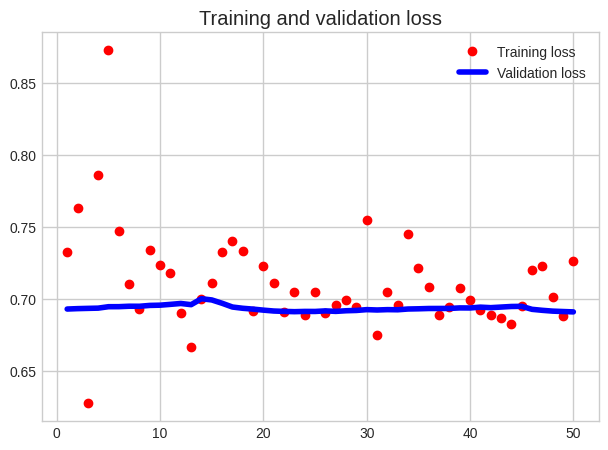

In [142]:
%matplotlib inline
import matplotlib.pyplot as plt
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

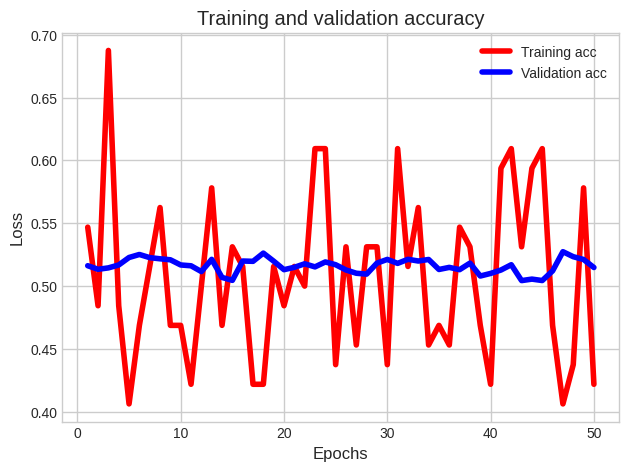

In [143]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [144]:

test_loss, test_acc = model.evaluate_generator(test_gen, steps=3)
print('test acc:', test_acc)
print("test_loss:", test_loss)

test acc: 0.4375
test_loss: 0.7127182483673096


<ipython-input-144-bdbab09721f7>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=3)


### Technical Indicators 2

In [145]:
train_gen = generator(normalized_df2,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df2)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df2,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df2))+1,
                    max_index=round(0.8*len(normalized_df2)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df2,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df2))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df2)) - round(0.6*len(normalized_df2))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df2) - round(0.8*len(normalized_df2))+1 - lookback)

In [146]:
model = Sequential()
model.add(layers.Flatten(input_shape=(lookback // step, normalized_df2.shape[-1]))) 
model.add(layers.Dense(8, activation='relu'))
model.add(layers.Dense(8, activation='relu'))
model.add(layers.Dense(2, activation='softmax'))

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 14)                0         
                                                                 
 dense_3 (Dense)             (None, 8)                 120       
                                                                 
 dense_4 (Dense)             (None, 8)                 72        
                                                                 
 dense_5 (Dense)             (None, 2)                 18        
                                                                 
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________


In [147]:
model.compile(optimizer='rmsprop',
                loss='categorical_crossentropy',
                metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2, 
                              epochs=5, 
                              validation_data=val_gen, 
                              validation_steps=val_steps)

<ipython-input-147-0628d1847258>:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


Epoch 1/5
2/2 [==============================] - 2s 2s/step - loss: 0.7366 - accuracy: 0.4219 - val_loss: 0.6846 - val_accuracy: 0.5526
Epoch 2/5
2/2 [==============================] - 3s 3s/step - loss: 0.7524 - accuracy: 0.4219 - val_loss: 0.6837 - val_accuracy: 0.5542
Epoch 3/5
2/2 [==============================] - 3s 3s/step - loss: 0.6999 - accuracy: 0.6094 - val_loss: 0.6834 - val_accuracy: 0.5563
Epoch 4/5
2/2 [==============================] - 2s 2s/step - loss: 0.7363 - accuracy: 0.3906 - val_loss: 0.6827 - val_accuracy: 0.5524
Epoch 5/5
2/2 [==============================] - 1s 1s/step - loss: 0.7021 - accuracy: 0.5781 - val_loss: 0.6829 - val_accuracy: 0.5582


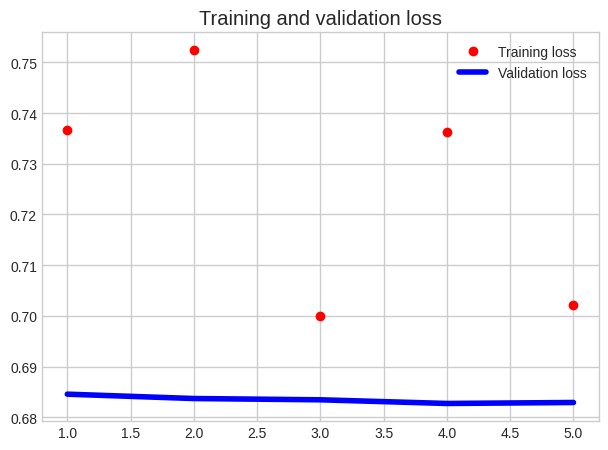

In [148]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

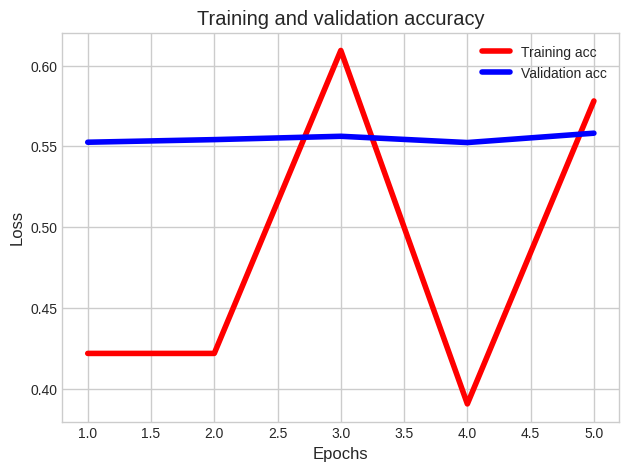

In [150]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [151]:
test_loss, test_acc = model.evaluate_generator(test_gen, steps=5)
print('test acc:', test_acc)
print("test_loss:", test_loss)

<ipython-input-151-19e172851fc2>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=5)


test acc: 0.6312500238418579
test_loss: 0.6560438275337219


### Technical Indicators 3

In [152]:
train_gen = generator(normalized_df3,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df3)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df3,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df3))+1,
                    max_index=round(0.8*len(normalized_df3)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df3,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df3))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df3)) - round(0.6*len(normalized_df3))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df3) - round(0.8*len(normalized_df3))+1 - lookback)

In [153]:
model = Sequential()
model.add(layers.Flatten(input_shape=(lookback // step, normalized_df3.shape[-1]))) 
model.add(layers.Dense(8, activation='relu'))
model.add(layers.Dense(8, activation='relu'))
model.add(layers.Dense(2, activation='softmax'))

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 17)                0         
                                                                 
 dense_6 (Dense)             (None, 8)                 144       
                                                                 
 dense_7 (Dense)             (None, 8)                 72        
                                                                 
 dense_8 (Dense)             (None, 2)                 18        
                                                                 
Total params: 234
Trainable params: 234
Non-trainable params: 0
_________________________________________________________________


In [154]:
model.compile(optimizer='rmsprop',
                loss='categorical_crossentropy',
                metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=5, 
                              epochs=29, 
                              validation_data=val_gen, 
                              validation_steps=val_steps)

Epoch 1/29


<ipython-input-154-235c9db77953>:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


5/5 [==============================] - 6s 818ms/step - loss: 0.7197 - accuracy: 0.4625 - val_loss: 0.8023 - val_accuracy: 0.5067
Epoch 2/29
5/5 [==============================] - 3s 799ms/step - loss: 0.7525 - accuracy: 0.4375 - val_loss: 0.8011 - val_accuracy: 0.5050
Epoch 3/29
5/5 [==============================] - 3s 784ms/step - loss: 0.7091 - accuracy: 0.4938 - val_loss: 0.7994 - val_accuracy: 0.5048
Epoch 4/29
5/5 [==============================] - 5s 1s/step - loss: 0.7010 - accuracy: 0.5000 - val_loss: 0.7990 - val_accuracy: 0.5015
Epoch 5/29
5/5 [==============================] - 3s 706ms/step - loss: 0.7014 - accuracy: 0.4688 - val_loss: 0.7947 - val_accuracy: 0.5049
Epoch 6/29
5/5 [==============================] - 3s 651ms/step - loss: 0.7666 - accuracy: 0.4437 - val_loss: 0.7756 - val_accuracy: 0.5083
Epoch 7/29
5/5 [==============================] - 3s 651ms/step - loss: 0.7238 - accuracy: 0.5250 - val_loss: 0.7660 - val_accuracy: 0.5031
Epoch 8/29
5/5 [==================

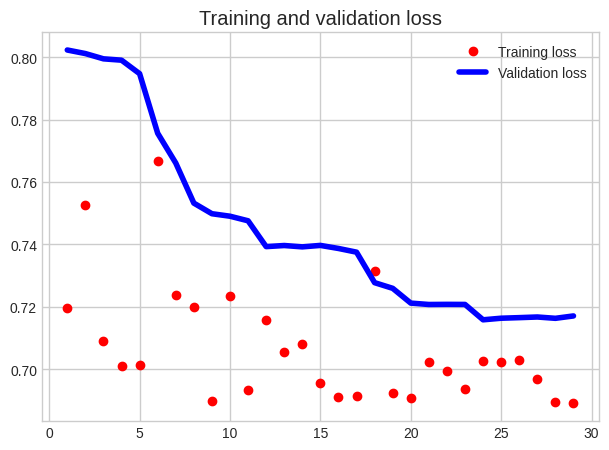

In [155]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

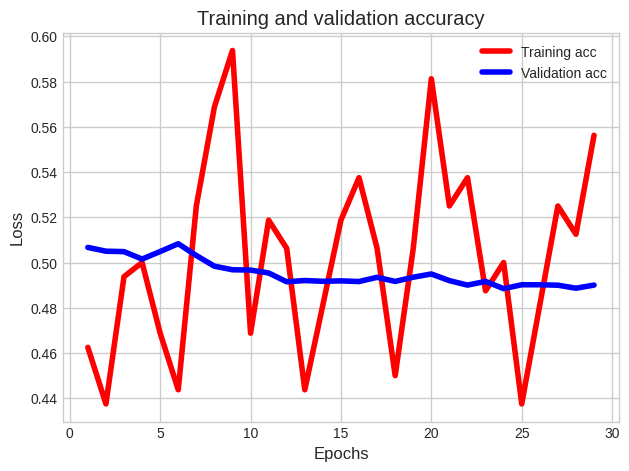

In [157]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [158]:
test_loss, test_acc = model.evaluate_generator(test_gen, steps=4)
print('test acc:', test_acc)
print("test_loss:", test_loss)

<ipython-input-158-58ec684b6568>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=4)


test acc: 0.5546875
test_loss: 0.696849524974823


### Technical Indicators 4

In [159]:
train_gen = generator(normalized_df4,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df4)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df4,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df4))+1,
                    max_index=round(0.8*len(normalized_df4)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df4,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df4))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df4)) - round(0.6*len(normalized_df4))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df4) - round(0.8*len(normalized_df4))+1 - lookback)

In [160]:
model = Sequential()
model.add(layers.Flatten(input_shape=(lookback // step, normalized_df4.shape[-1]))) 
model.add(layers.Dense(8, activation='relu'))
model.add(layers.Dense(8, activation='relu'))
model.add(layers.Dense(2, activation='softmax'))

model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 18)                0         
                                                                 
 dense_9 (Dense)             (None, 8)                 152       
                                                                 
 dense_10 (Dense)            (None, 8)                 72        
                                                                 
 dense_11 (Dense)            (None, 2)                 18        
                                                                 
Total params: 242
Trainable params: 242
Non-trainable params: 0
_________________________________________________________________


In [161]:
model.compile(optimizer='rmsprop',
                loss='categorical_crossentropy',
                metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=5, 
                              epochs=30, 
                              validation_data=val_gen, 
                              validation_steps=val_steps)

Epoch 1/30


<ipython-input-161-31688251949c>:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


5/5 [==============================] - 5s 726ms/step - loss: 0.8317 - accuracy: 0.5125 - val_loss: 0.7552 - val_accuracy: 0.4885
Epoch 2/30
5/5 [==============================] - 4s 922ms/step - loss: 0.7819 - accuracy: 0.4437 - val_loss: 0.7515 - val_accuracy: 0.4884
Epoch 3/30
5/5 [==============================] - 3s 655ms/step - loss: 0.7071 - accuracy: 0.4500 - val_loss: 0.7507 - val_accuracy: 0.4886
Epoch 4/30
5/5 [==============================] - 2s 519ms/step - loss: 0.7069 - accuracy: 0.5188 - val_loss: 0.7496 - val_accuracy: 0.4886
Epoch 5/30
5/5 [==============================] - 2s 527ms/step - loss: 0.6773 - accuracy: 0.5688 - val_loss: 0.7512 - val_accuracy: 0.4885
Epoch 6/30
5/5 [==============================] - 2s 579ms/step - loss: 0.7156 - accuracy: 0.5375 - val_loss: 0.7403 - val_accuracy: 0.4900
Epoch 7/30
5/5 [==============================] - 4s 936ms/step - loss: 0.8114 - accuracy: 0.4437 - val_loss: 0.7217 - val_accuracy: 0.4969
Epoch 8/30
5/5 [===============

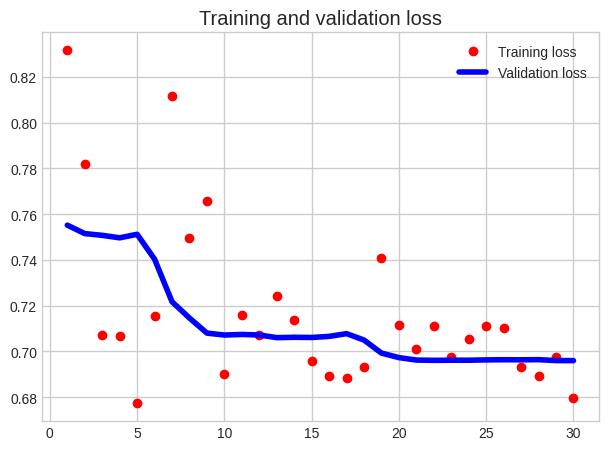

In [162]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

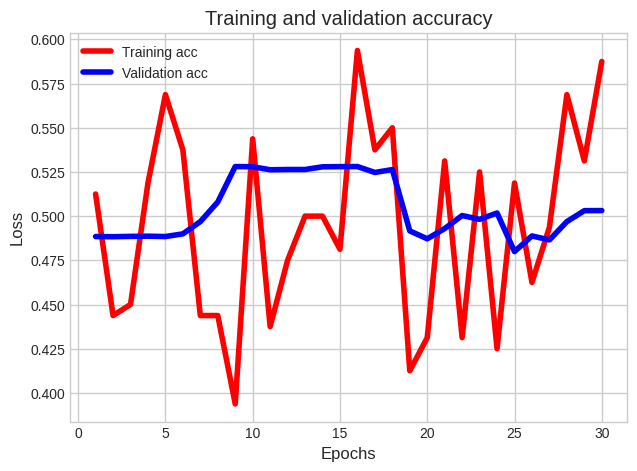

In [164]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [165]:
test_loss, test_acc = model.evaluate_generator(test_gen, steps=5)
print('test acc:', test_acc)
print("test_loss:", test_loss)

<ipython-input-165-19e172851fc2>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=5)


test acc: 0.5062500238418579
test_loss: 0.6939188838005066


LSTM does not performs well for Stock Market Prediction.
Let's try GRU based model for prediction.

## Training and evaluating a GRU-based model

### Technical Indicators 1

In [166]:
train_gen = generator(normalized_df1,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df1)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df1,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df1))+1,
                    max_index=round(0.8*len(normalized_df1)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df1,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df1))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df1)) - round(0.6*len(normalized_df1))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df1) - round(0.8*len(normalized_df1))+1 - lookback)
# How many steps to draw from test_gen in order to see the entire test set

In [167]:
model = Sequential()
model.add(layers.GRU(32, input_shape=(None, normalized_df1.shape[-1])))

model.add(layers.Dense(2, activation='softmax'))

model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 32)                4896      
                                                                 
 dense_12 (Dense)            (None, 2)                 66        
                                                                 
Total params: 4,962
Trainable params: 4,962
Non-trainable params: 0
_________________________________________________________________


In [168]:
model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2,
                              epochs=50,
                              validation_data=val_gen,
                             validation_steps=val_steps)

Epoch 1/50


<ipython-input-168-dae9f394b49e>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


2/2 [==============================] - 14s 6s/step - loss: 0.7240 - accuracy: 0.4844 - val_loss: 0.7070 - val_accuracy: 0.4852
Epoch 2/50
2/2 [==============================] - 3s 3s/step - loss: 0.6768 - accuracy: 0.6094 - val_loss: 0.7091 - val_accuracy: 0.4851
Epoch 3/50
2/2 [==============================] - 5s 5s/step - loss: 0.7250 - accuracy: 0.5000 - val_loss: 0.7068 - val_accuracy: 0.4853
Epoch 4/50
2/2 [==============================] - 5s 5s/step - loss: 0.7031 - accuracy: 0.5625 - val_loss: 0.7060 - val_accuracy: 0.4854
Epoch 5/50
2/2 [==============================] - 3s 3s/step - loss: 0.6960 - accuracy: 0.4688 - val_loss: 0.7035 - val_accuracy: 0.4852
Epoch 6/50
2/2 [==============================] - 2s 2s/step - loss: 0.6905 - accuracy: 0.5312 - val_loss: 0.7027 - val_accuracy: 0.4852
Epoch 7/50
2/2 [==============================] - 2s 2s/step - loss: 0.6987 - accuracy: 0.4531 - val_loss: 0.7013 - val_accuracy: 0.4853
Epoch 8/50
2/2 [==============================] - 5

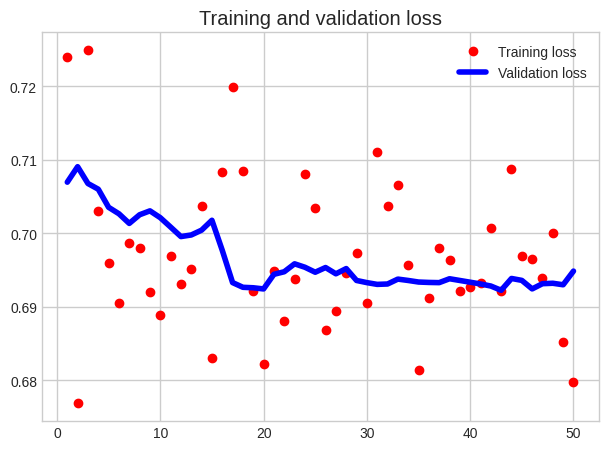

In [169]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

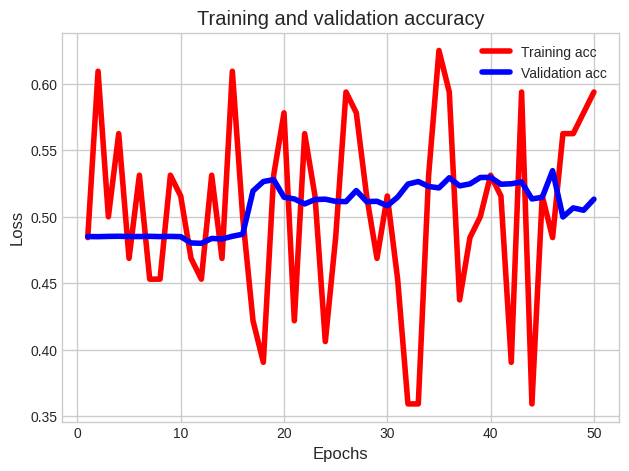

In [171]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [172]:

test_loss, test_acc = model.evaluate_generator(test_gen, steps=1)
print('test acc:', test_acc)
print("test_loss:", test_loss)

test acc: 0.5
test_loss: 0.7097336053848267


<ipython-input-172-4c64fdf431bd>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=1)


### Technical Indicators 2

In [173]:
train_gen = generator(normalized_df2,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df2)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df2,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df2))+1,
                    max_index=round(0.8*len(normalized_df2)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df2,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df2))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df2)) - round(0.6*len(normalized_df2))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df2) - round(0.8*len(normalized_df2))+1 - lookback)

In [174]:
model = Sequential()
model.add(layers.GRU(32, input_shape=(None, normalized_df2.shape[-1])))

model.add(layers.Dense(2, activation='softmax'))

model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 32)                4608      
                                                                 
 dense_13 (Dense)            (None, 2)                 66        
                                                                 
Total params: 4,674
Trainable params: 4,674
Non-trainable params: 0
_________________________________________________________________


In [175]:
model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2,
                              epochs=4,
                              validation_data=val_gen,
                             validation_steps=val_steps)

Epoch 1/4


<ipython-input-175-f039aaf4ec85>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


2/2 [==============================] - 5s 2s/step - loss: 0.7262 - accuracy: 0.3750 - val_loss: 0.7114 - val_accuracy: 0.4293
Epoch 2/4
2/2 [==============================] - 3s 3s/step - loss: 0.7274 - accuracy: 0.4688 - val_loss: 0.7099 - val_accuracy: 0.4474
Epoch 3/4
2/2 [==============================] - 1s 1s/step - loss: 0.7099 - accuracy: 0.4844 - val_loss: 0.7101 - val_accuracy: 0.4360
Epoch 4/4
2/2 [==============================] - 3s 3s/step - loss: 0.7190 - accuracy: 0.3906 - val_loss: 0.7090 - val_accuracy: 0.4439


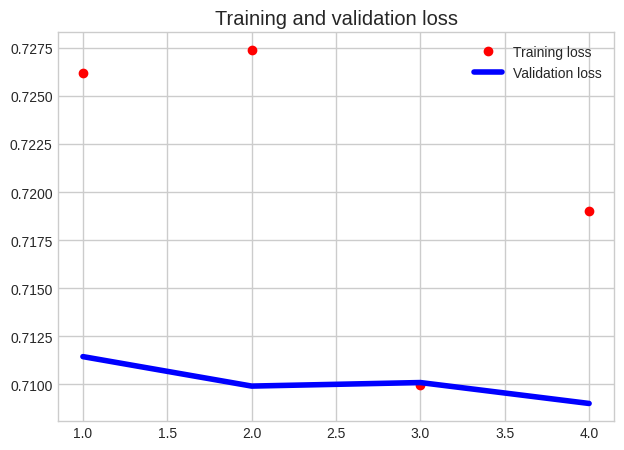

In [176]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

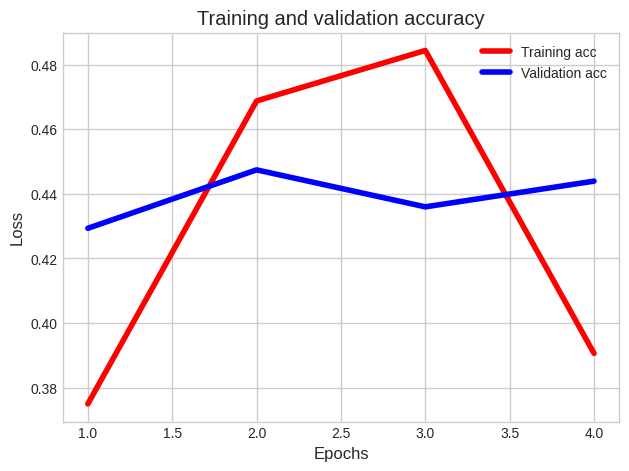

In [177]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [178]:
test_loss, test_acc = model.evaluate_generator(test_gen, steps=2)
print('test acc:', test_acc)
print("test_loss:", test_loss)

test acc: 0.625
test_loss: 0.6939014196395874


<ipython-input-178-39616f51ec9c>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=2)


### Technical Indicators 3

In [179]:
train_gen = generator(normalized_df3,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df3)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df3,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df3))+1,
                    max_index=round(0.8*len(normalized_df3)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df3,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df3))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df3)) - round(0.6*len(normalized_df3))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df3) - round(0.8*len(normalized_df3))+1 - lookback)

In [180]:
model = Sequential()
model.add(layers.GRU(32, input_shape=(None, normalized_df3.shape[-1])))

model.add(layers.Dense(2, activation='softmax'))

model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_2 (GRU)                 (None, 32)                4896      
                                                                 
 dense_14 (Dense)            (None, 2)                 66        
                                                                 
Total params: 4,962
Trainable params: 4,962
Non-trainable params: 0
_________________________________________________________________


In [181]:
model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2,
                              epochs=6,
                              validation_data=val_gen,
                             validation_steps=val_steps)

Epoch 1/6


<ipython-input-181-976af63b3ecc>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


2/2 [==============================] - 5s 2s/step - loss: 0.7355 - accuracy: 0.4062 - val_loss: 0.7196 - val_accuracy: 0.4623
Epoch 2/6
2/2 [==============================] - 2s 2s/step - loss: 0.7048 - accuracy: 0.5156 - val_loss: 0.7203 - val_accuracy: 0.4391
Epoch 3/6
2/2 [==============================] - 1s 1s/step - loss: 0.6892 - accuracy: 0.5312 - val_loss: 0.7207 - val_accuracy: 0.4409
Epoch 4/6
2/2 [==============================] - 3s 3s/step - loss: 0.7284 - accuracy: 0.4375 - val_loss: 0.7196 - val_accuracy: 0.4439
Epoch 5/6
2/2 [==============================] - 3s 3s/step - loss: 0.6916 - accuracy: 0.5312 - val_loss: 0.7197 - val_accuracy: 0.4508
Epoch 6/6
2/2 [==============================] - 2s 2s/step - loss: 0.6929 - accuracy: 0.5469 - val_loss: 0.7195 - val_accuracy: 0.4471


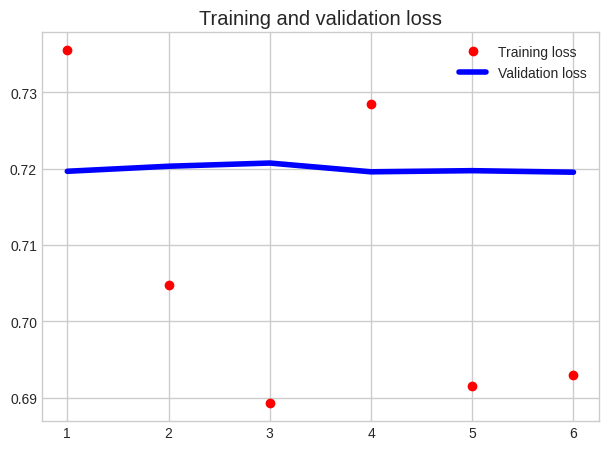

In [182]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

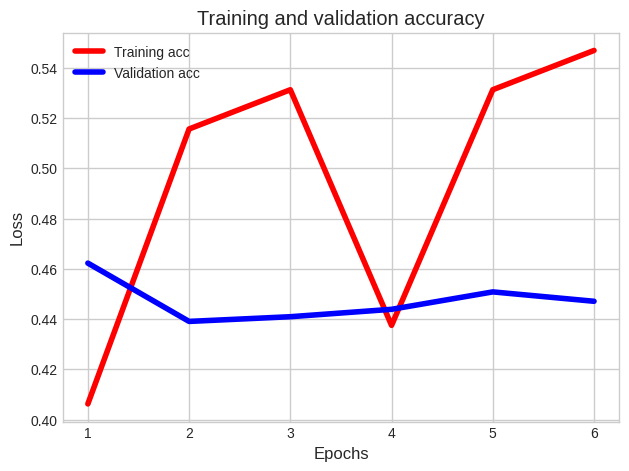

In [183]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [184]:
test_loss, test_acc = model.evaluate_generator(test_gen, steps=7)
print('test acc:', test_acc)
print("test_loss:", test_loss)

test acc: 0.5133928656578064
test_loss: 0.7045640349388123


<ipython-input-184-ffe07ceeb2bd>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=7)


### Technical Indicators 4

In [185]:
train_gen = generator(normalized_df4,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df4)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df4,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df4))+1,
                    max_index=round(0.8*len(normalized_df4)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df4,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df4))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df4)) - round(0.6*len(normalized_df4))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df4) - round(0.8*len(normalized_df4))+1 - lookback)

In [186]:
model = Sequential()
model.add(layers.GRU(32, input_shape=(None, normalized_df4.shape[-1])))

model.add(layers.Dense(2, activation='softmax'))

model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_3 (GRU)                 (None, 32)                4992      
                                                                 
 dense_15 (Dense)            (None, 2)                 66        
                                                                 
Total params: 5,058
Trainable params: 5,058
Non-trainable params: 0
_________________________________________________________________


In [187]:
model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2,
                              epochs=15,
                              validation_data=val_gen,
                             validation_steps=val_steps)

Epoch 1/15


<ipython-input-187-81e48a0a2a00>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


2/2 [==============================] - 7s 3s/step - loss: 0.6872 - accuracy: 0.5312 - val_loss: 0.7062 - val_accuracy: 0.5100
Epoch 2/15
2/2 [==============================] - 1s 1s/step - loss: 0.7364 - accuracy: 0.4219 - val_loss: 0.7026 - val_accuracy: 0.5066
Epoch 3/15
2/2 [==============================] - 2s 2s/step - loss: 0.7251 - accuracy: 0.4062 - val_loss: 0.7031 - val_accuracy: 0.5032
Epoch 4/15
2/2 [==============================] - 3s 3s/step - loss: 0.7055 - accuracy: 0.4531 - val_loss: 0.7026 - val_accuracy: 0.5081
Epoch 5/15
2/2 [==============================] - 3s 3s/step - loss: 0.6921 - accuracy: 0.5000 - val_loss: 0.7039 - val_accuracy: 0.5066
Epoch 6/15
2/2 [==============================] - 3s 3s/step - loss: 0.6828 - accuracy: 0.6094 - val_loss: 0.7047 - val_accuracy: 0.5083
Epoch 7/15
2/2 [==============================] - 3s 3s/step - loss: 0.6942 - accuracy: 0.5625 - val_loss: 0.7041 - val_accuracy: 0.5031
Epoch 8/15
2/2 [==============================] - 3s

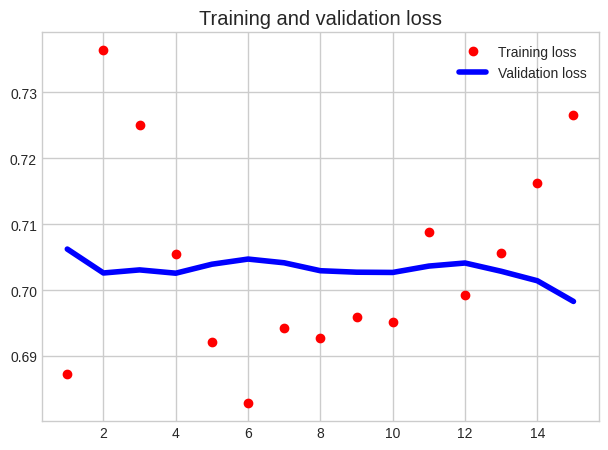

In [188]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

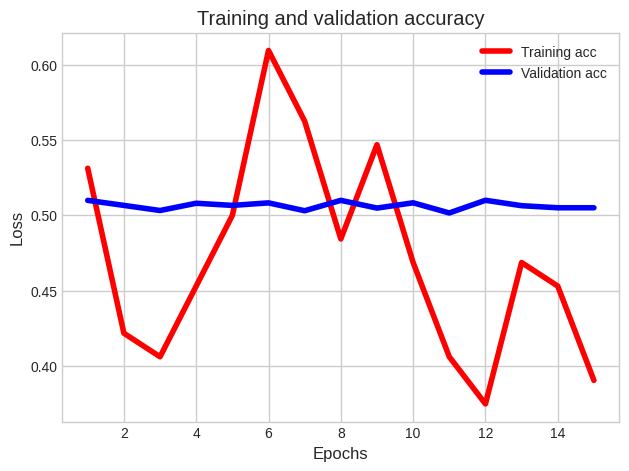

In [189]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [190]:
test_loss, test_acc = model.evaluate_generator(test_gen, steps=7)
print('test acc:', test_acc)
print("test_loss:", test_loss)

test acc: 0.5133928656578064
test_loss: 0.6935251355171204


<ipython-input-190-ffe07ceeb2bd>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=7)


GRU model does not performs any better than LSTMl for Stock Market Prediction.
Let's try dropout-regularized GRU based model for prediction.

# Training and evaluating a dropout-regularized GRU-based model

### Technical Indicator 1

In [191]:
train_gen = generator(normalized_df1,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df1)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df1,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df1))+1,
                    max_index=round(0.8*len(normalized_df1)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df1,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df1))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df1)) - round(0.6*len(normalized_df1))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df1) - round(0.8*len(normalized_df1))+1 - lookback)

In [192]:
model = Sequential()
model.add(layers.GRU(32,
                     dropout=0.2,
                     recurrent_dropout=0.4,
                     input_shape=(None, normalized_df1.shape[-1])))
model.add(layers.Dense(2, activation='softmax'))
model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2,
                              epochs=50,
                              validation_data=val_gen,
                             validation_steps=val_steps)

Epoch 1/50


<ipython-input-192-0a25eb31189b>:8: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


2/2 [==============================] - 6s 2s/step - loss: 0.7031 - accuracy: 0.5312 - val_loss: 0.6913 - val_accuracy: 0.5261
Epoch 2/50
2/2 [==============================] - 3s 3s/step - loss: 0.7425 - accuracy: 0.4062 - val_loss: 0.6916 - val_accuracy: 0.5115
Epoch 3/50
2/2 [==============================] - 2s 2s/step - loss: 0.7053 - accuracy: 0.4844 - val_loss: 0.6917 - val_accuracy: 0.5130
Epoch 4/50
2/2 [==============================] - 3s 3s/step - loss: 0.6924 - accuracy: 0.5312 - val_loss: 0.6917 - val_accuracy: 0.5231
Epoch 5/50
2/2 [==============================] - 3s 3s/step - loss: 0.6662 - accuracy: 0.5938 - val_loss: 0.6917 - val_accuracy: 0.5049
Epoch 6/50
2/2 [==============================] - 3s 3s/step - loss: 0.6938 - accuracy: 0.5156 - val_loss: 0.6919 - val_accuracy: 0.5017
Epoch 7/50
2/2 [==============================] - 1s 1s/step - loss: 0.6714 - accuracy: 0.5625 - val_loss: 0.6917 - val_accuracy: 0.5099
Epoch 8/50
2/2 [==============================] - 3s

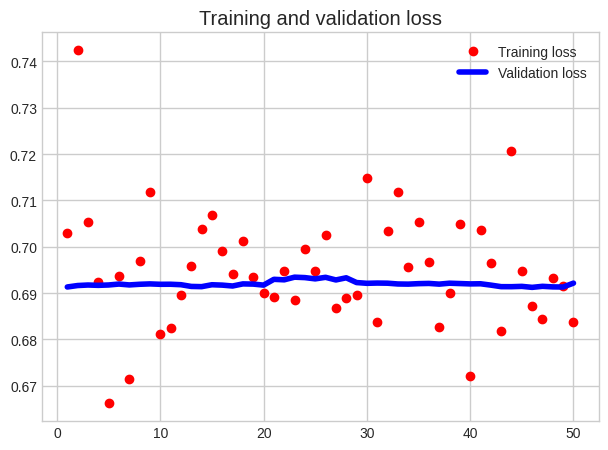

In [193]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

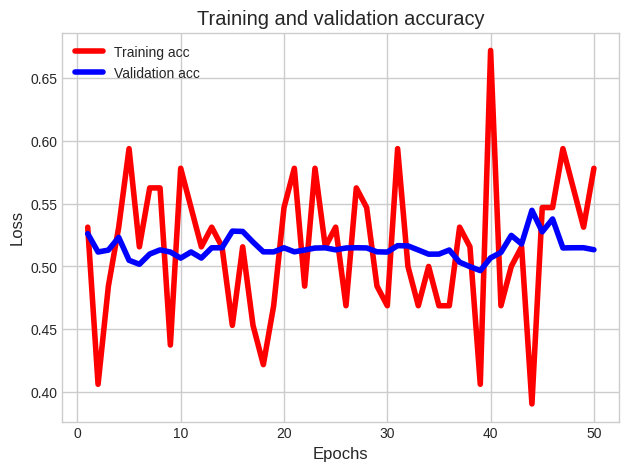

In [195]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [196]:

test_loss, test_acc = model.evaluate_generator(test_gen, steps=3)
print('test acc:', test_acc)
print("test_loss:", test_loss)

test acc: 0.4375
test_loss: 0.7178217768669128


<ipython-input-196-bdbab09721f7>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=3)


### Technical Indicators 2

In [197]:
train_gen = generator(normalized_df2,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df2)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df2,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df2))+1,
                    max_index=round(0.8*len(normalized_df2)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df2,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df2))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df2)) - round(0.6*len(normalized_df2))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df2) - round(0.8*len(normalized_df2))+1 - lookback)

In [198]:
model = Sequential()
model.add(layers.GRU(32,
                     dropout=0.2,
                     recurrent_dropout=0.4,
                     input_shape=(None, normalized_df2.shape[-1])))
model.add(layers.Dense(2, activation='softmax'))
model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2,
                              epochs=36,
                              validation_data=val_gen,
                             validation_steps=val_steps)

Epoch 1/36


<ipython-input-198-e0b95dfe807b>:8: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


2/2 [==============================] - 6s 3s/step - loss: 0.7008 - accuracy: 0.5781 - val_loss: 0.7350 - val_accuracy: 0.4198
Epoch 2/36
2/2 [==============================] - 3s 3s/step - loss: 0.7557 - accuracy: 0.5781 - val_loss: 0.7298 - val_accuracy: 0.4162
Epoch 3/36
2/2 [==============================] - 2s 2s/step - loss: 0.7514 - accuracy: 0.4688 - val_loss: 0.7270 - val_accuracy: 0.4206
Epoch 4/36
2/2 [==============================] - 3s 3s/step - loss: 0.7495 - accuracy: 0.4062 - val_loss: 0.7231 - val_accuracy: 0.4278
Epoch 5/36
2/2 [==============================] - 2s 2s/step - loss: 0.7238 - accuracy: 0.5156 - val_loss: 0.7226 - val_accuracy: 0.4241
Epoch 6/36
2/2 [==============================] - 3s 3s/step - loss: 0.7027 - accuracy: 0.5469 - val_loss: 0.7215 - val_accuracy: 0.4264
Epoch 7/36
2/2 [==============================] - 3s 3s/step - loss: 0.7026 - accuracy: 0.6094 - val_loss: 0.7224 - val_accuracy: 0.4289
Epoch 8/36
2/2 [==============================] - 3s

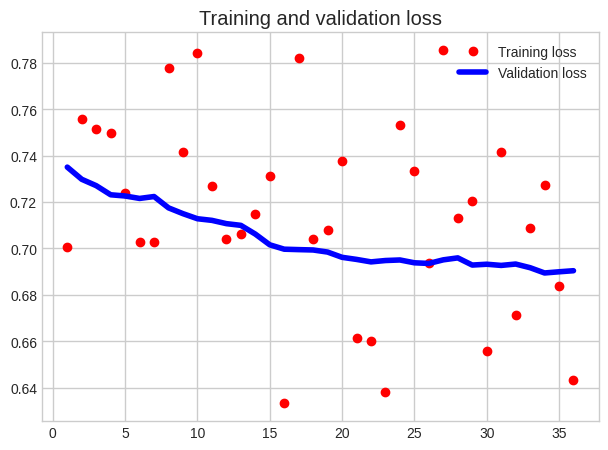

In [199]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

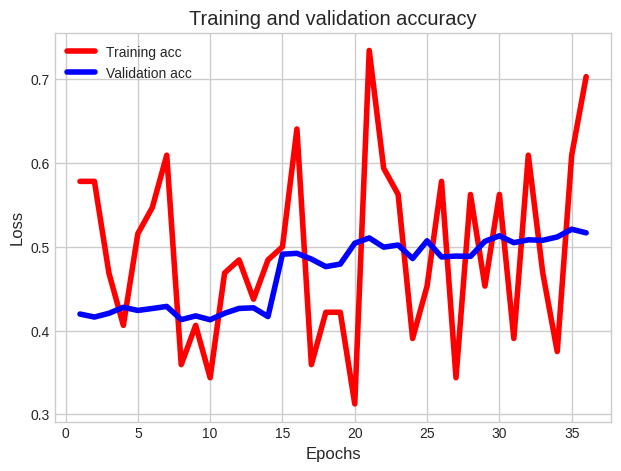

In [200]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [201]:
test_loss, test_acc = model.evaluate_generator(test_gen, steps=4)
print('test acc:', test_acc)
print("test_loss:", test_loss)

test acc: 0.484375
test_loss: 0.7052046060562134


<ipython-input-201-58ec684b6568>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=4)


### Technical Indicators 3

In [202]:
train_gen = generator(normalized_df3,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df3)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df3,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df3))+1,
                    max_index=round(0.8*len(normalized_df3)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df3,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df3))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df3)) - round(0.6*len(normalized_df3))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df3) - round(0.8*len(normalized_df3))+1 - lookback)

In [203]:
model = Sequential()
model.add(layers.GRU(32,
                     dropout=0.2,
                     recurrent_dropout=0.4,
                     input_shape=(None, normalized_df3.shape[-1])))
model.add(layers.Dense(2, activation='softmax'))
model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2,
                              epochs=20,
                              validation_data=val_gen,
                             validation_steps=val_steps)

Epoch 1/20


<ipython-input-203-ef4d77e1e5a6>:8: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


2/2 [==============================] - 7s 3s/step - loss: 0.7073 - accuracy: 0.5156 - val_loss: 0.7001 - val_accuracy: 0.4982
Epoch 2/20
2/2 [==============================] - 3s 3s/step - loss: 0.7367 - accuracy: 0.4531 - val_loss: 0.7051 - val_accuracy: 0.4783
Epoch 3/20
2/2 [==============================] - 3s 3s/step - loss: 0.7513 - accuracy: 0.3125 - val_loss: 0.7041 - val_accuracy: 0.4821
Epoch 4/20
2/2 [==============================] - 3s 3s/step - loss: 0.7311 - accuracy: 0.4844 - val_loss: 0.7037 - val_accuracy: 0.4836
Epoch 5/20
2/2 [==============================] - 3s 3s/step - loss: 0.7120 - accuracy: 0.4531 - val_loss: 0.7003 - val_accuracy: 0.4984
Epoch 6/20
2/2 [==============================] - 3s 3s/step - loss: 0.6955 - accuracy: 0.4844 - val_loss: 0.7003 - val_accuracy: 0.4968
Epoch 7/20
2/2 [==============================] - 3s 3s/step - loss: 0.7138 - accuracy: 0.4688 - val_loss: 0.6995 - val_accuracy: 0.5017
Epoch 8/20
2/2 [==============================] - 3s

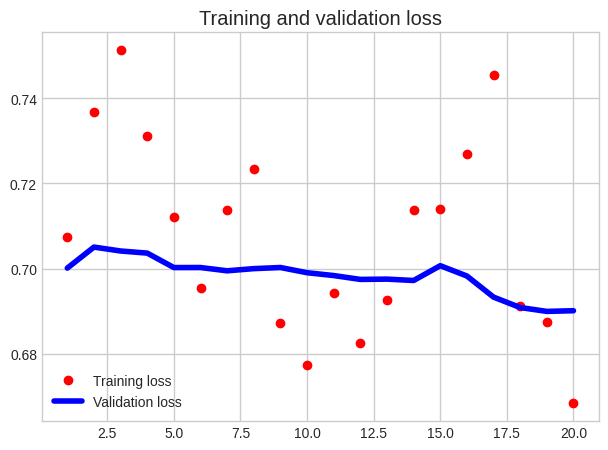

In [204]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

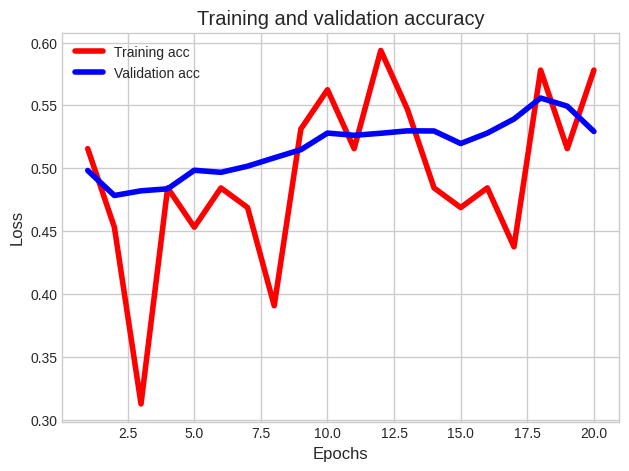

In [205]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [206]:
test_loss, test_acc = model.evaluate_generator(test_gen, steps=4)
print('test acc:', test_acc)
print("test_loss:", test_loss)

test acc: 0.515625
test_loss: 0.7050726413726807


<ipython-input-206-58ec684b6568>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=4)


### Technical Indicators 4

In [207]:
train_gen = generator(normalized_df4,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df4)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df4,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df4))+1,
                    max_index=round(0.8*len(normalized_df4)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df4,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df4))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df4)) - round(0.6*len(normalized_df4))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df4) - round(0.8*len(normalized_df4))+1 - lookback)

In [208]:
model = Sequential()
model.add(layers.GRU(32,
                     dropout=0.2,
                     recurrent_dropout=0.4,
                     input_shape=(None, normalized_df4.shape[-1])))
model.add(layers.Dense(2, activation='softmax'))
model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2,
                              epochs=13,
                              validation_data=val_gen,
                             validation_steps=val_steps)

Epoch 1/13


<ipython-input-208-4765dae04be3>:8: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


2/2 [==============================] - 6s 3s/step - loss: 0.7858 - accuracy: 0.4375 - val_loss: 0.7396 - val_accuracy: 0.4852
Epoch 2/13
2/2 [==============================] - 3s 3s/step - loss: 0.7307 - accuracy: 0.5938 - val_loss: 0.7336 - val_accuracy: 0.4851
Epoch 3/13
2/2 [==============================] - 2s 2s/step - loss: 0.8126 - accuracy: 0.5000 - val_loss: 0.7263 - val_accuracy: 0.4853
Epoch 4/13
2/2 [==============================] - 3s 3s/step - loss: 0.7666 - accuracy: 0.5469 - val_loss: 0.7224 - val_accuracy: 0.4854
Epoch 5/13
2/2 [==============================] - 2s 2s/step - loss: 0.8017 - accuracy: 0.5000 - val_loss: 0.7183 - val_accuracy: 0.4901
Epoch 6/13
2/2 [==============================] - 2s 1s/step - loss: 0.7334 - accuracy: 0.5000 - val_loss: 0.7145 - val_accuracy: 0.4737
Epoch 7/13
2/2 [==============================] - 3s 3s/step - loss: 0.7237 - accuracy: 0.4219 - val_loss: 0.7114 - val_accuracy: 0.4804
Epoch 8/13
2/2 [==============================] - 2s

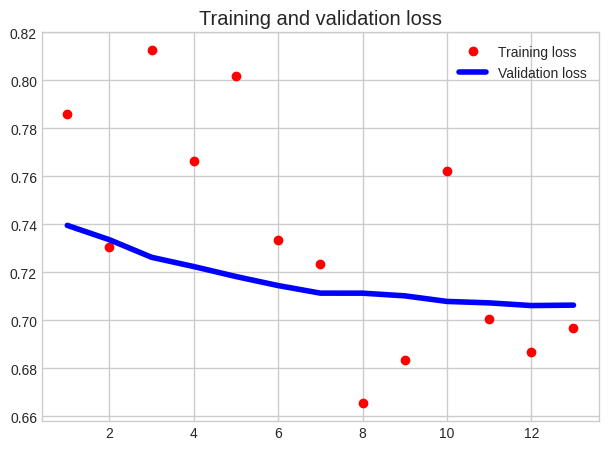

In [209]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

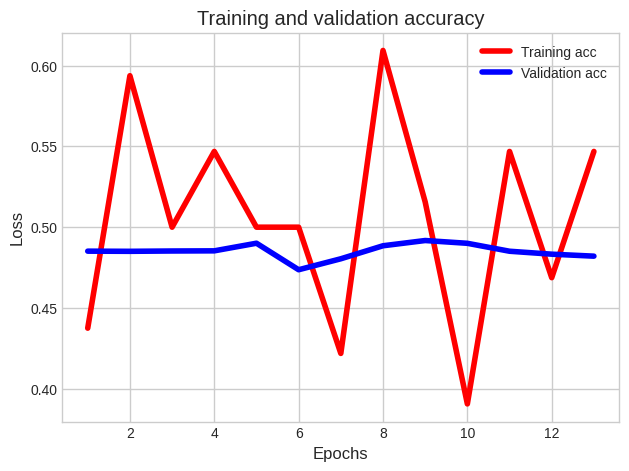

In [210]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [211]:
test_loss, test_acc = model.evaluate_generator(test_gen, steps=7)
print('test acc:', test_acc)
print("test_loss:", test_loss)

test acc: 0.5
test_loss: 0.7045716047286987


<ipython-input-211-ffe07ceeb2bd>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=7)


The Performance still does not increase.
Let's try Stacking Recurrent Layers.

# Stacking Recurrent Layers

## Training and evaluating a dropout-regularized, stacked GRU model

### Technical Indicators 1

In [212]:
train_gen = generator(normalized_df1,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df1)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df1,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df1))+1,
                    max_index=round(0.8*len(normalized_df1)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df1,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df1))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df1)) - round(0.6*len(normalized_df1))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df1) - round(0.8*len(normalized_df1))+1 - lookback)

In [213]:
model = Sequential()
model.add(layers.GRU(32,
                     dropout=0.1,
                     recurrent_dropout=0.5,
                     return_sequences=True,
                     input_shape=(None, normalized_df1.shape[-1])))
model.add(layers.GRU(64, activation='relu',
                     dropout=0.1,
                     recurrent_dropout=0.5))
model.add(layers.Dense(2, activation='softmax'))
model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2,
                              epochs=5,
                              validation_data=val_gen,
                             validation_steps=val_steps)

<ipython-input-213-dc99750aac91>:12: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


Epoch 1/5
2/2 [==============================] - 12s 3s/step - loss: 0.6949 - accuracy: 0.5312 - val_loss: 0.6940 - val_accuracy: 0.4852
Epoch 2/5
2/2 [==============================] - 3s 3s/step - loss: 0.7006 - accuracy: 0.4375 - val_loss: 0.6940 - val_accuracy: 0.4851
Epoch 3/5
2/2 [==============================] - 3s 3s/step - loss: 0.7005 - accuracy: 0.3750 - val_loss: 0.6940 - val_accuracy: 0.4853
Epoch 4/5
2/2 [==============================] - 2s 2s/step - loss: 0.6932 - accuracy: 0.5312 - val_loss: 0.6940 - val_accuracy: 0.4837
Epoch 5/5
2/2 [==============================] - 2s 2s/step - loss: 0.6919 - accuracy: 0.5156 - val_loss: 0.6939 - val_accuracy: 0.4851


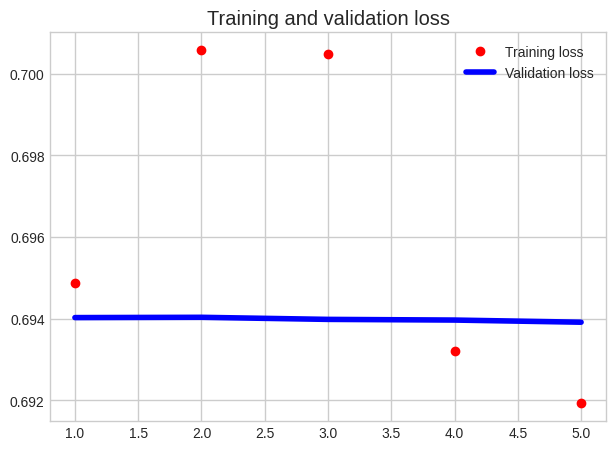

In [214]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

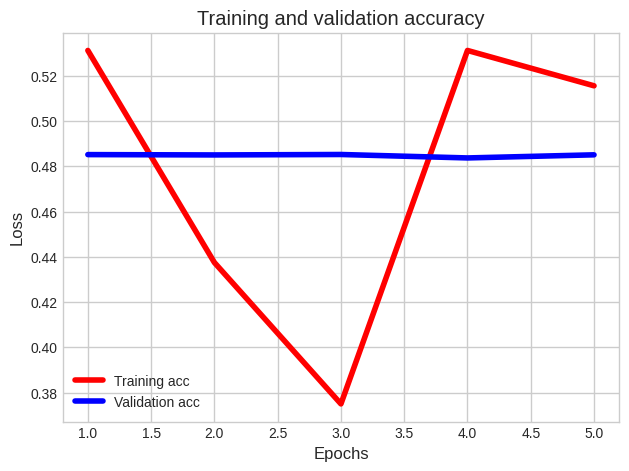

In [215]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [216]:

test_loss, test_acc = model.evaluate_generator(test_gen, steps=10)
print('test acc:', test_acc)
print("test_loss:", test_loss)

<ipython-input-216-ec1b0106d0f1>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=10)


test acc: 0.4281249940395355
test_loss: 0.69919353723526


### Technical Indicators 2

In [217]:
train_gen = generator(normalized_df2,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df2)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df2,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df2))+1,
                    max_index=round(0.8*len(normalized_df2)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df2,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df2))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df2)) - round(0.6*len(normalized_df2))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df2) - round(0.8*len(normalized_df2))+1 - lookback)

In [218]:
model = Sequential()
model.add(layers.GRU(32,
                     dropout=0.1,
                     recurrent_dropout=0.5,
                     return_sequences=True,
                     input_shape=(None, normalized_df2.shape[-1])))
model.add(layers.GRU(64, activation='relu',
                     dropout=0.1,
                     recurrent_dropout=0.5))
model.add(layers.Dense(2, activation = 'softmax'))
model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2,
                              epochs=10,
                              validation_data=val_gen,
                             validation_steps=val_steps)

Epoch 1/10


<ipython-input-218-0799353a963b>:12: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


2/2 [==============================] - 8s 3s/step - loss: 0.6995 - accuracy: 0.5938 - val_loss: 0.6921 - val_accuracy: 0.5539
Epoch 2/10
2/2 [==============================] - 3s 3s/step - loss: 0.6914 - accuracy: 0.5625 - val_loss: 0.6911 - val_accuracy: 0.5563
Epoch 3/10
2/2 [==============================] - 2s 2s/step - loss: 0.7038 - accuracy: 0.5000 - val_loss: 0.6911 - val_accuracy: 0.5557
Epoch 4/10
2/2 [==============================] - 2s 2s/step - loss: 0.6904 - accuracy: 0.5312 - val_loss: 0.6910 - val_accuracy: 0.5564
Epoch 5/10
2/2 [==============================] - 3s 3s/step - loss: 0.7017 - accuracy: 0.4688 - val_loss: 0.6912 - val_accuracy: 0.5558
Epoch 6/10
2/2 [==============================] - 3s 3s/step - loss: 0.6831 - accuracy: 0.6406 - val_loss: 0.6907 - val_accuracy: 0.5556
Epoch 7/10
2/2 [==============================] - 2s 2s/step - loss: 0.6835 - accuracy: 0.5781 - val_loss: 0.6905 - val_accuracy: 0.5566
Epoch 8/10
2/2 [==============================] - 2s

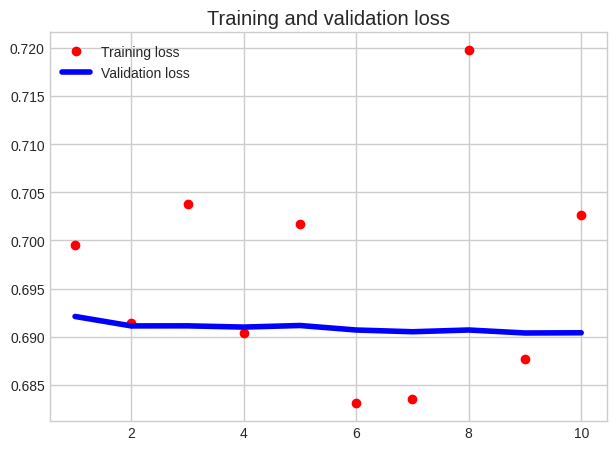

In [219]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

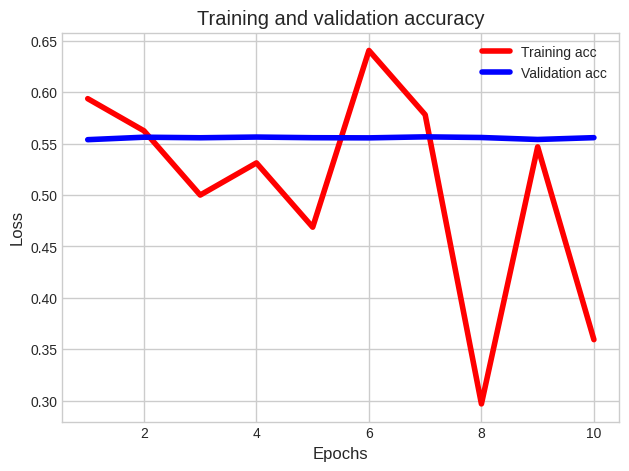

In [220]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [221]:

test_loss, test_acc = model.evaluate_generator(test_gen, steps=3)
print('test acc:', test_acc)
print("test_loss:", test_loss)

test acc: 0.7291666865348816
test_loss: 0.6818740963935852


<ipython-input-221-bdbab09721f7>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=3)


### Technical Indicators 3

In [222]:
train_gen = generator(normalized_df3,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df3)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df3,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df3))+1,
                    max_index=round(0.8*len(normalized_df3)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df3,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df3))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df3)) - round(0.6*len(normalized_df3))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df3) - round(0.8*len(normalized_df3))+1 - lookback)

In [223]:
model = Sequential()
model.add(layers.GRU(32,
                     dropout=0.1,
                     recurrent_dropout=0.5,
                     return_sequences=True,
                     input_shape=(None, normalized_df3.shape[-1])))
model.add(layers.GRU(64, activation='relu',
                     dropout=0.1,
                     recurrent_dropout=0.5))
model.add(layers.Dense(2, activation='softmax'))
model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2,
                              epochs=50,
                              validation_data=val_gen,
                             validation_steps=val_steps)

Epoch 1/50


<ipython-input-223-d8f0f3cfec82>:12: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


2/2 [==============================] - 9s 2s/step - loss: 0.6942 - accuracy: 0.4531 - val_loss: 0.6944 - val_accuracy: 0.5000
Epoch 2/50
2/2 [==============================] - 2s 2s/step - loss: 0.7037 - accuracy: 0.4375 - val_loss: 0.6942 - val_accuracy: 0.4935
Epoch 3/50
2/2 [==============================] - 3s 3s/step - loss: 0.7039 - accuracy: 0.3438 - val_loss: 0.6943 - val_accuracy: 0.4898
Epoch 4/50
2/2 [==============================] - 3s 3s/step - loss: 0.6908 - accuracy: 0.5625 - val_loss: 0.6941 - val_accuracy: 0.4987
Epoch 5/50
2/2 [==============================] - 2s 2s/step - loss: 0.7032 - accuracy: 0.4688 - val_loss: 0.6942 - val_accuracy: 0.5014
Epoch 6/50
2/2 [==============================] - 2s 2s/step - loss: 0.6942 - accuracy: 0.4688 - val_loss: 0.6943 - val_accuracy: 0.4986
Epoch 7/50
2/2 [==============================] - 3s 3s/step - loss: 0.6951 - accuracy: 0.4844 - val_loss: 0.6943 - val_accuracy: 0.4915
Epoch 8/50
2/2 [==============================] - 3s

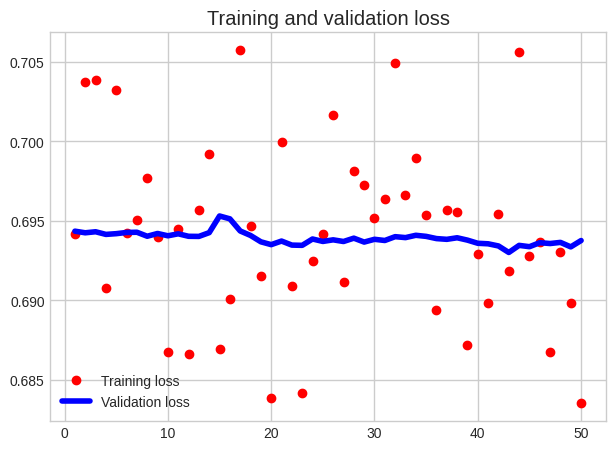

In [224]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

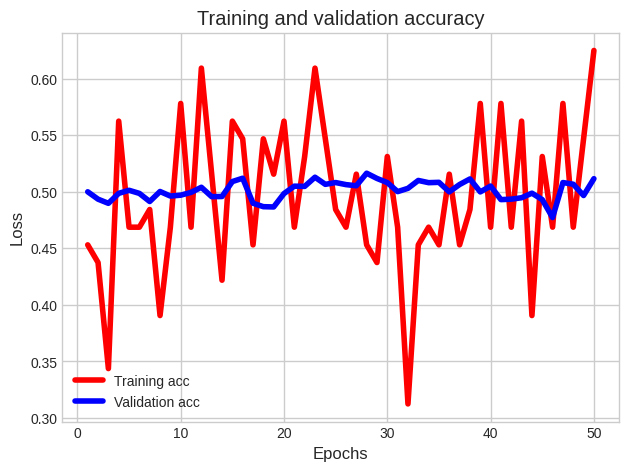

In [225]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [226]:

test_loss, test_acc = model.evaluate_generator(test_gen, steps=5)
print('test acc:', test_acc)
print("test_loss:", test_loss)

test acc: 0.4937500059604645
test_loss: 0.6957296133041382


<ipython-input-226-19e172851fc2>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=5)


### Technical Indicators 4

In [227]:
train_gen = generator(normalized_df4,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=round(0.6*len(normalized_df4)),
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(normalized_df4,
                    lookback=lookback,
                    delay=delay,
                    min_index=round(0.6*len(normalized_df4))+1,
                    max_index=round(0.8*len(normalized_df4)),
                    step=step,
                    batch_size=batch_size)
test_gen = generator(normalized_df4,
                     lookback=lookback,
                     delay=delay,
                     min_index=round(0.8*len(normalized_df4))+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

val_steps = (round(0.8*len(normalized_df4)) - round(0.6*len(normalized_df4))+1 - lookback) # how many steps to draw from val_gen in order to see the entire validation set
test_steps = (len(normalized_df4) - round(0.8*len(normalized_df4))+1 - lookback)

In [228]:
model = Sequential()
model.add(layers.GRU(32,
                     dropout=0.1,
                     recurrent_dropout=0.5,
                     return_sequences=True,
                     input_shape=(None, normalized_df4.shape[-1])))
model.add(layers.GRU(64, activation='relu',
                     dropout=0.1,
                     recurrent_dropout=0.5))
model.add(layers.Dense(2, activation='softmax'))
model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit_generator(train_gen,
                              steps_per_epoch=2,
                              epochs=50,
                              validation_data=val_gen,
                             validation_steps=val_steps)

Epoch 1/50


<ipython-input-228-185ae04cb073>:12: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


2/2 [==============================] - 9s 2s/step - loss: 0.6915 - accuracy: 0.5625 - val_loss: 0.6921 - val_accuracy: 0.5130
Epoch 2/50
2/2 [==============================] - 3s 3s/step - loss: 0.6967 - accuracy: 0.5000 - val_loss: 0.6925 - val_accuracy: 0.5116
Epoch 3/50
2/2 [==============================] - 3s 3s/step - loss: 0.7026 - accuracy: 0.3438 - val_loss: 0.6925 - val_accuracy: 0.5148
Epoch 4/50
2/2 [==============================] - 2s 2s/step - loss: 0.6889 - accuracy: 0.5625 - val_loss: 0.6926 - val_accuracy: 0.5115
Epoch 5/50
2/2 [==============================] - 2s 2s/step - loss: 0.7005 - accuracy: 0.3906 - val_loss: 0.6924 - val_accuracy: 0.5214
Epoch 6/50
2/2 [==============================] - 3s 3s/step - loss: 0.6921 - accuracy: 0.5469 - val_loss: 0.6924 - val_accuracy: 0.5183
Epoch 7/50
2/2 [==============================] - 3s 3s/step - loss: 0.6915 - accuracy: 0.5469 - val_loss: 0.6922 - val_accuracy: 0.5130
Epoch 8/50
2/2 [==============================] - 3s

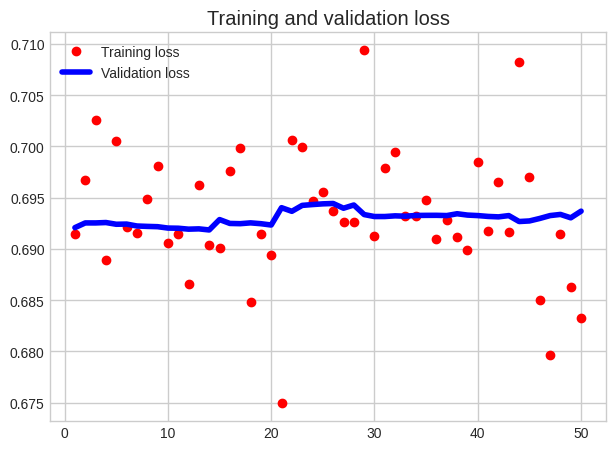

In [232]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

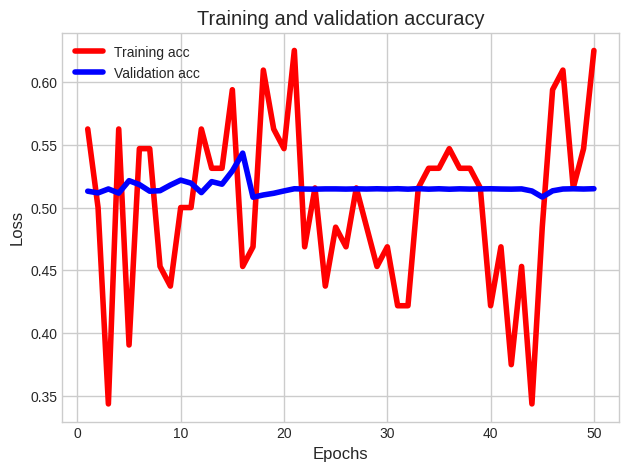

In [233]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [231]:
test_loss, test_acc = model.evaluate_generator(test_gen, steps=5)
print('test acc:', test_acc)
print("test_loss:", test_loss)

test acc: 0.4937500059604645
test_loss: 0.6938226222991943


<ipython-input-231-19e172851fc2>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_gen, steps=5)


# Conclusion
LSTM and GRU does not works for Stock Market data.
Technical Indicators were also used for training since it shows how prices and volumes changes and shows their relationships.
It can be seen that accuracy does not increase for any method. 
And is not even better than baseline prediction (50%) in some cases.
Also, it can be seen that no set of Technical Indicators performs any better than other sets of Technical Indicators.
